In [1]:
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import f1_score
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score
from sklearn import metrics
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import time
%config Completer.use_jedi = False
from sklearn.metrics import classification_report
from kneed import DataGenerator, KneeLocator
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt


Bad key “backend in file /Users/bhkash/.matplotlib/matplotlibrc, line 1 ('“backend: TkAgg”')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.4/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
random_seed = 2


import warnings
warnings.filterwarnings('ignore')

In [3]:
data_b = pd.read_csv("BreastCancer.csv", index_col="id")
data_b["label"] = 0
#label
data_b.label[data_b.diagnosis == 'B'] = 0
data_b.label[data_b.diagnosis == 'M'] = 1
data_b = data_b.drop(columns=['Unnamed: 32', 'diagnosis'])
data_b.head()
#Split
X_b_pre_scale = data_b.iloc[:,:-1]
y_b = data_b['label']

X_train, X_test, y_train, y_test = train_test_split(X_b_pre_scale, y_b, test_size=0.2, stratify = y_b, random_state = 1)
print(len(X_train),' samples in training data\n',
      len(X_test),' samples in test data\n', )
#Scale
scaler = preprocessing.StandardScaler().fit(X_train)
X_b = scaler.transform(X_train)
X_b_test = scaler.transform(X_test)
y_b = y_train
y_b_test = y_test

print(len(X_b), len(y_b),' samples in scaled training data\n',
      len(X_b_test), len(y_b_test),' samples in scaled test data\n', )


455  samples in training data
 114  samples in test data

455 455  samples in scaled training data
 114 114  samples in scaled test data



In [120]:
data_red = pd.read_csv("winequality-red.csv", delimiter = ";")
data_red["isRed"] = 1
data_red["isWhite"] = 0
data_white = pd.read_csv("winequality-white.csv", delimiter = ";")
data_white["isRed"] = 0
data_white["isWhite"] = 1
data_w = pd.concat([data_red, data_white], axis = 0)

data_w["label"] = data_w["quality"]
data_w = data_w[data_w.quality != 6]
data_w.label[data_w.quality == 3] = 0
data_w.label[data_w.quality == 4] = 0
data_w.label[data_w.quality == 5] = 0
data_w.label[data_w.quality == 7] = 1
data_w.label[data_w.quality == 8] = 1
data_w.label[data_w.quality == 9] = 1
print(data_w.groupby('quality').size())
data_w = data_w.drop(columns =["quality"])

X_w_pre_scale = data_w.iloc[:,:-1]
y_w = data_w['label']

X_train, X_test, y_train, y_test = \
    train_test_split(X_w_pre_scale, y_w,
                     test_size=0.2, stratify = y_w, random_state = 1)
print(len(X_train),' samples in training data\n',
      len(X_test),' samples in test data\n', )
scaler = preprocessing.StandardScaler().fit(X_train)
X_w = scaler.transform(X_train)
X_w_test = scaler.transform(X_test)
y_w = y_train
y_w_test = y_test
print(len(X_w), len(y_w),' samples in scaled training data\n',
      len(X_w_test), len(y_w_test),' samples in scaled test data\n', )


quality
3      30
4     216
5    2138
7    1079
8     193
9       5
dtype: int64
2928  samples in training data
 733  samples in test data

2928 2928  samples in scaled training data
 733 733  samples in scaled test data



In [22]:
def elbow(X ,K = 15,title = 'Elbow Method For Optimal k', random_seeder = 1, show = True):
    distortions = []
    inertias = []
    K_range = range(1,K)
    for k in K_range:
        km = KMeans(n_clusters=k, random_state = random_seeder)
        km = km.fit(X)
        inertias.append(km.inertia_)

    if show:
        ax = plt.plot(K_range, inertias, 'bx-')
        plt.xlabel('k')
        plt.ylabel('Sum_of_squared_distances')

        diff_inertia = [inertias[i]/inertias[0] for i in range(len(inertias))]
        diff_inertia = np.diff(diff_inertia)
        optimal = np.argwhere(diff_inertia < np.quantile(diff_inertia, 0.9))[-1][0]
    #     print(inertias)
    #     print(diff_inertia)
    #     print(np.quantile(diff_inertia, 0.9))
    #     print(optimal)
        plt.title(title,fontdict={'fontsize': 15, 'fontweight': 'heavy'})
        plt.grid(True)
        print("Using Kneed")
        kneedle = KneeLocator(K_range, inertias, S=1.0, curve='convex', direction='decreasing')
        print(kneedle.knee)
        #plt.legend((line1, line2, line3), ('label1', 'label2', 'label3'))
        plt.axvline(x =kneedle.knee - 0.5 ,linewidth=2, color='black', label = "Elbow")
        plt.legend()
        if kneedle.knee != None:
            kneedle.plot_knee()

        plt.grid(True)
        plt.show()
    

    return inertias


def multiple_elbow(X_dict, K = 15, title = "Compare SSE"):
    df = pd.DataFrame(index = range(1,K))
    for name, X in X_dict.items():
        df[name] = elbow(X, K, show = False)
    
    df.plot(style = 'x-')
    plt.xlabel('k')
    plt.ylabel('Sum_of_squared_distances')
    plt.title(title)
    plt.grid()
    plt.show()
        

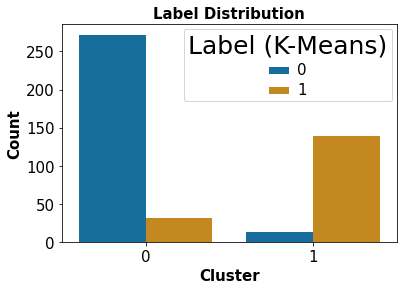

<Figure size 144x144 with 0 Axes>

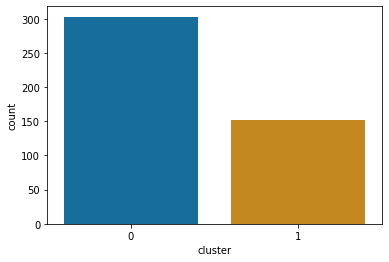

In [30]:
get_dist(X_b, y_b, km_b)

In [29]:
def get_dist(X, y, clus, em = False, title = "Label Distribution"):
    if em:
        label = "Label (EM)"
    else:
        label = "Label (K-Means)"
    cluster = clus.predict(X)
    df = pd.DataFrame(X)
    df["cluster"] = cluster
    df[label] = y.values
    fig = sns.countplot(data = df[["cluster", label]], x = "cluster" , hue = label,palette = 'colorblind')
    fig.set_xlabel("Cluster",fontsize=15, fontweight ='heavy')
    fig.set_ylabel("Count",fontsize=15, fontweight ='heavy')
    fig.set_title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    fig.tick_params(labelsize=15)
    plt.setp(fig.get_legend().get_texts(), fontsize='15') # for legend text
    plt.setp(fig.get_legend().get_title(), fontsize='25') # for legend title
    plt.figure(figsize=(2,2))

    plt.show()
    sns.countplot(data = df[["cluster", label]], x = "cluster" ,palette = 'colorblind')
    plt.show()

In [169]:
from sklearn.mixture import GaussianMixture


    
def elbow_EM(X ,K = 29,title = 'Elbow Method For Optimal Components', random_seeder = 1, return_result = False):
    bic = []
    aic = []
    K_range = range(1,K)
    for k in K_range:
        gmm = GaussianMixture(n_components = k, random_state = random_seeder)
        gmm.fit(X)
        bic.append(gmm.bic(X))
        aic.append(gmm.aic(X))
        
    if return_result:
        return K_range, bic
    
    plt.plot(K_range, bic, 'bx-')
    plt.xlabel('N_Components')
    plt.ylabel('BIC')
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.grid(True)
    plt.show()
    
    plt.plot(K_range, aic, 'bx-')
    plt.xlabel('N_Components')
    plt.ylabel('AIC')
    plt.grid(True)
    plt.show()
    
#     diff_bic = [bic[i]/bic[0] for i in range(len(bic))]
#     diff_bic = np.diff(diff_bic)
#     optimal = np.argwhere(diff_bic < np.quantile(diff_bic, 0.9))[-1][0]
# #     print(inertias)
# #     print(diff_inertia)
# #     print(np.quantile(diff_inertia, 0.9))
# #     print(optimal)
#     plt.title(title)
#     plt.grid(True)
    
    df_gradient = pd.DataFrame(bic, index = K_range)
    df_gradient = df_gradient.diff()
    df_gradient.plot(style = 'x-')
    plt.grid(True)
    plt.show()
    

    
    
#     print("Using Kneed")
#     kneedle = KneeLocator(K_range, bic, S=1.0, curve='convex', direction='decreasing')
#     print(kneedle.knee)
#     if kneedle.knee != None:
#         kneedle.plot_knee()
#     plt.grid(True)
#     plt.show()
    
def BIC_score_multi_plot(X_dict, K = 15, title = "BIC Score DR Comparison"):
    df = pd.DataFrame(index = range(1,K))
    for name, X in X_dict.items():
        temp, df[name] = elbow_EM(X, K, return_result = True)
    
    df.plot(style = 'x-')
    plt.xlabel('EM-N')
    plt.ylabel('BIC Score')
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.grid()
    plt.show()
        
    
def sil_score_plot_EM(X, k = 30, random_seed = 2, return_result = False):
    scores =[]
    for i in range(2,k+1):
        gmm = GaussianMixture(n_components = i, random_state = random_seed)
        cluster_labels = gmm.fit_predict(X)
        sil=silhouette_score(X, cluster_labels, metric='euclidean')
        scores.append(sil)
        #print("For n_clusters =", i, "The average silhouette_score is :", sil)
    
    
    if return_result:
        return range(2,k+1), scores
    
    plt.plot(range(2,k+1), scores, 'x-')
    plt.xlabel('N components')
    plt.ylabel('Sil Score')
    plt.title("Sil Score")
    plt.grid(True)
    plt.show()
    

    return
    
def twinx_EM(X, k = 30, random_seed = 2, axline = 2, title = "EM"):

    # Create some mock data
    t = np.arange(0.01, 10.0, 0.01)
    data1 = np.exp(t)
    data2 = np.sin(2 * np.pi * t)

    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('N_Components')
    ax1.set_ylabel('Bayesian Information Criterion', color=color,size = 15)
    x,y = elbow_EM(X, return_result =True)
    ax1.plot(x, y, 'x-', color=color)

    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('Silhouette Score', color=color, size = 20)  # we already handled the x-label with ax1

    x,y = sil_score_plot_EM(X, return_result =True)
    ax2.plot(x, y,'x-', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    plt.axvline(x = axline ,linewidth=1, color='black', label = "Selected N value")
    plt.legend()
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.grid(True)
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.show()
    
def sil_score_multi_plot(X_dict, K = 15, title = "Silhouette Score DR Comparison"):
    df = pd.DataFrame(index = range(1,K))
    for name, X in X_dict.items():
        df[name] = sil_score_plot(X, K, return_result = True)
    df.index = np.arange(2, K+1)
    df.plot(style = 'x-')
    plt.xlabel('K')
    plt.ylabel('Silhouette Score')
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.grid()
    plt.show()

from sklearn.metrics import silhouette_samples, silhouette_score
def sil_score_plot(X, k = 30, random_seed = 2, metric = "euclidean", return_result = False):
    scores =[]
    for i in range(2,k+1):
        km = KMeans(n_clusters = i, random_state = random_seed)
        cluster_labels = km.fit_predict(X)
        sil=silhouette_score(X, cluster_labels, metric=metric)
        scores.append(sil)
        #print("For n_clusters =", i, "The average silhouette_score is :", sil)
        
    if return_result:
        return scores
    
    plt.plot(range(2,k+1), scores, 'x-')
    plt.xlabel('N components')
    plt.ylabel('Sil Score')
    plt.title("Sil Score")
    plt.grid(True)
    
    
def cluster_label_accuracy(cluster, y, balanced_accuracy = False):
    df = pd.DataFrame(index = range(len(y)))
    df["cluster"] = cluster
    df["label"] = y.values
    max_clusters = df.cluster.max()
    cluster_class = [0] * (max_clusters+1)
    for i in range(max_clusters+1):
        df_temp = df[df.cluster == i]
        value_counts = df_temp.value_counts()
        if len(value_counts) == 1:
            if 0 in df.label:
                cluster_class[i] = 0
            else:
                cluster_class[i] = 1
        elif (value_counts[i][0] > value_counts[i][1]):
            cluster_class[i] = 0
        else:
            cluster_class[i] = 1
        #print(value_counts)
        
    #print(cluster_class)
    
    df["cluster_class"] = 0
    array = []

    for i in range(len(cluster_class)):
        df["cluster_class"][df.cluster == i] = cluster_class[i]
    
    if balanced_accuracy:
        print("Balanced Accuracy of clustering: " + str(balanced_accuracy_score(df["label"], df["cluster_class"])))
    else:
        print("Accuracy of clustering: " + str(accuracy_score(df["label"], df["cluster_class"])))
        
    return df

from matplotlib.lines import Line2D
def twinx_PCA(X, k = 30, random_seed = 2, axlinex = 6, axliney = 0.9):

    # Create some mock data
    pca = PCA()
    pca.fit(X)
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('N_Components')
    ax1.set_ylabel('Explained Variance Ratio', color=color)
    x,y = elbow_EM(X, return_result =True)
    ax1.plot([i +1 for i in range(len(pca.explained_variance_ratio_))], pca.explained_variance_ratio_, 'bx-', color = color)

    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    ax1.axvline(x = axlinex ,linewidth=1, color = "orange", label = "N components selected")

    color = 'tab:blue'
    ax2.set_ylabel('CDF', color=color)  # we already handled the x-label with ax1

    x,y = sil_score_plot_EM(X, return_result =True)
    ax2.plot([i for i in range(len(pca.explained_variance_ratio_))], np.cumsum(pca.explained_variance_ratio_), 'x-', color = color)
    ax2.tick_params(axis='y', labelcolor="black")
    ax2.axhline(y = axliney ,linewidth=1, label = "90% Variance Line", color = "blue")
    colors = ['orange', 'blue']
    lines = [Line2D([0], [0], color=c, linewidth=1) for c in colors]
    labels = ['N Components Selected', '90% Variance Line']
    plt.legend(lines, labels, loc = "center right")
    
    plt.title("EigenValue Explained Var and CDF")

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.grid(True)
    plt.show()

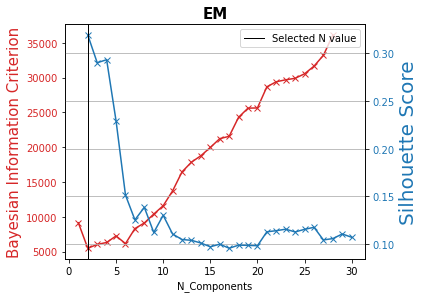

In [46]:
twinx_EM(X_b)

In [8]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

def sil_score_kmeans_2(X, k_values = [2, 3, 4, 5, 6], random_seed = 2, scatter_0 = 0, scatter_1= 1):



    for n_clusters in k_values:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=random_seed)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters. " + " Sil_score = " + str(silhouette_avg))
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, scatter_0], centers[:, scatter_1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

    plt.show()

Automatically created module for IPython interactive environment


In [9]:
def perform_ICA(X,y,title = "ICA", random_seed =2):
    
    num_dims = list(np.arange(2,(X.shape[1]-1)))
    num_dims.append(X.shape[1])
    kurtosis = []

    for dim in num_dims:
        ica = ICA(random_state=random_seed, n_components = dim)
        temp = ica.fit_transform(X)
        temp = pd.DataFrame(temp)
        temp = temp.kurtosis(axis=0)
        kurtosis.append(temp.abs().mean())
        #print(temp.abs())

    plt.figure()
    plt.title("Kurtosis: "+ title)
    plt.xlabel("IC")
    plt.ylabel("Avg Kurtosis")
    plt.plot(num_dims, kurtosis, 'x-')
    plt.grid()
    plt.show()

def ICA_barchart(X, components = 25, show = 10, criteria = False, title = "Kurtosis per Component", random_seed = 2):
    ica = ICA(random_state=random_seed, n_components = components)
    temp = ica.fit_transform(X)
    temp = pd.DataFrame(temp)
    kurtosis = temp.kurtosis(axis=0).abs()
    
    data = []
    for i, kurt in enumerate(kurtosis):
        data.append(["IC" +str(i), kurt])
    #print(data)
    
    df = pd.DataFrame(data, columns=["IC", "kurtosis"])
    df = df.sort_values(by="kurtosis", ascending = False)
    print(df)
    X = df["IC"][:show]
    y = df["kurtosis"][:show]
    avg_kurt = df["kurtosis"].mean()
    
    print("Avg Kurtosis : " + str(avg_kurt))
    
    if criteria:
        plt.axhline(y = 1.5, color = "black", label =  "Kurtosis = 1 (cutoff line)")
    else:
        plt.axhline(y = avg_kurt, color = "black", label = "Avg Kurtosis (cutoff line)")
    plt.legend(loc = "center right")
    plt.xlabel("Independent Components")
    plt.ylabel("Kurtosis")
    plt.bar(X,y)
    plt.grid(True)
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.show()
    
    

In [70]:
from matplotlib.lines import Line2D
def twinx_PCA(X, k = 30, random_seed = 2, axlinex = 6, axliney = 0.9, title = "EigenValue Explained Var and CDF"):

    # Create some mock data
    pca = PCA()
    pca.fit(X)
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('N_Components')
    ax1.set_ylabel('Explained Variance Ratio', color=color, size = 15)
    x,y = elbow_EM(X, return_result =True)
    ax1.plot([i +1 for i in range(len(pca.explained_variance_ratio_))], pca.explained_variance_ratio_, 'bx-', color = color)

    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    ax1.axvline(x = axlinex ,linewidth=1, color = "orange", label = "N components selected")

    color = 'tab:blue'
    ax2.set_ylabel('CDF', color=color, size = 20)  # we already handled the x-label with ax1

    x,y = sil_score_plot_EM(X, return_result =True)
    ax2.plot([i for i in range(len(pca.explained_variance_ratio_))], np.cumsum(pca.explained_variance_ratio_), 'x-', color = color)
    ax2.tick_params(axis='y', labelcolor="black")
    ax2.axhline(y = axliney ,linewidth=1, label = "90% Variance Line", color = "blue")
    colors = ['orange', 'blue']
    lines = [Line2D([0], [0], color=c, linewidth=1) for c in colors]
    labels = ['N Components Selected', '90% Variance Line']
    plt.legend(lines, labels, loc = "center right")
    
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.grid(True)
    plt.show()

In [78]:
from sklearn.decomposition import PCA, FastICA as ICA
def perform_ICA(X,y, random_seed =2, title = "Avg Kurtosis"):
    
    num_dims = list(np.arange(2,(X.shape[1]-1)))
    num_dims.append(X.shape[1])
    kurtosis = []

    for dim in num_dims:
        ica = ICA(random_state=random_seed, n_components = dim)
        temp = ica.fit_transform(X)
        temp = pd.DataFrame(temp)
        temp = temp.kurtosis(axis=0)
        kurtosis.append(temp.abs().mean())
        #print(temp.abs())

    plt.figure()
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.xlabel("IC")
    plt.ylabel("Kurtosis")
    plt.plot(num_dims, kurtosis, 'x-')
    plt.grid()
    plt.show()

def ICA_barchart(X, components = 25, show = 10, criteria = 0, title = "Kurtosis per Component"):
    ica = ICA(random_state=random_seed, n_components = components)
    temp = ica.fit_transform(X)
    temp = pd.DataFrame(temp)
    kurtosis = temp.kurtosis(axis=0).abs()
    
    data = []
    for i, kurt in enumerate(kurtosis):
        data.append(["" +str(i), kurt])
    #print(data)
    
    df = pd.DataFrame(data, columns=["IC", "kurtosis"])
    df = df.sort_values(by="kurtosis", ascending = False)
    print(df)
    X = df["IC"][:show]
    y = df["kurtosis"][:show]
    avg_kurt = df["kurtosis"].mean()
    
    print("Avg Kurtosis : " + str(avg_kurt))
    
    if criteria:
        plt.axhline(y = criteria + 0.5, color = "black", label =  "Kurtosis = "+str(criteria)+" (cutoff line)")
    else:
        plt.axhline(y = avg_kurt, color = "black", label = "Avg Kurtosis (cutoff line)")
    plt.legend(loc = "center right")
    plt.xlabel("Independent Components")
    plt.ylabel("Kurtosis")
    plt.bar(X,y)
    plt.grid(True)
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.show()
    
    

In [113]:
from scipy import sparse
from sklearn import decomposition
from sklearn import random_projection
from sklearn.metrics import mean_squared_error as MSE

def perform_RP(X,title = "RP", random_seed =2, return_result = False):
    
    num_dims = X.shape[1]
    error = []

    for dim in range(1,num_dims +1):
        rp = random_projection.GaussianRandomProjection(random_state=random_seed, n_components = dim)
        X_rp = rp.fit_transform(X)
        X_rp_inverse = np.linalg.pinv(rp.components_.T)
        reconstructed_X = X_rp.dot(X_rp_inverse)
        
        error.append(MSE(X, reconstructed_X))
        #print(MSE(X, reconstructed_X))
    
    if return_result:
        return pd.DataFrame(error, index = range(1,num_dims +1))
    
    plt.figure()
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.xlabel("IC")
    plt.ylabel("Reconstruction Error")
    plt.plot(range(1,num_dims +1), error, 'x-')
    plt.grid()
    plt.show()
    

def perform_multiple_RP(X, title = "Multiple RP", random_seed = 2, vertical_line = 25):
    num_dims = X.shape[1]
    df = pd.DataFrame(index = range(1,num_dims +1))
    
    for i in range(8):
        df["Attempt_" + str(i)] = perform_RP(X,random_seed = i, return_result = True)
    
    df.plot(style='x-')
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.axhline(y = 0.2 ,linewidth=2, color='black', label = "RE Cutoff Line")
    plt.axvline(x = vertical_line ,linewidth=2, color='blue', label = "Selected N Value")
    plt.legend(loc = "lower left")
    plt.grid(True)
    plt.xlabel("Number of Components")
    plt.ylabel("Reconstruction Error")
    plt.show()
    
    
def perform_RP_2(X,title = "RP", random_seed =2):
    
    num_dims = X.shape[1]
    error = []

    for dim in range(1,num_dims +1):
        rca_b = InvertibleRandomProjection(random_state=random_seed, n_components = dim)

        X_rp = rca_b.fit_transform(X)
        X_rp_inverse = rca_b.inverse_transform(X_rp)
        #print(X_rp_inverse.shape)
        mse = MSE(X, X_rp_inverse)
        error.append(MSE(X, X_rp_inverse))

    plt.figure()
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.xlabel("IC")
    plt.ylabel("Reconstruction Error")
    plt.plot(range(1,num_dims +1), error, 'x-')
    plt.grid()
    plt.show()

In [124]:
def add_patch(legend):
    from matplotlib.patches import Patch
    ax = legend.axes

    handles, labels = [],[]
    handles.append(Patch(facecolor='Orange', edgecolor='k'))
    labels.append("Kept")
    handles.append(Patch( edgecolor='k'))
    labels.append("Discarded")

    legend._legend_box = "test"
    legend._init_legend_box(handles, labels)
    legend._set_loc(legend._loc)
    legend.set_title(legend.get_title().get_text())
    
from sklearn.tree import DecisionTreeClassifier, plot_tree
def importance_barchart(X,y, columns, num_features = 8, cutoff = 0.025, title = "Feature Importance"):
    mod_dt = DecisionTreeClassifier(random_state =1, criterion = 'entropy')
    mod_dt.fit(X, y)
    
    sorted_feature_importance = sorted(zip(columns, mod_dt.feature_importances_))
    
    df = pd.DataFrame(sorted_feature_importance, columns =["Feature", "value"])     
    df = df.sort_values(by="value", ascending = False)
    print(df)
    cumsum = df.cumsum()
    cumsum  = cumsum.reset_index()
    #print(type(cumsum))
    #print(cumsum)
    X = df["Feature"][:num_features]
    
    y = df["value"][:num_features]
    #print(X,y)
    plt.xlabel("Features")
    plt.ylabel("Feature Importance")
    #plt.axhline(y = cutoff, color = "black", label = str(cutoff) + " FI cutoff line")
    #plt.legend(loc = "upper right")
    plt.xticks(rotation=30)
    barlist = plt.bar(X,y)
    for i, bar in enumerate(barlist):
        if cumsum["value"][i] < 0.91:
            #print(cumsum["value"][i])
            bar.set_color('orange')
            bar.set_edgecolor("black")
    
    plt.grid(True)
    lgd = plt.legend(loc='upper right')
    add_patch(lgd)
    plt.title(title, fontdict={'fontsize': 15, 'fontweight': 'heavy'})
    plt.show()
    

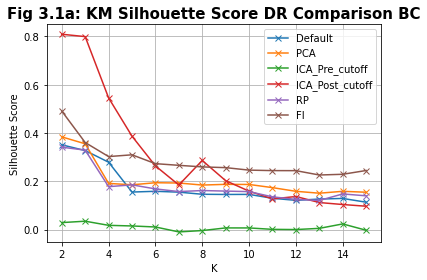

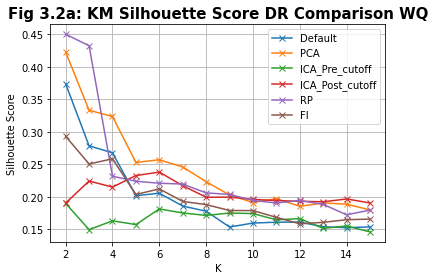

In [170]:
from sklearn.decomposition import PCA, FastICA as ICA
from scipy import sparse
from sklearn import decomposition
from sklearn import random_projection
from sklearn.metrics import mean_squared_error as MSE

#PCA
bc_pca_n = 6
pca_bc = PCA(n_components = bc_pca_n)
X_b_pca = pca_bc.fit_transform(X_b)

wine_pca_n = 6
pca_wine = PCA(n_components = wine_pca_n)
X_w_pca = pca_wine.fit_transform(X_w)

#ICA
ica_b = ICA(random_state=2, n_components = 26)
X_b_ICA = ica_b.fit_transform(X_b)
df_b_ICA = pd.DataFrame(X_b_ICA)
selected_IC_b = [16, 7, 23, 12, 8, 9, 6,15,24,10,2]
X_b_ICA_original = X_b_ICA
X_b_ICA = df_b_ICA[selected_IC_b].to_numpy()


ica_w = ICA(random_state=2, n_components = 8)
selected_IC_w = [3,1,0,7]
X_w_ICA = ica_w.fit_transform(X_w)
df_w_ICA = pd.DataFrame(X_w_ICA)
X_w_ICA_original = X_w_ICA
X_w_ICA = df_w_ICA[selected_IC_w].to_numpy()

#RP
rp_b = random_projection.GaussianRandomProjection(random_state=2, n_components = 22)
X_b_rp = rp_b.fit_transform(X_b)

rp_w = random_projection.GaussianRandomProjection(random_state=2, n_components = 10)
X_w_rp = rp_w.fit_transform(X_w)

#FI
selected_FI_b = ["perimeter_worst", "concave points_worst", "texture_worst", "radius_worst",
                "area_se"]
df_b_FI = pd.DataFrame(X_b, columns = X_b_pre_scale.columns)
X_b_FI = df_b_FI[selected_FI_b].to_numpy()

selected_FI_w = ["alcohol", "volatile acidity", "residual sugar", "sulphates",
                "total sulfur dioxide", "free sulfur dioxide","fixed acidity", "chlorides"]

df_w_FI = pd.DataFrame(X_w, columns = X_w_pre_scale.columns)
X_w_FI = df_w_FI[selected_FI_w].to_numpy()

X_b_dict = {
    "Default" : X_b,
    "PCA" : X_b_pca,
    "ICA_Pre_cutoff" : X_b_ICA_original,
    "ICA_Post_cutoff" : X_b_ICA,
    "RP" : X_b_rp,
    "FI" : X_b_FI
}
sil_score_multi_plot(X_b_dict, title = "Fig 3.1a: KM Silhouette Score DR Comparison BC")

X_w_dict = {
    "Default" : X_w,
    "PCA" : X_w_pca,
    "ICA_Pre_cutoff" : X_w_ICA_original,
    "ICA_Post_cutoff" : X_w_ICA,
    "RP" : X_w_rp,
    "FI" : X_w_FI
}
sil_score_multi_plot(X_w_dict, title = "Fig 3.2a: KM Silhouette Score DR Comparison WQ")

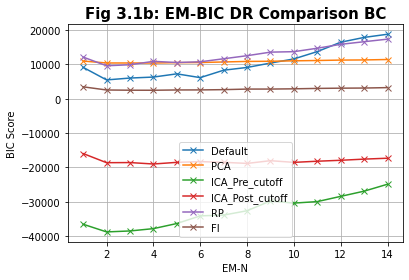

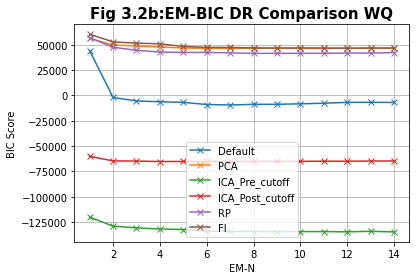

In [168]:
X_b_dict = {
    "Default" : X_b,
    "PCA" : X_b_pca,
    "ICA_Pre_cutoff" : X_b_ICA_original,
    "ICA_Post_cutoff" : X_b_ICA,
    "RP" : X_b_rp,
    "FI" : X_b_FI
}
BIC_score_multi_plot(X_b_dict, K=15, title = "Fig 3.1b: EM-BIC DR Comparison BC")

X_w_dict = {
    "Default" : X_w,
    "PCA" : X_w_pca,
    "ICA_Pre_cutoff" : X_w_ICA_original,
    "ICA_Post_cutoff" : X_w_ICA,
    "RP" : X_w_rp,
    "FI" : X_w_FI
}
BIC_score_multi_plot(X_w_dict, title = "Fig 3.2b:EM-BIC DR Comparison WQ")

# PCA

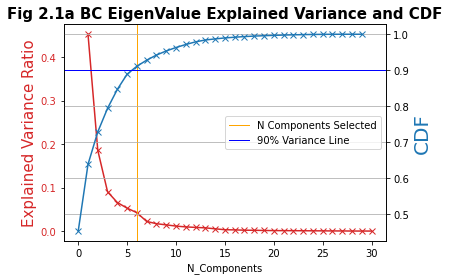

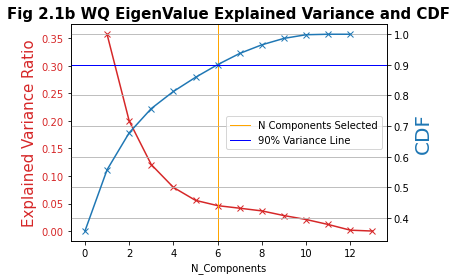

In [71]:
twinx_PCA(X_b, title = "Fig 2.1a BC EigenValue Explained Variance and CDF")
twinx_PCA(X_w, title ="Fig 2.1b WQ EigenValue Explained Variance and CDF")

# ICA

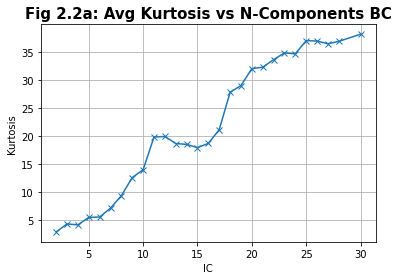

In [84]:
ica_pre = PCA()
X_b_ica_pre = ica_pre.fit_transform(X_b)
perform_ICA(X_b_ica_pre,y_b, random_seed = 1, title = "Fig 2.2a: Avg Kurtosis vs N-Components BC")


    IC    kurtosis
16  16  304.069780
7    7  246.110781
23  23   76.984985
12  12   75.342904
8    8   40.737518
9    9   37.903844
6    6   29.119792
15  15   28.028820
24  24   21.972351
10  10   20.463405
2    2   17.582282
3    3    7.951538
17  17    7.334462
14  14    6.314495
22  22    6.060123
19  19    5.887992
11  11    5.284617
4    4    5.044538
21  21    4.921774
20  20    4.533871
1    1    3.973301
13  13    2.460674
25  25    1.961065
5    5    1.688490
18  18    1.530987
0    0    0.501699
Avg Kurtosis : 37.06792639519867


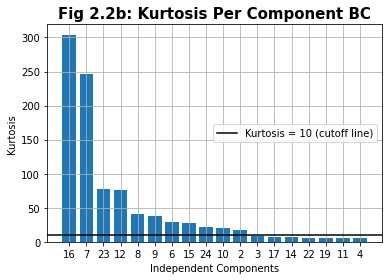

In [83]:
ICA_barchart(X_b, 26, 18, criteria=10,title = "Fig 2.2b: Kurtosis Per Component BC")

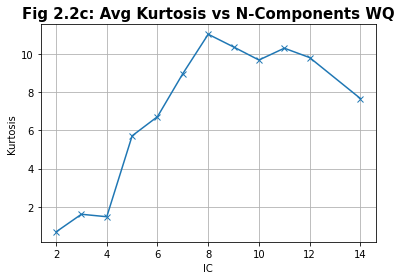

In [90]:
perform_ICA(X_w,y_w, title = "Fig 2.2c: Avg Kurtosis vs N-Components WQ")

  IC   kurtosis
1  1  71.332954
7  7   8.774190
0  0   3.377177
5  5   1.946918
2  2   0.786624
6  6   0.768237
4  4   0.665667
3  3   0.620821
Avg Kurtosis : 11.034073457916463


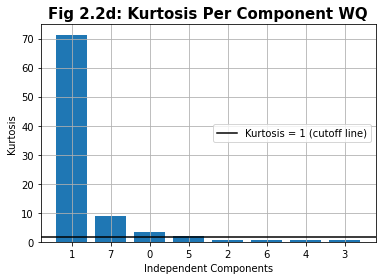

In [93]:
ICA_barchart(X_w, 8, criteria=1,title = "Fig 2.2d: Kurtosis Per Component WQ")

# RP

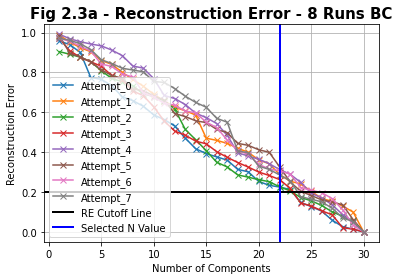

In [114]:
perform_multiple_RP(X_b, title ="Fig 2.3a - Reconstruction Error - 8 Runs BC", vertical_line = 22)

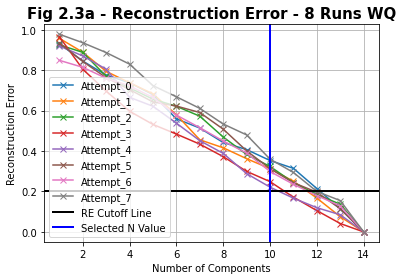

In [115]:
perform_multiple_RP(X_w, title = "Fig 2.3a - Reconstruction Error - 8 Runs WQ", vertical_line = 10)

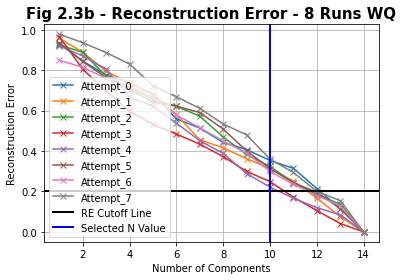

In [119]:
perform_multiple_RP(X_w, title = "Fig 2.3b - Reconstruction Error - 8 Runs WQ", vertical_line = 10)

# FI using DTree

No handles with labels found to put in legend.


                    Feature     value
17          perimeter_worst  0.593748
8      concave points_worst  0.180321
29            texture_worst  0.079777
20             radius_worst  0.026827
1                   area_se  0.026224
27             texture_mean  0.020882
22            smoothness_se  0.014961
11          concavity_worst  0.013246
9            concavity_mean  0.011942
13     fractal_dimension_se  0.011191
6       concave points_mean  0.010441
23         smoothness_worst  0.010441
26           symmetry_worst  0.000000
25              symmetry_se  0.000000
24            symmetry_mean  0.000000
28               texture_se  0.000000
19                radius_se  0.000000
21          smoothness_mean  0.000000
0                 area_mean  0.000000
18              radius_mean  0.000000
16             perimeter_se  0.000000
14  fractal_dimension_worst  0.000000
12   fractal_dimension_mean  0.000000
10             concavity_se  0.000000
7         concave points_se  0.000000
5         co

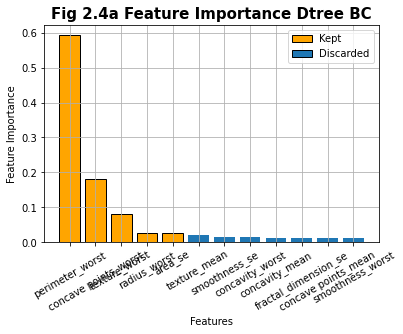

In [126]:

importance_barchart(X_b, y_b, X_b_pre_scale.columns, 12, title = "Fig 2.4a Feature Importance Dtree BC")

No handles with labels found to put in legend.


                 Feature     value
0                alcohol  0.386721
12      volatile acidity  0.153468
9         residual sugar  0.083695
10             sulphates  0.070841
11  total sulfur dioxide  0.067954
5    free sulfur dioxide  0.063455
4          fixed acidity  0.041746
1              chlorides  0.041186
8                     pH  0.036589
2            citric acid  0.030898
3                density  0.023447
6                  isRed  0.000000
7                isWhite  0.000000


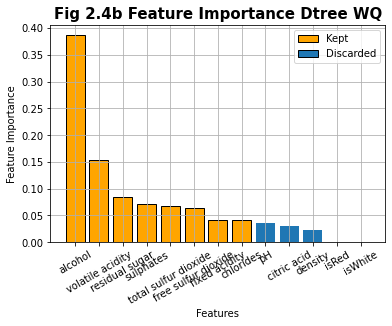

In [127]:
importance_barchart(X_w, y_w, X_w_pre_scale.columns, 14, cutoff = 0.05, title = "Fig 2.4b Feature Importance Dtree WQ")

# Without Dim Reduction BC

Using Kneed
3


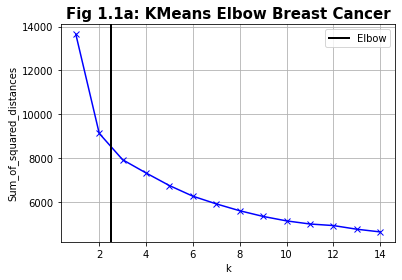

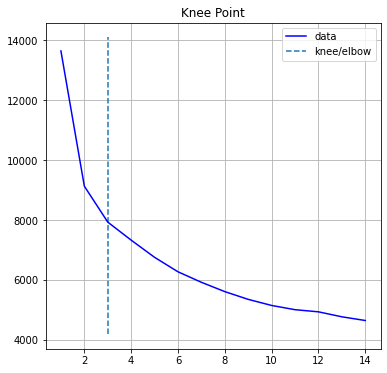

For n_clusters = 2 The average silhouette_score is : 0.3512107700198978
For n_clusters = 3 The average silhouette_score is : 0.3274700041314043
For n_clusters = 4 The average silhouette_score is : 0.27917879299623194
For n_clusters = 5 The average silhouette_score is : 0.15565616776597463
For n_clusters = 6 The average silhouette_score is : 0.1587607508226364


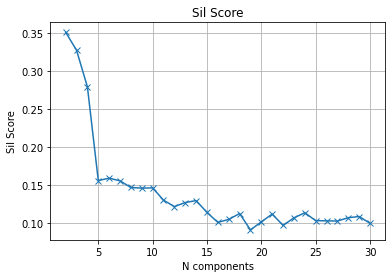

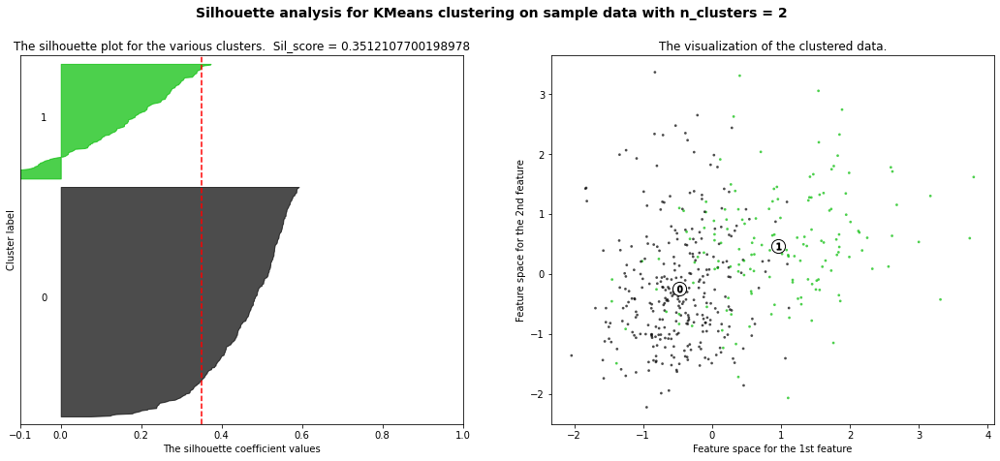

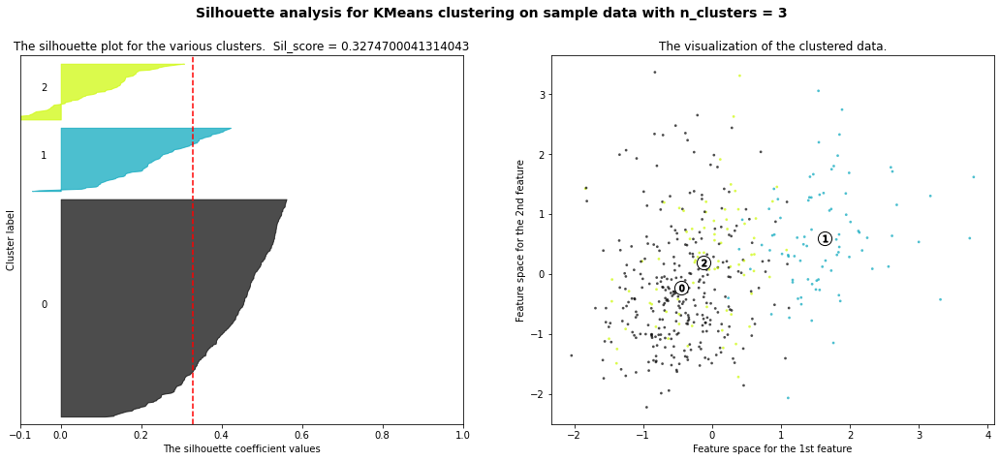

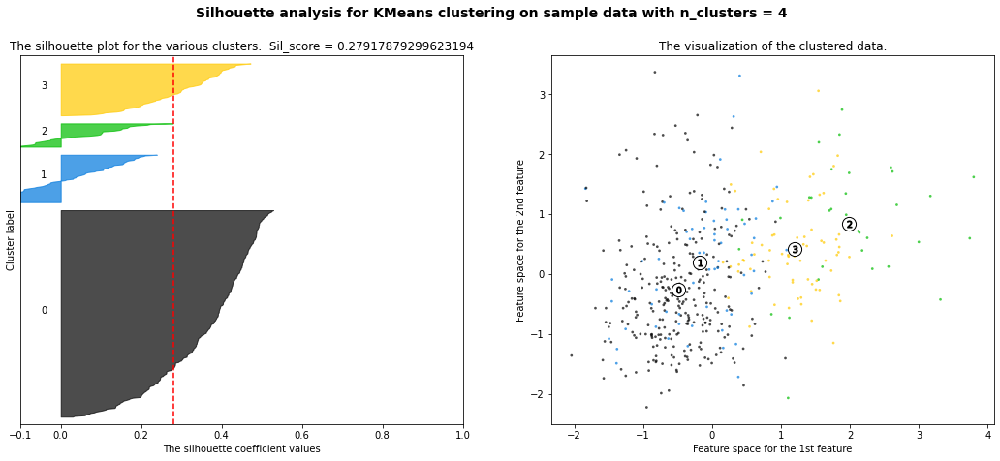

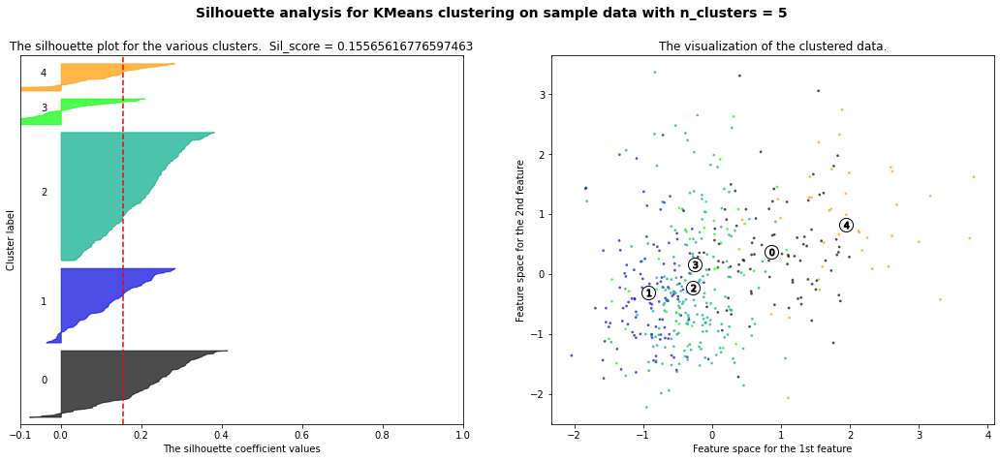

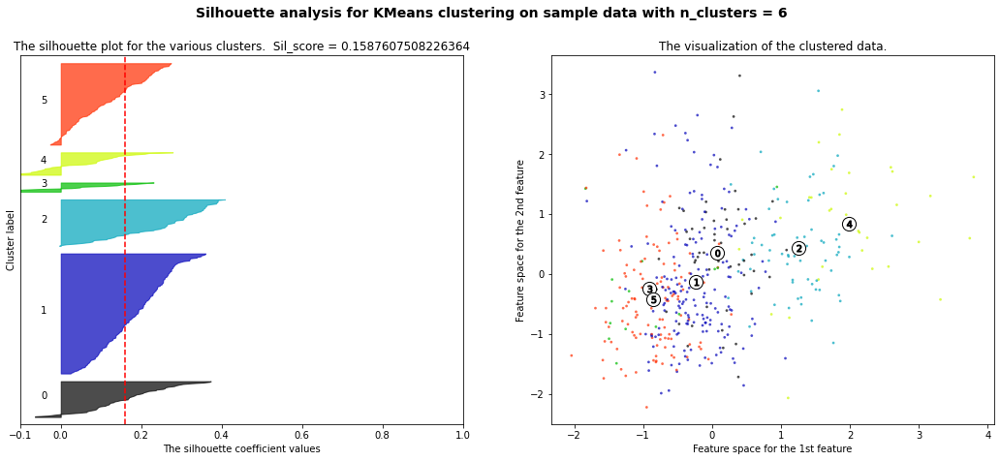

In [141]:
elbow(X_b, title ="Fig 1.1a: KMeans Elbow Breast Cancer")
sil_score_plot(X_b)
sil_score_kmeans_2(X_b)

Accuracy of clustering: 0.9032967032967033


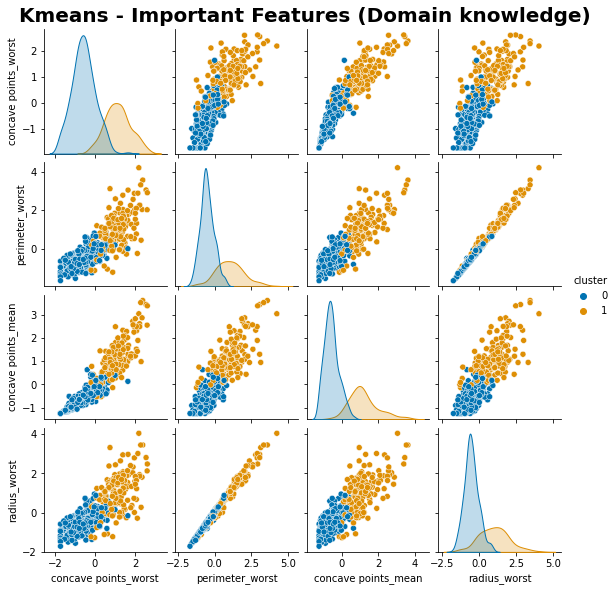

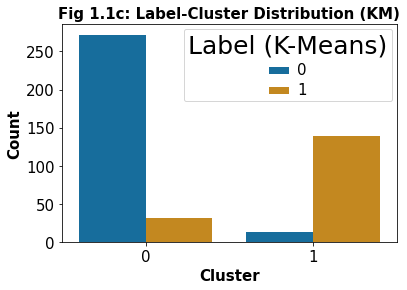

<Figure size 144x144 with 0 Axes>

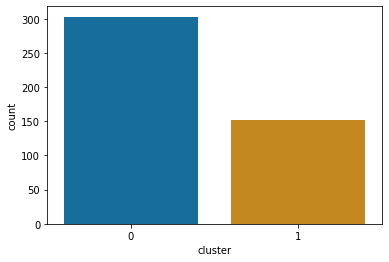

In [55]:
#Breast Cancer
n_clusters =2 
km_b = KMeans(n_clusters=n_clusters, random_state = random_seed)
km_b = km_b.fit(X_b)
cluster = km_b.predict(X_b)
df_b = pd.DataFrame(X_b, columns = data_b.iloc[:,:-1].columns)
df_b["cluster"] = cluster
df_b["label"] = y_b.values

cluster_label_accuracy(cluster, y_b)
g =sns.pairplot(df_b[["concave points_worst", "perimeter_worst", "concave points_mean", "radius_worst", "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("Kmeans - Important Features (Domain knowledge)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid()
plt.show()
get_dist(X_b,y_b, km_b, title = "Fig 1.1c: Label-Cluster Distribution (KM)")


Accuracy of clustering: 0.9032967032967033


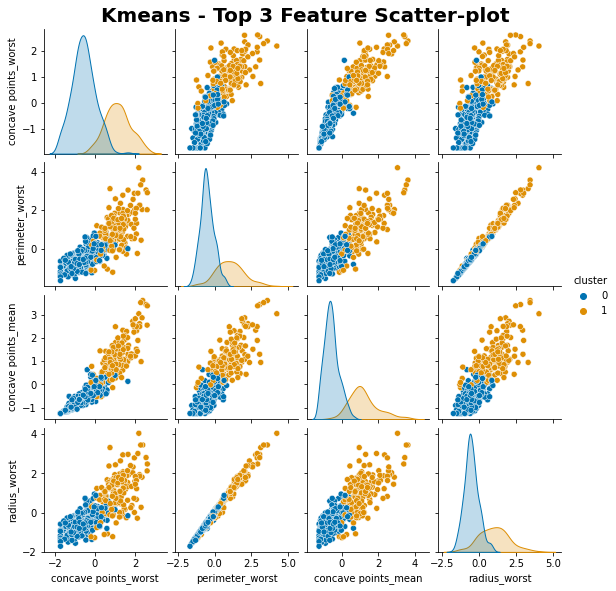

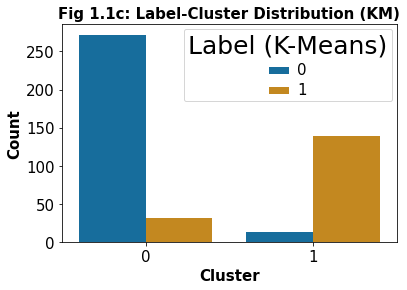

<Figure size 144x144 with 0 Axes>

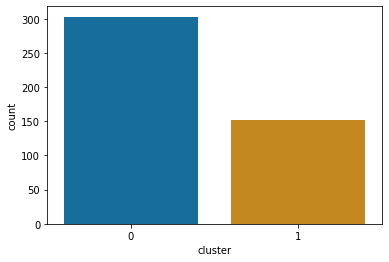

In [56]:
#Breast Cancer
n_clusters =2 
km_b = KMeans(n_clusters=n_clusters, random_state = random_seed)
km_b = km_b.fit(X_b)
cluster = km_b.predict(X_b)
df_b = pd.DataFrame(X_b, columns = data_b.iloc[:,:-1].columns)
df_b["cluster"] = cluster
df_b["label"] = y_b.values

cluster_label_accuracy(cluster, y_b)
g =sns.pairplot(df_b[["concave points_worst", "perimeter_worst", "concave points_mean", "radius_worst", "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("Kmeans - Top 3 Feature Scatter-plot", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid()
plt.show()
get_dist(X_b,y_b, km_b, title = "Fig 1.1c: Label-Cluster Distribution (KM)")

## Default EM

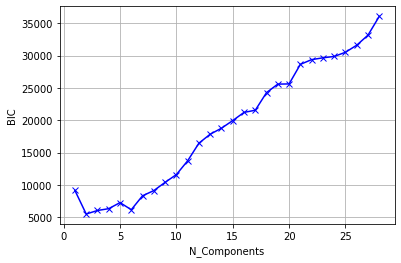

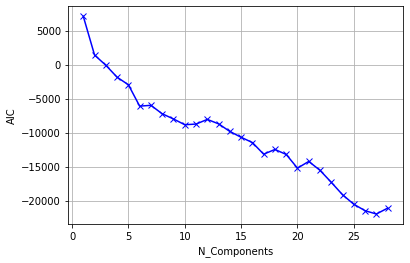

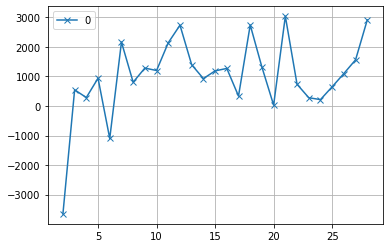

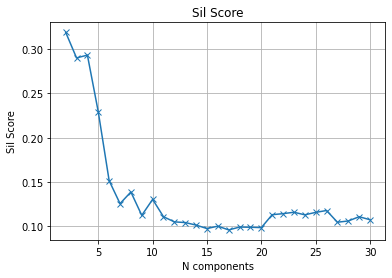

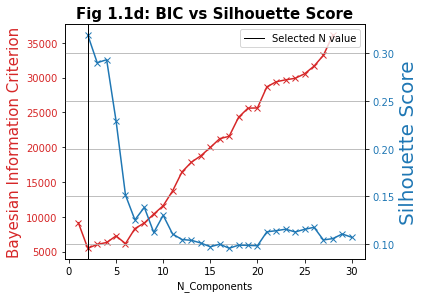

In [143]:
elbow_EM(X_b, return_result = False)
sil_score_plot_EM(X_b)
twinx_EM(X_b, title = "Fig 1.1d: BIC vs Silhouette Score")

Accuracy of clustering: 0.9428571428571428


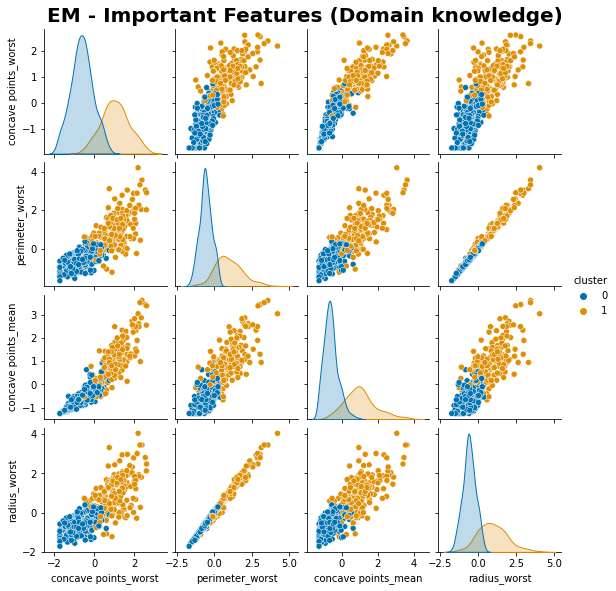

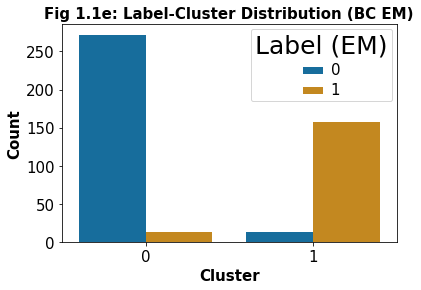

<Figure size 144x144 with 0 Axes>

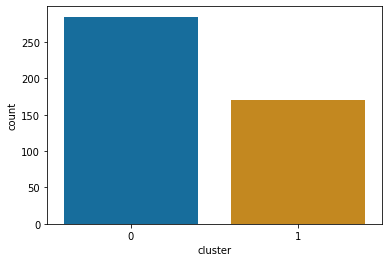

In [51]:
#Breast Cancer
n_clusters =2 
gmm_b = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_b.fit(X_b)
cluster = gmm_b.predict(X_b)
df_b = pd.DataFrame(X_b, columns = data_b.iloc[:,:-1].columns)
df_b["cluster"] = cluster
df_b["label"] = y_b.values
cluster_label_accuracy(cluster, y_b)

g =sns.pairplot(df_b[["concave points_worst", "perimeter_worst", "concave points_mean", "radius_worst", "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("EM - Important Features (Domain knowledge)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid()
plt.show()
get_dist(X_b,y_b, gmm_b, em = True, title = "Fig 1.1e: Label-Cluster Distribution (BC EM)")

Accuracy of clustering: 0.9428571428571428


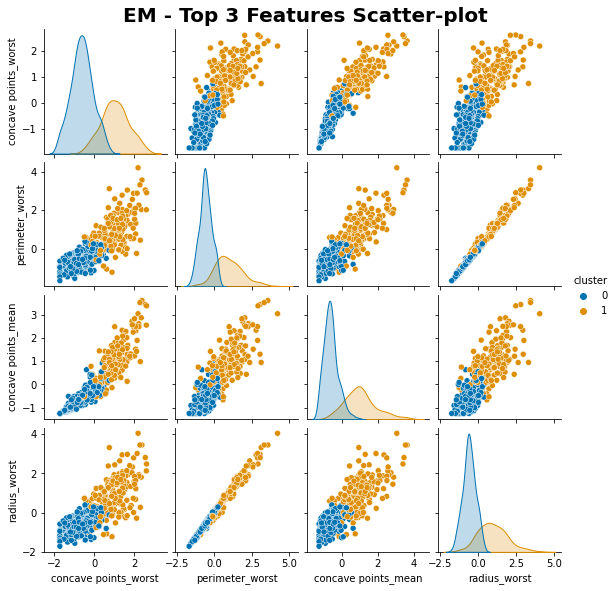

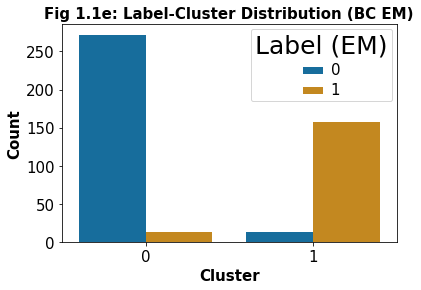

<Figure size 144x144 with 0 Axes>

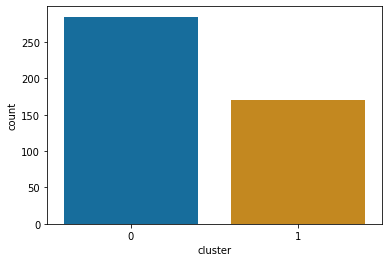

In [57]:
#Breast Cancer
n_clusters =2 
gmm_b = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_b.fit(X_b)
cluster = gmm_b.predict(X_b)
df_b = pd.DataFrame(X_b, columns = data_b.iloc[:,:-1].columns)
df_b["cluster"] = cluster
df_b["label"] = y_b.values
cluster_label_accuracy(cluster, y_b)

g =sns.pairplot(df_b[["concave points_worst", "perimeter_worst", "concave points_mean", "radius_worst", "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("EM - Top 3 Features Scatter-plot", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid()
plt.show()
get_dist(X_b,y_b, gmm_b, em = True, title = "Fig 1.1e: Label-Cluster Distribution (BC EM)")

# PCA BC

Using Kneed
3


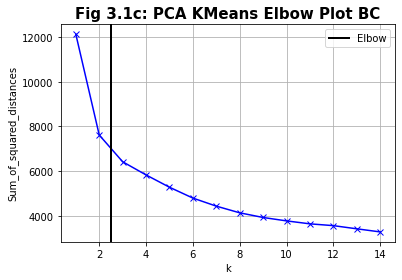

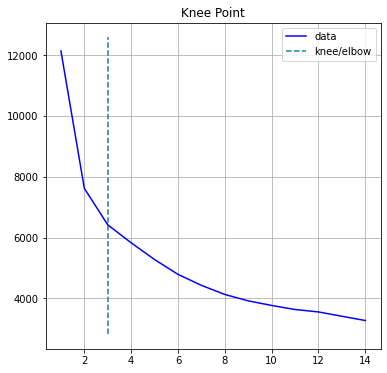

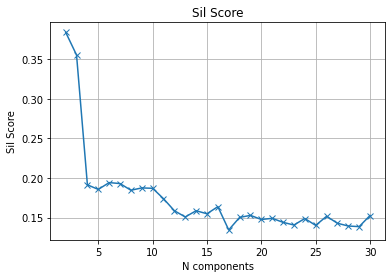

In [140]:
elbow(X_b_pca, title ="Fig 3.1c: PCA KMeans Elbow Plot BC")
sil_score_plot(X_b_pca)

For n_clusters = 2 The average silhouette_score is : 0.384089143952205
For n_clusters = 3 The average silhouette_score is : 0.35540882634492427
For n_clusters = 4 The average silhouette_score is : 0.191425673871787
For n_clusters = 5 The average silhouette_score is : 0.185647428633605
For n_clusters = 6 The average silhouette_score is : 0.19424058577107017


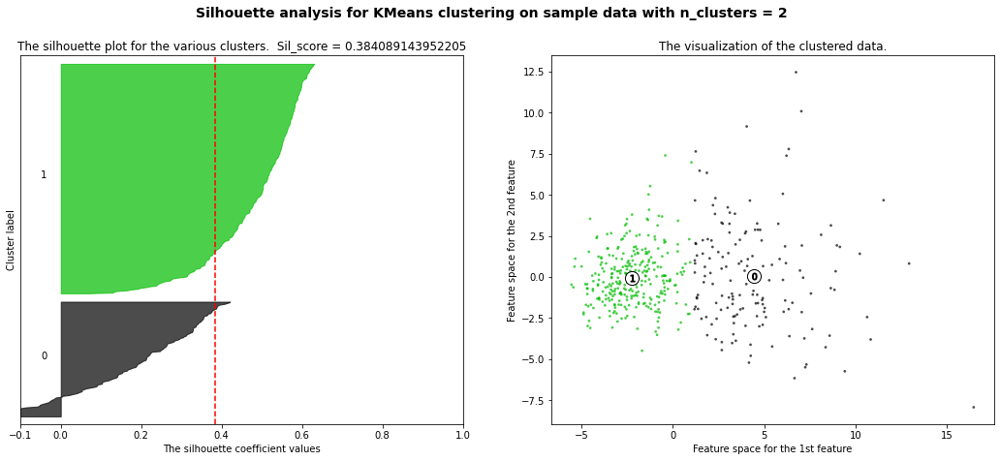

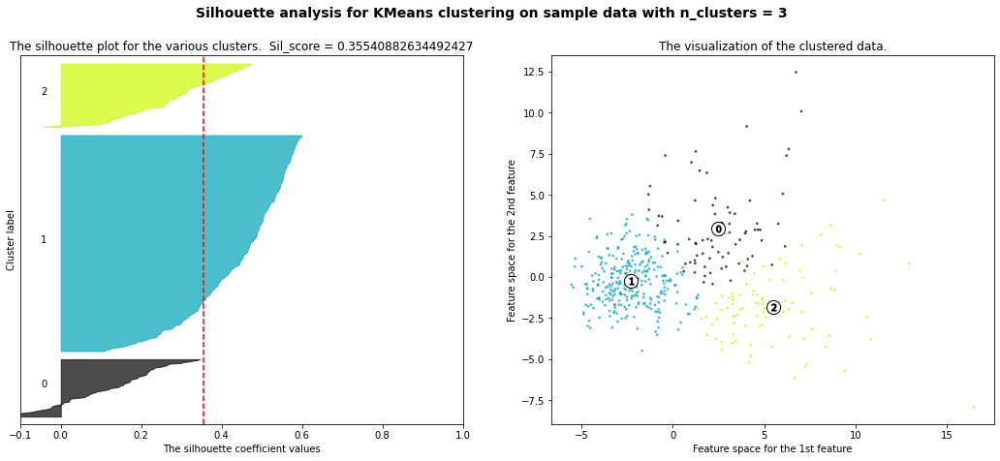

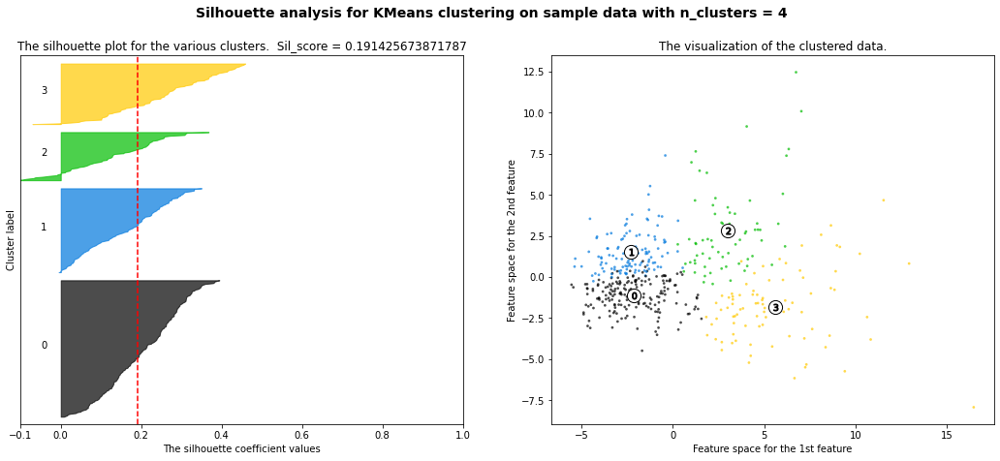

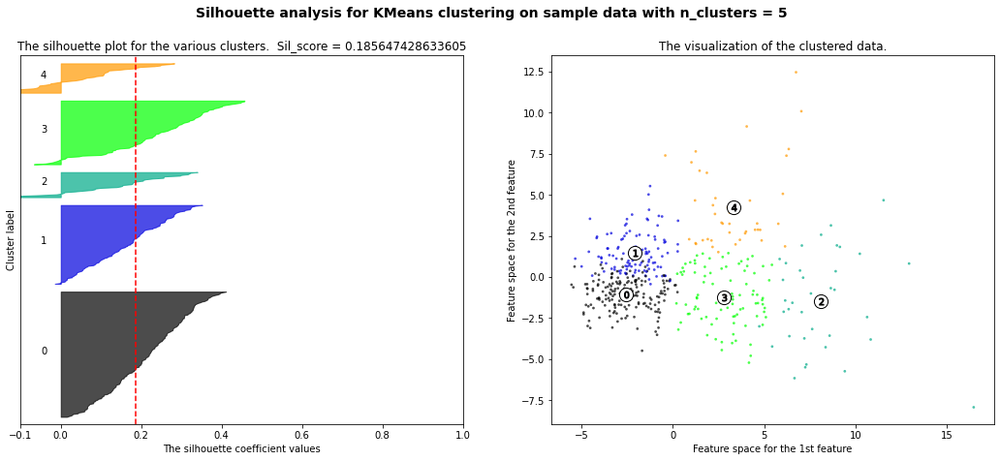

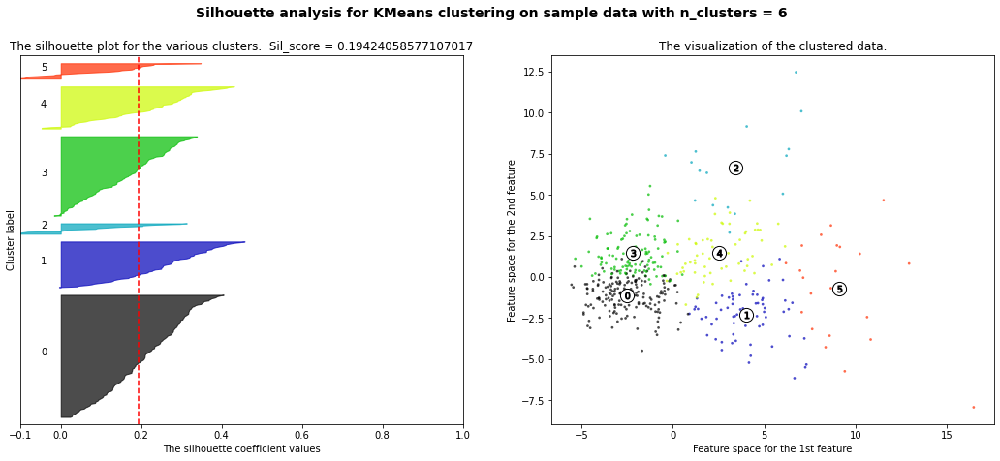

In [24]:
sil_score_kmeans_2(X_b_pca)

Accuracy of clustering: 0.9032967032967033


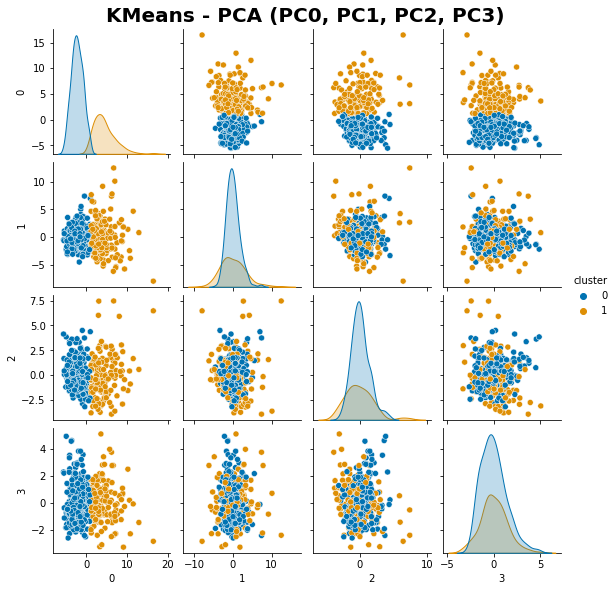

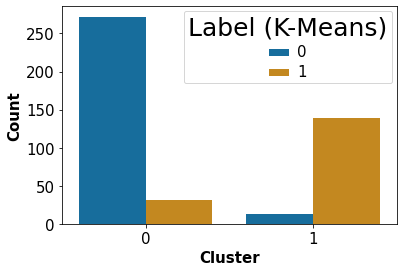

<Figure size 144x144 with 0 Axes>

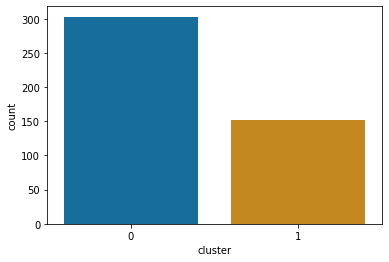

In [140]:
n_clusters = 2
X_val = X_b_pca
km_b = KMeans(n_clusters=n_clusters, random_state = 1)
km_b = km_b.fit(X_val)
cluster = km_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
cluster_label_accuracy(cluster, y_b)

g =sns.pairplot(df_b[[0,1,2, 3,"cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("KMeans - PCA (PC0, PC1, PC2, PC3)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, km_b)

## PCA EM

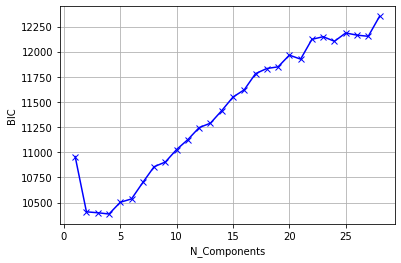

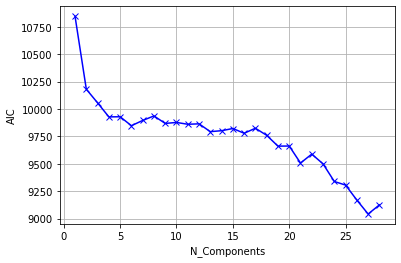

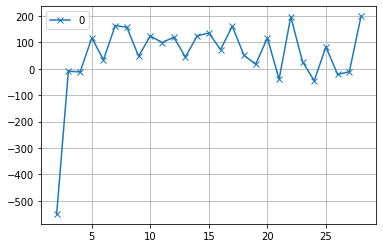

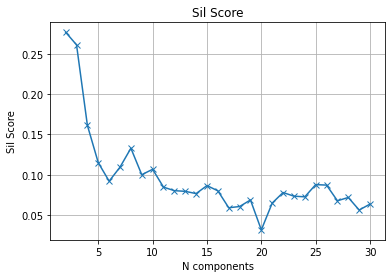

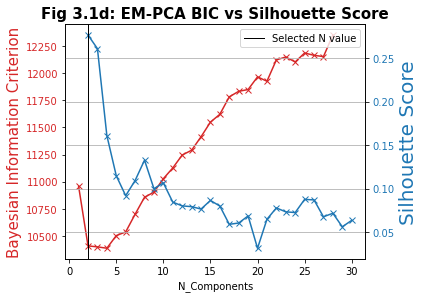

In [145]:
elbow_EM(X_b_pca, return_result = False)
sil_score_plot_EM(X_b_pca)
twinx_EM(X_b_pca, title = "Fig 3.1d: EM-PCA BIC vs Silhouette Score")

Accuracy of clustering: 0.8219780219780219


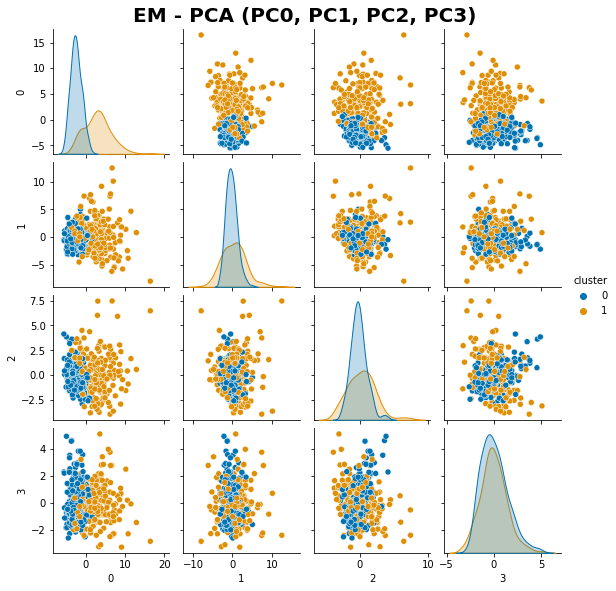

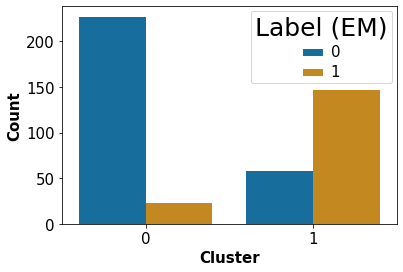

<Figure size 144x144 with 0 Axes>

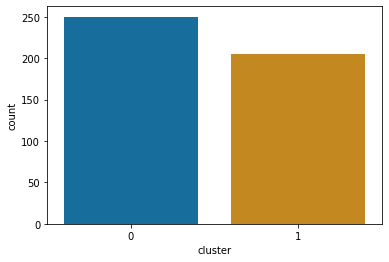

In [142]:
#Breast Cancer
n_clusters =2 
X_val = X_b_pca
gmm_b = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_b.fit(X_val)
cluster = gmm_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
g =sns.pairplot(df_b[[0,1,2, 3,"cluster"]], hue="cluster", height = 2, palette = 'colorblind')

df_b["label"] = y_b.values
cluster_label_accuracy(cluster, y_b)
g.fig.suptitle("EM - PCA (PC0, PC1, PC2, PC3)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, gmm_b, em = True)

# ICA BC

      IC    kurtosis
16  IC16  304.069780
7    IC7  246.110781
23  IC23   76.984985
12  IC12   75.342904
8    IC8   40.737518
9    IC9   37.903844
6    IC6   29.119792
15  IC15   28.028820
24  IC24   21.972351
10  IC10   20.463405
2    IC2   17.582282
3    IC3    7.951538
17  IC17    7.334462
14  IC14    6.314495
22  IC22    6.060123
19  IC19    5.887992
11  IC11    5.284617
4    IC4    5.044538
21  IC21    4.921774
20  IC20    4.533871
1    IC1    3.973301
13  IC13    2.460674
25  IC25    1.961065
5    IC5    1.688490
18  IC18    1.530987
0    IC0    0.501699
Avg Kurtosis : 37.06792639519867


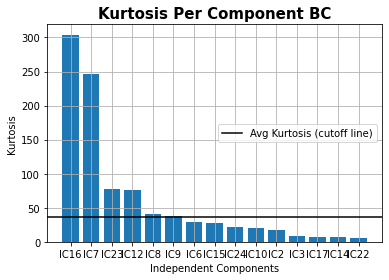

In [101]:
ICA_barchart(X_b, 26, show= 15, title = "Kurtosis Per Component BC", random_seed = 2)

In [15]:
ica = ICA(random_state=2, n_components = 26)
X_b_ICA = ica.fit_transform(X_b)
df_b_ICA = pd.DataFrame(X_b_ICA)
print((df_b_ICA.kurtosis(axis=0)).abs().mean())

selected_IC_b = [16, 7, 23, 12, 8, 9,6,15,24,10, 2]

X_b_ICA_original = X_b_ICA
X_b_ICA = df_b_ICA[selected_IC_b].to_numpy()

37.06792639519867


Using Kneed
12


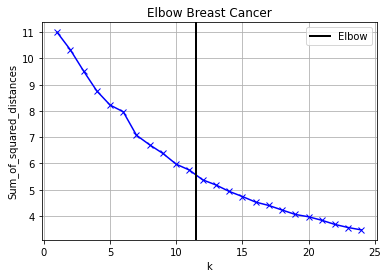

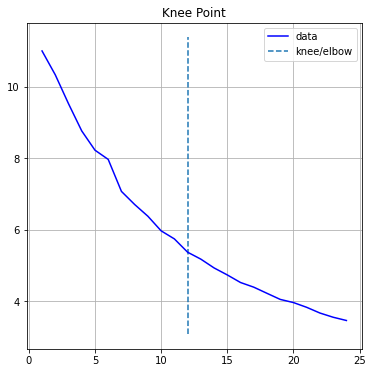

For n_clusters = 2 The average silhouette_score is : 0.8089599566708408
For n_clusters = 3 The average silhouette_score is : 0.7991752051416341
For n_clusters = 4 The average silhouette_score is : 0.545546905709949
For n_clusters = 5 The average silhouette_score is : 0.38687406034795063
For n_clusters = 6 The average silhouette_score is : 0.2640048110950883
For n_clusters = 7 The average silhouette_score is : 0.1848541685679703
For n_clusters = 8 The average silhouette_score is : 0.2863855373395095
For n_clusters = 9 The average silhouette_score is : 0.20268109926736683


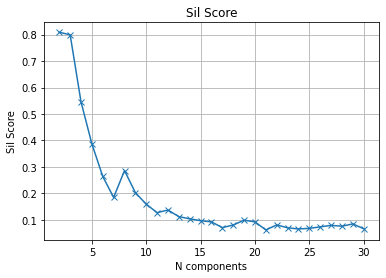

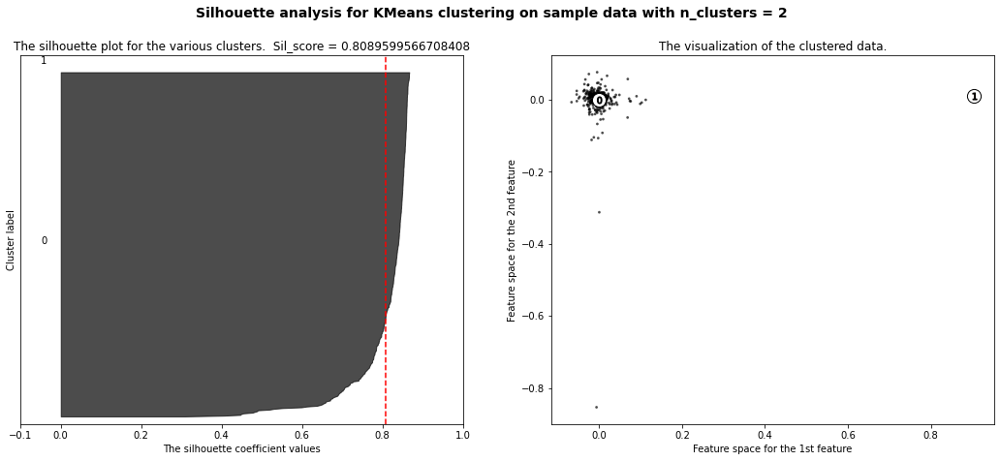

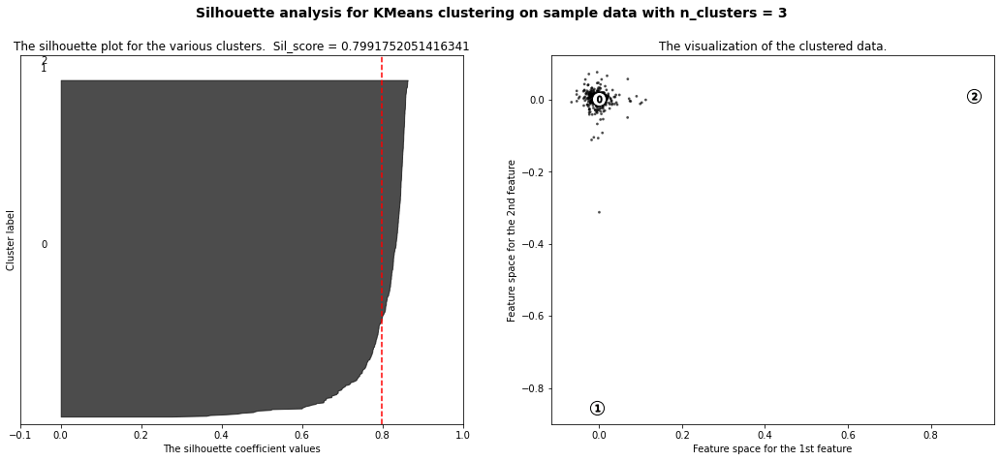

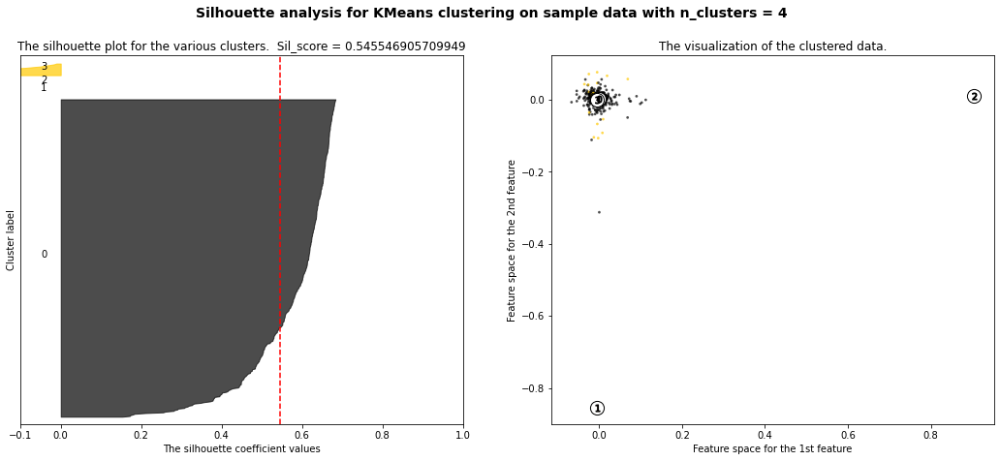

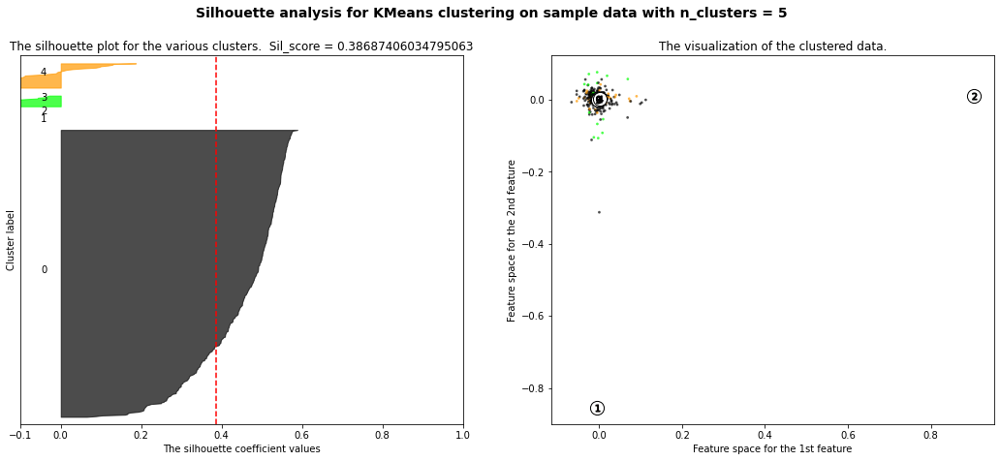

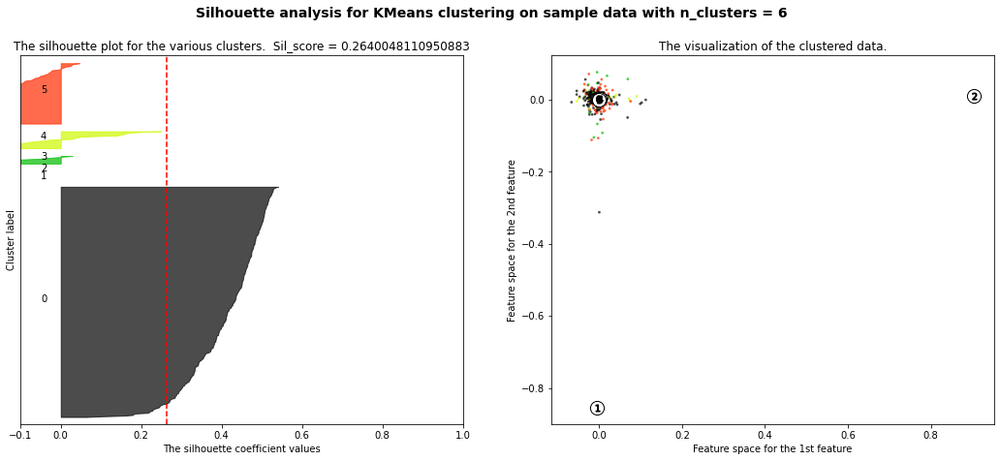

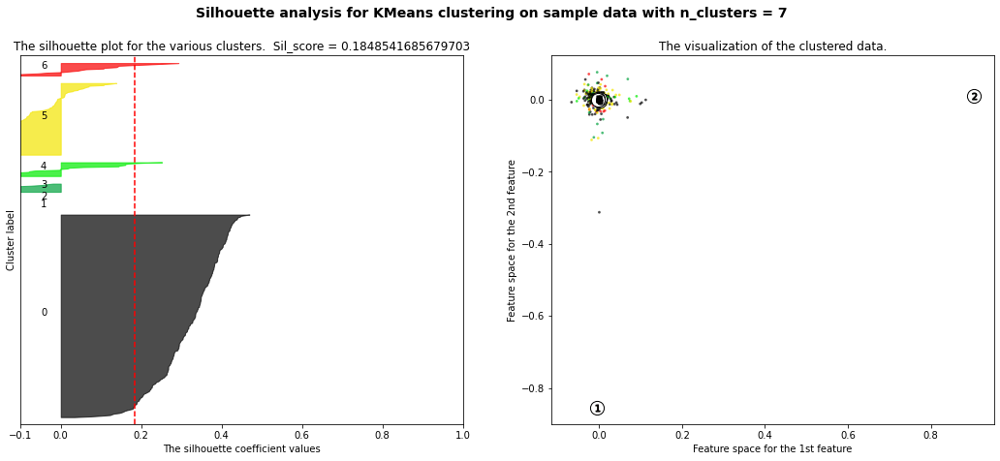

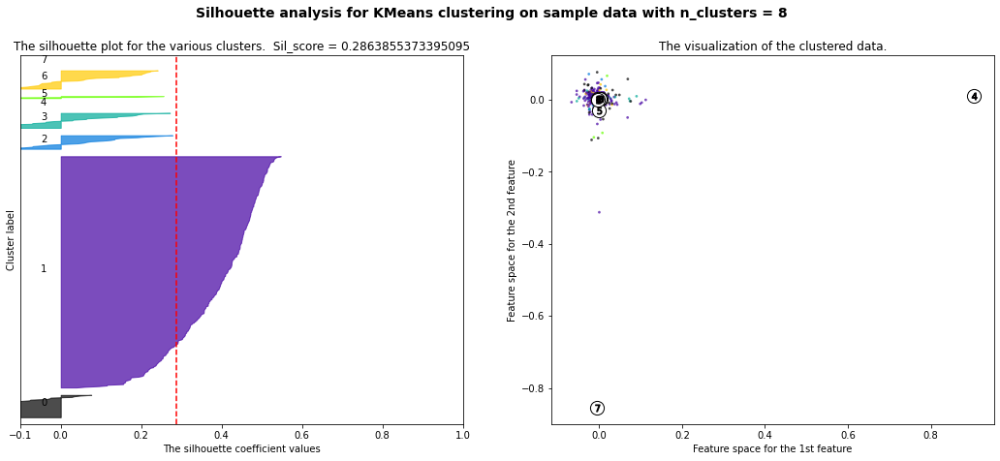

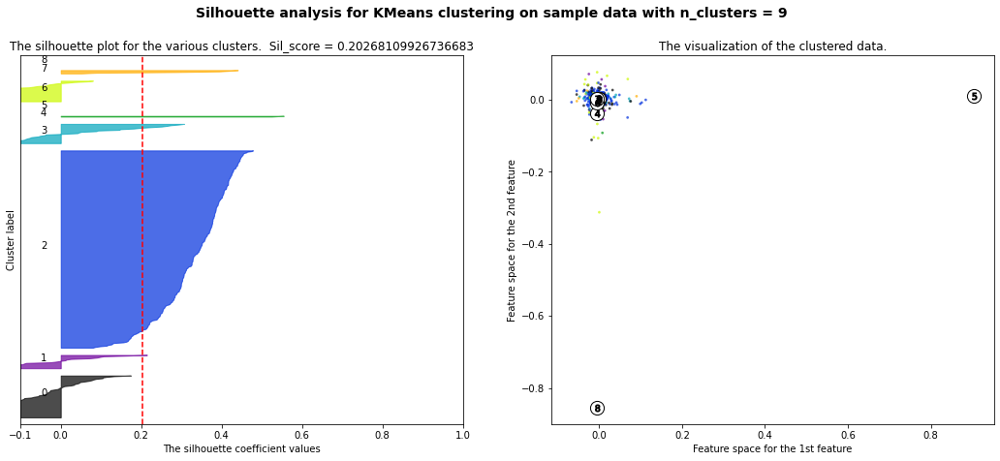

In [16]:
elbow(X_b_ICA, K=25, title ="Elbow Breast Cancer")
sil_score_plot(X_b_ICA)
sil_score_kmeans_2(X_b_ICA, k_values=[2,3,4,5,6,7,8, 9])

In [14]:
df_b

NameError: name 'df_b' is not defined

Accuracy of clustering: 0.6747252747252748


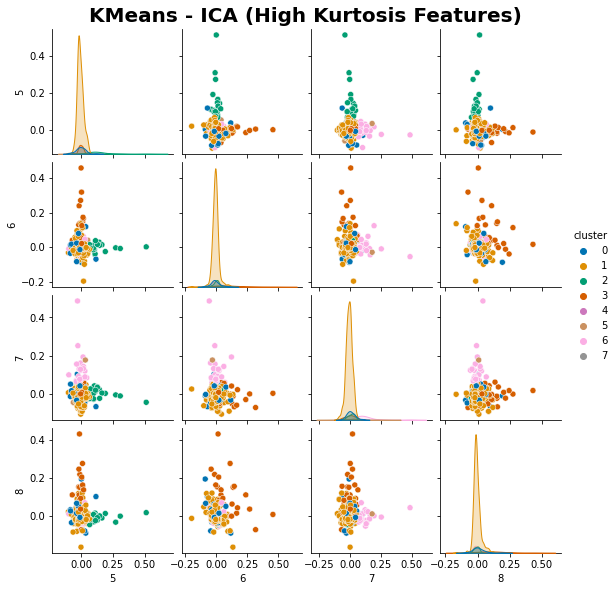

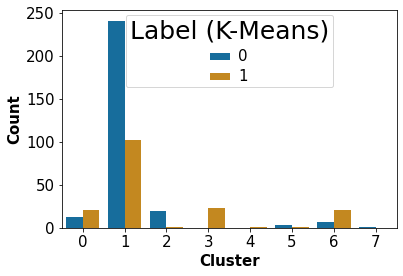

<Figure size 144x144 with 0 Axes>

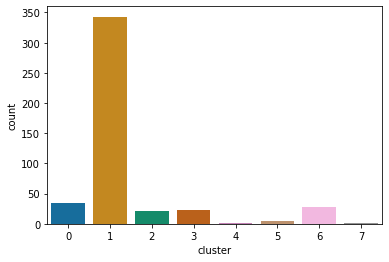

In [123]:
n_clusters = 8
X_val = X_b_ICA
km_b = KMeans(n_clusters=n_clusters, random_state = 2)
km_b = km_b.fit(X_val)
cluster = km_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
cluster_label_accuracy(cluster, y_b)

g =sns.pairplot(df_b[[5,6,7,8, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("KMeans - ICA (High Kurtosis Features)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, km_b)

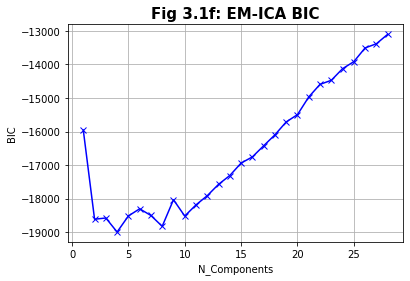

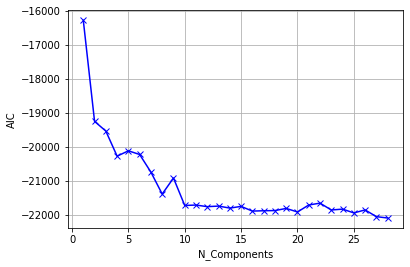

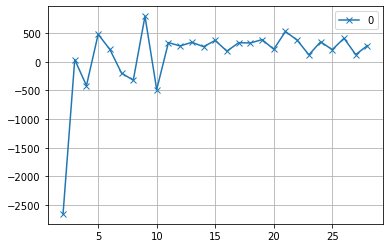

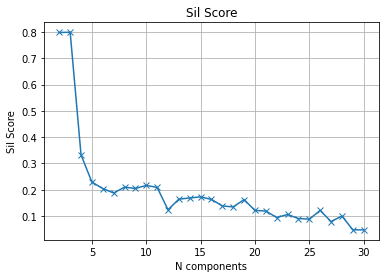

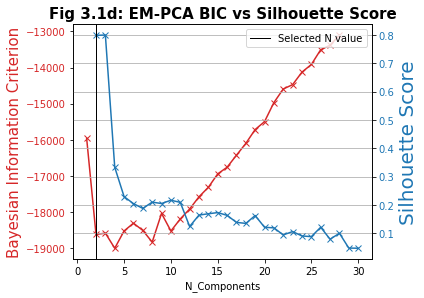

In [150]:
elbow_EM(X_b_ICA, return_result = False, title = "Fig 3.1f: EM-ICA BIC")
sil_score_plot_EM(X_b_ICA)
twinx_EM(X_b_ICA, title = "Fig 3.1d: EM-PCA BIC vs Silhouette Score")

Accuracy of clustering: 0.8087912087912088


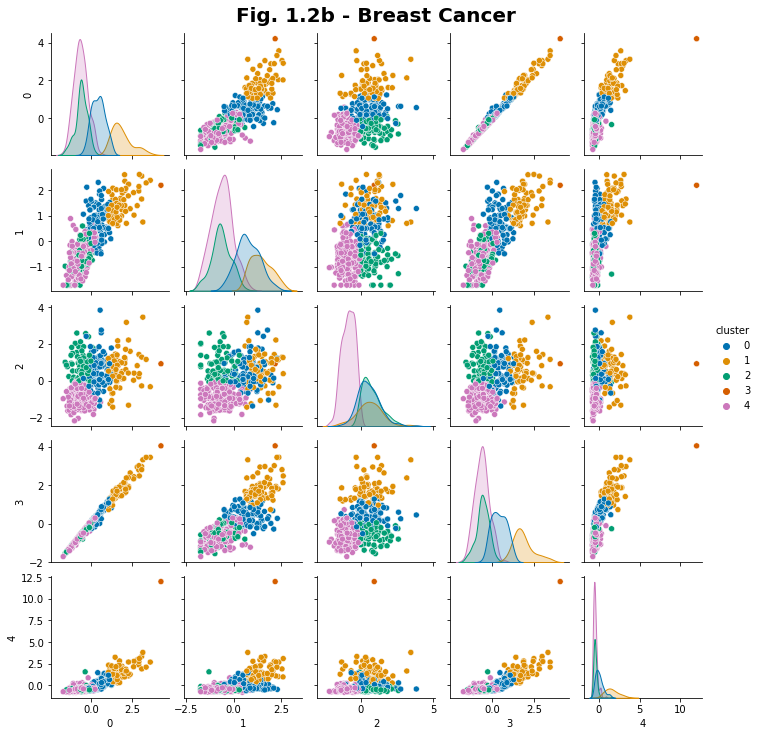

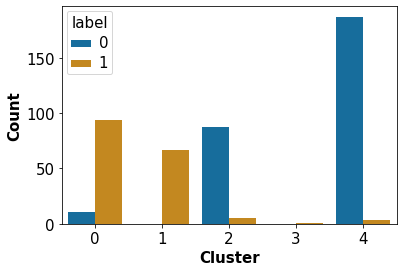

<Figure size 144x144 with 0 Axes>

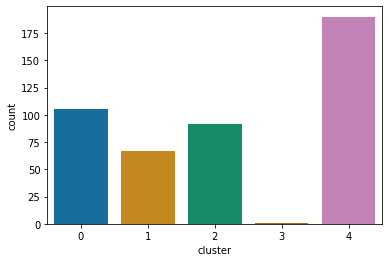

In [54]:
n_clusters = 5
X_val = X_b_FI
km_b = KMeans(n_clusters=n_clusters, random_state = 1)
km_b = km_b.fit(X_val)
cluster = km_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
cluster_label_accuracy(cluster, y_b)

g =sns.pairplot(df_b, hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("Fig. 1.2b - Breast Cancer", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, km_b)

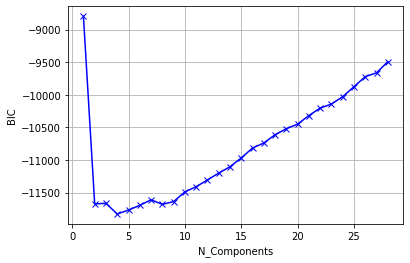

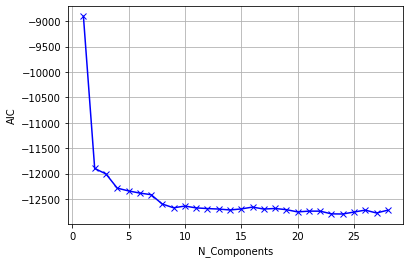

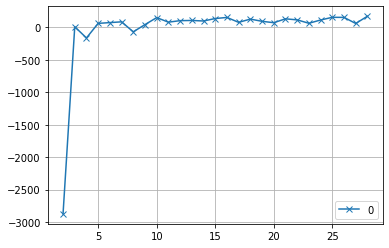

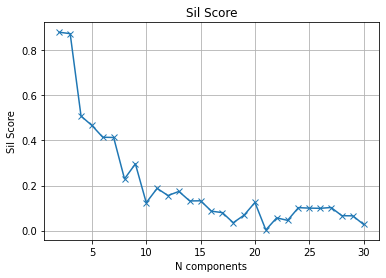

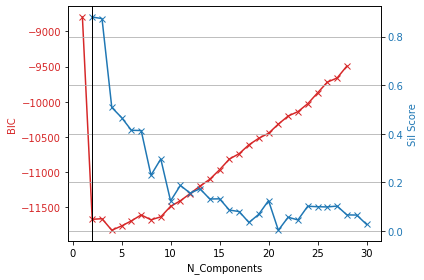

In [107]:
elbow_EM(X_b_ICA, return_result = False)
sil_score_plot_EM(X_b_ICA)
twinx_EM(X_b_ICA)

Accuracy of clustering: 0.6263736263736264


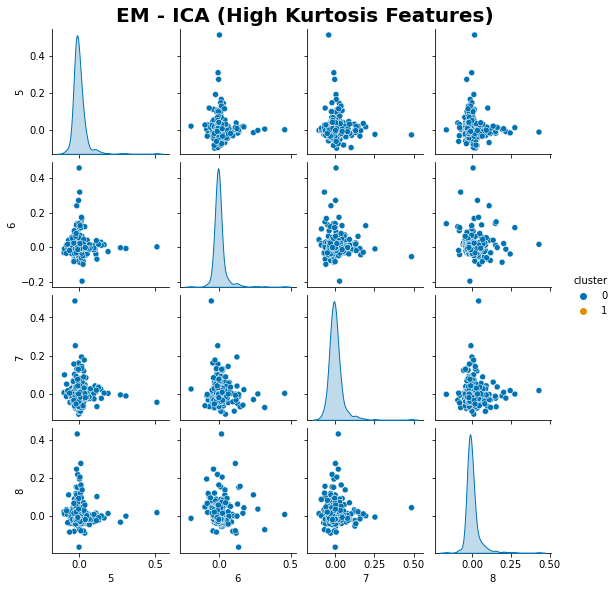

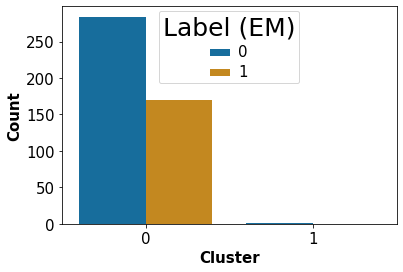

<Figure size 144x144 with 0 Axes>

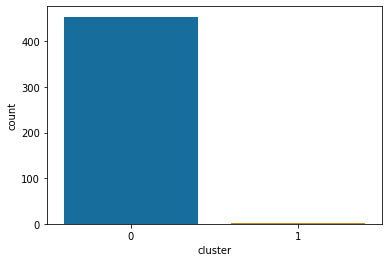

In [145]:
#Breast Cancer
n_clusters = 2
X_val = X_b_ICA
gmm_b = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_b.fit(X_val)
cluster = gmm_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
g =sns.pairplot(df_b[[5,6,7,8, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

df_b["label"] = y_b.values
cluster_label_accuracy(cluster, y_b)
g.fig.suptitle("EM - ICA (High Kurtosis Features)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, gmm_b, em=True)

## RP BC

Using Kneed
6


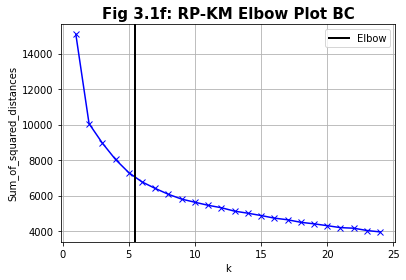

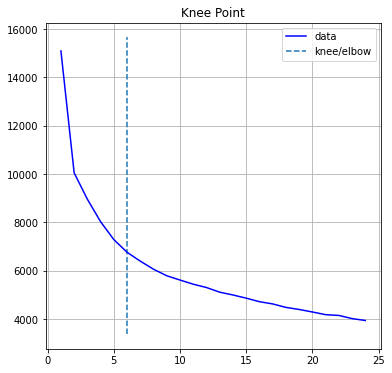

For n_clusters = 2 The average silhouette_score is : 0.3414121686039202
For n_clusters = 3 The average silhouette_score is : 0.32920177716055793
For n_clusters = 4 The average silhouette_score is : 0.17796544139558002
For n_clusters = 5 The average silhouette_score is : 0.18539528676789988
For n_clusters = 6 The average silhouette_score is : 0.16864859693905557
For n_clusters = 7 The average silhouette_score is : 0.15766092717328575
For n_clusters = 8 The average silhouette_score is : 0.161901879377894
For n_clusters = 9 The average silhouette_score is : 0.15958833958050406


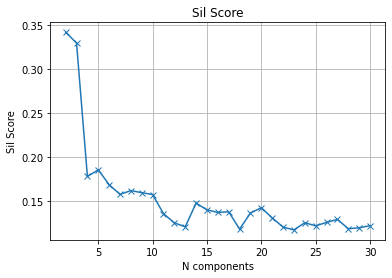

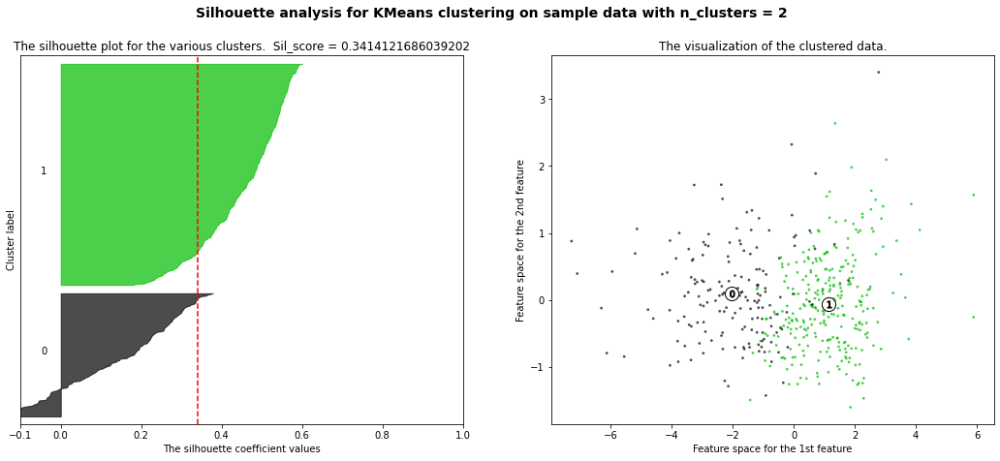

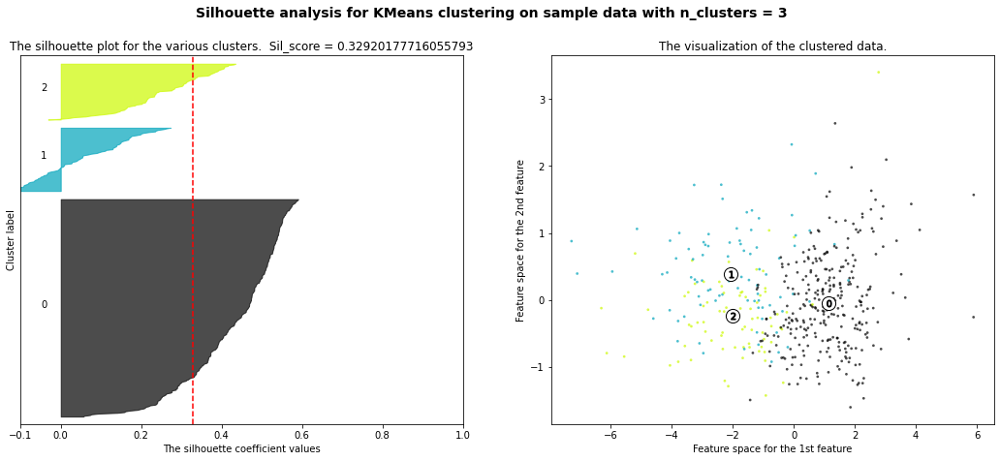

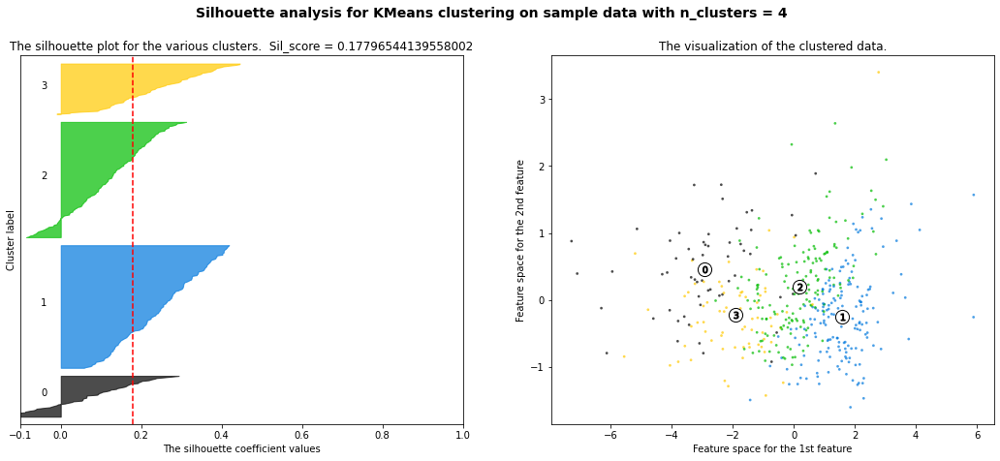

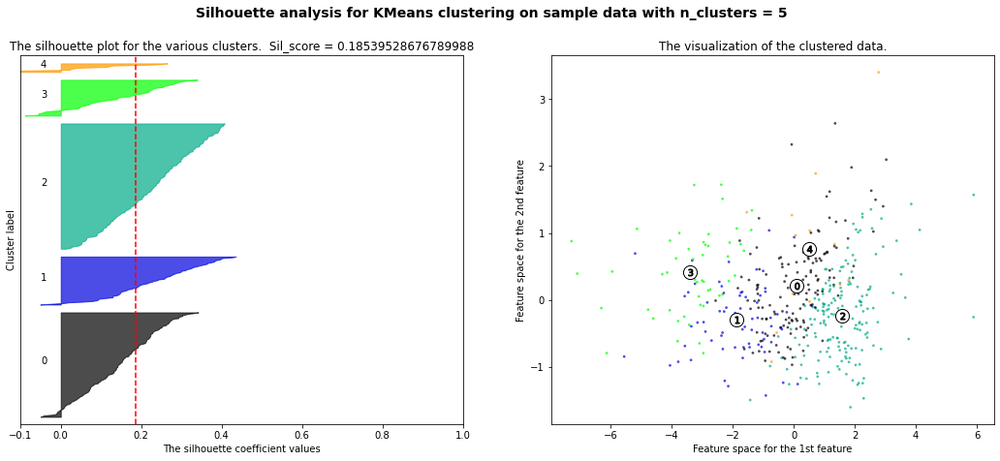

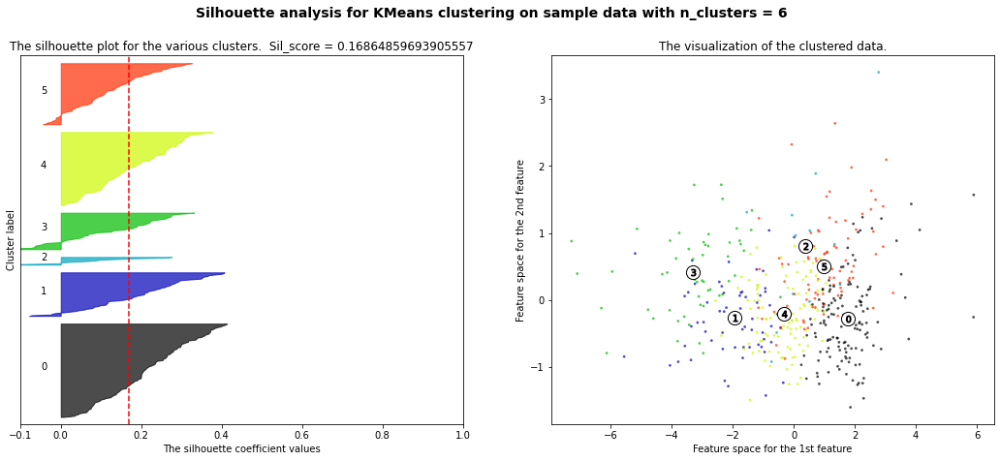

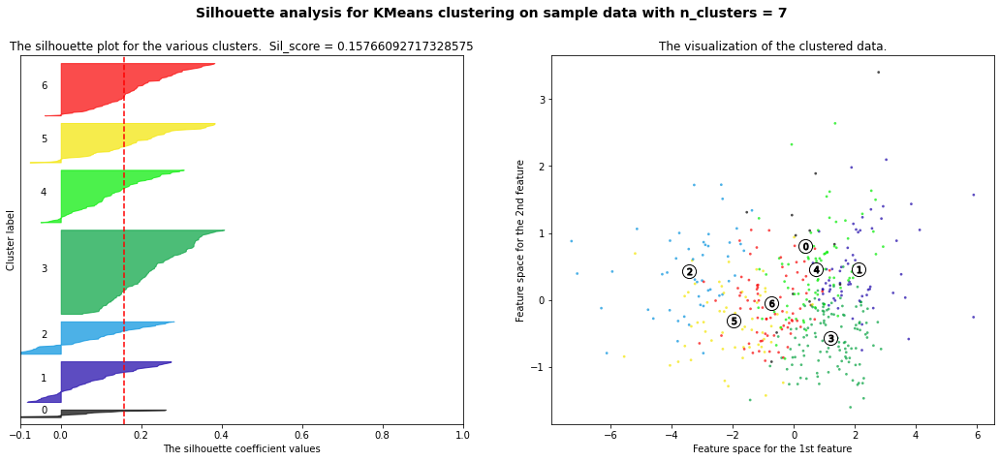

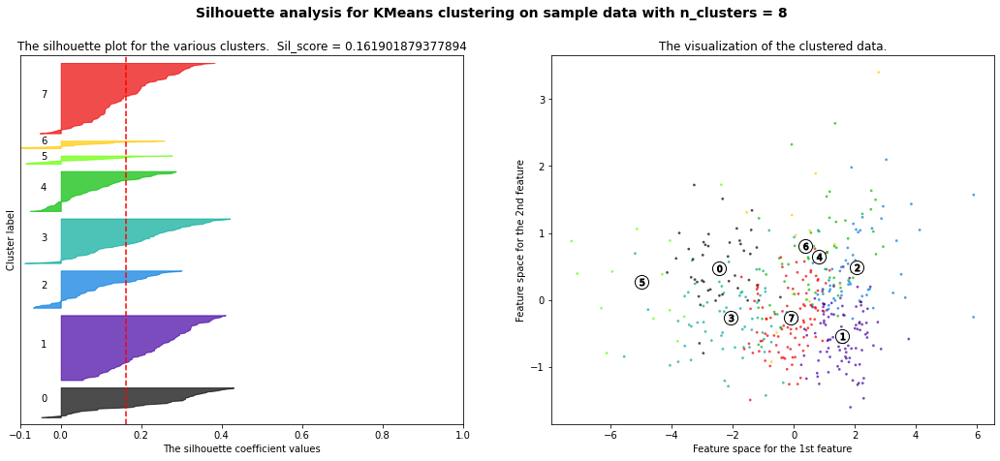

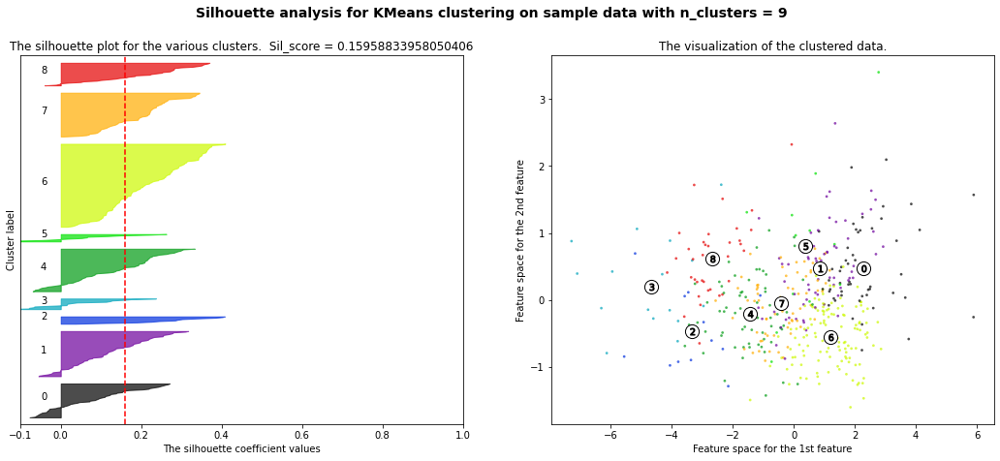

In [152]:
elbow(X_b_rp, K=25, title ="Fig 3.1f: RP-KM Elbow Plot BC")
sil_score_plot(X_b_rp)
sil_score_kmeans_2(X_b_rp, k_values=[2,3,4,5,6,7,8, 9])

Accuracy of clustering: 0.8813186813186813


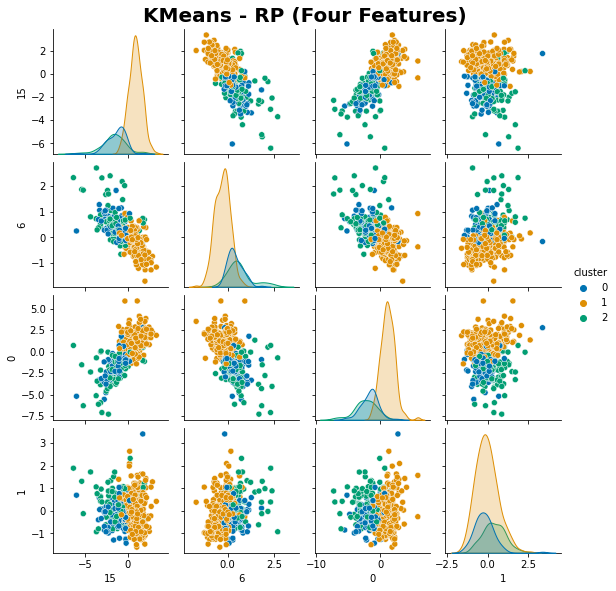

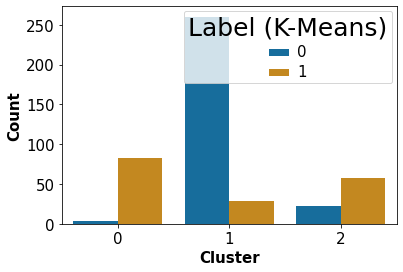

<Figure size 144x144 with 0 Axes>

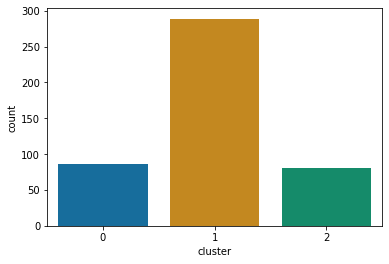

In [218]:
n_clusters = 3
X_val = X_b_rp
km_b = KMeans(n_clusters=n_clusters, random_state = 1)
km_b = km_b.fit(X_val)
cluster = km_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
cluster_label_accuracy(cluster, y_b)

g =sns.pairplot(df_b[[15,6,0,1, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("KMeans - RP (Four Features)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, km_b)

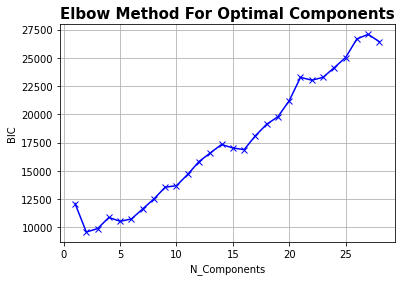

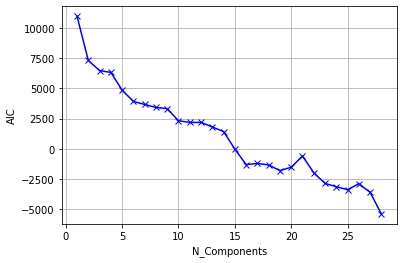

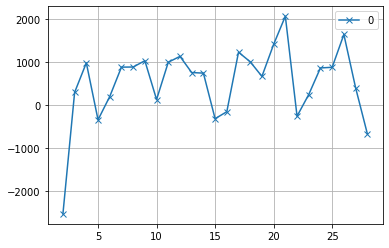

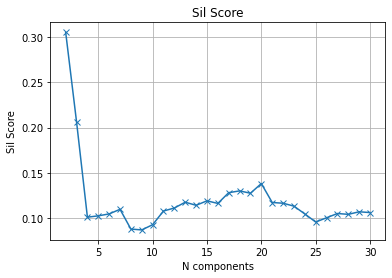

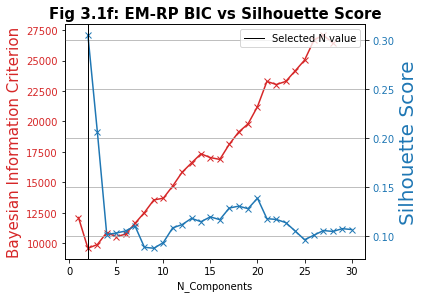

In [155]:
elbow_EM(X_b_rp, return_result = False)
sil_score_plot_EM(X_b_rp)
twinx_EM(X_b_rp,title = "Fig 3.1f: EM-RP BIC vs Silhouette Score")

Accuracy of clustering: 0.8527472527472527


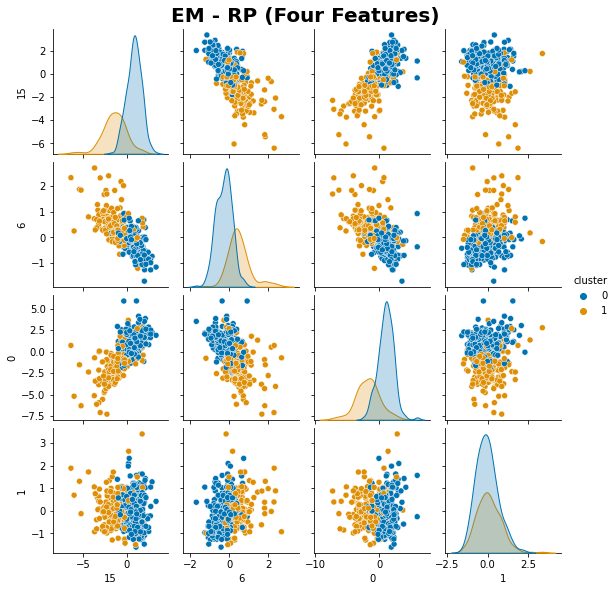

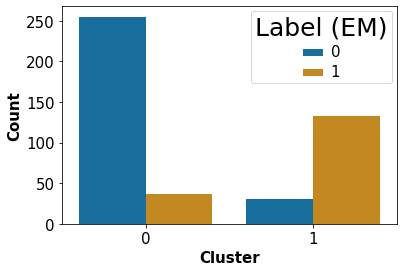

<Figure size 144x144 with 0 Axes>

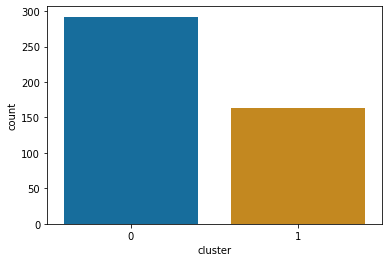

In [132]:
#Breast Cancer
n_clusters = 2
X_val = X_b_rp
gmm_b = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_b.fit(X_val)
cluster = gmm_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
g =sns.pairplot(df_b[[15,6,0,1, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

df_b["label"] = y_b.values
cluster_label_accuracy(cluster, y_b)
g.fig.suptitle("EM - RP (Four Features)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, gmm_b, em=True)

## FI

Using Kneed
5


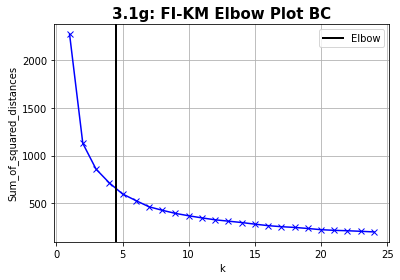

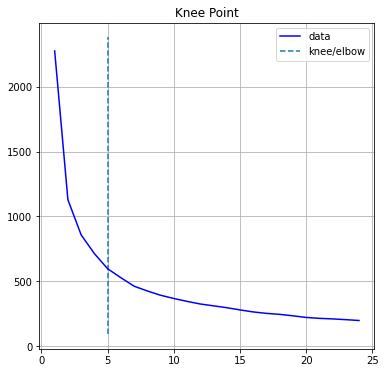

For n_clusters = 2 The average silhouette_score is : 0.4909583430633914
For n_clusters = 3 The average silhouette_score is : 0.36071534430354657
For n_clusters = 4 The average silhouette_score is : 0.30250496868234433
For n_clusters = 5 The average silhouette_score is : 0.30981140790447176
For n_clusters = 6 The average silhouette_score is : 0.27318543597953254
For n_clusters = 7 The average silhouette_score is : 0.2662745679483203
For n_clusters = 8 The average silhouette_score is : 0.2597831896361355
For n_clusters = 9 The average silhouette_score is : 0.2567015956065371


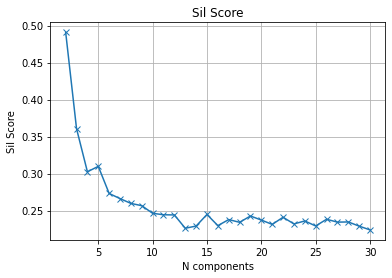

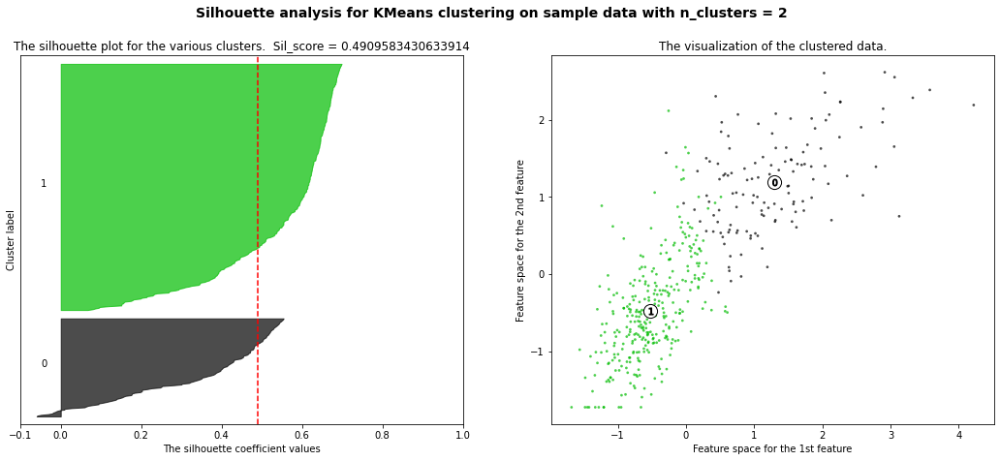

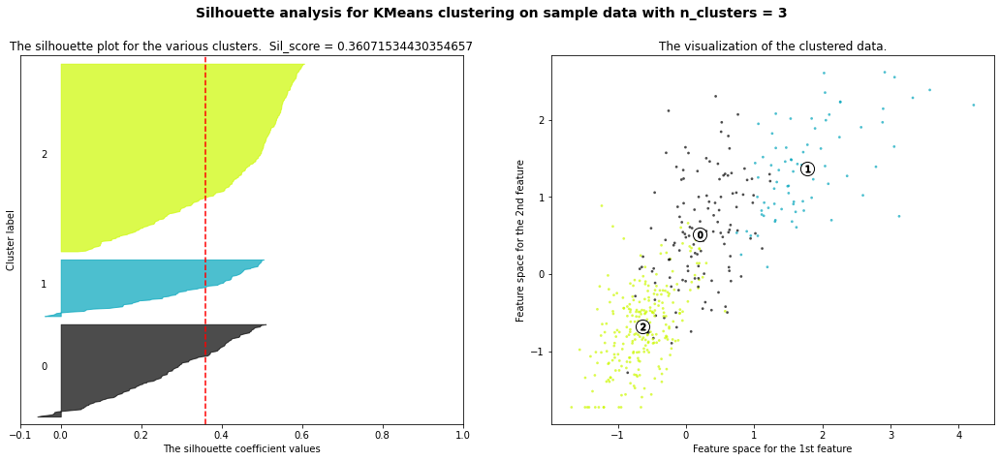

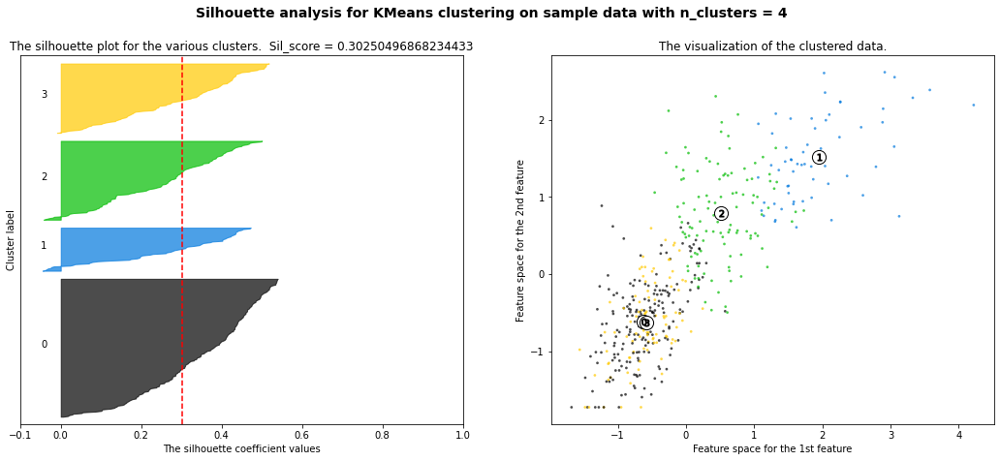

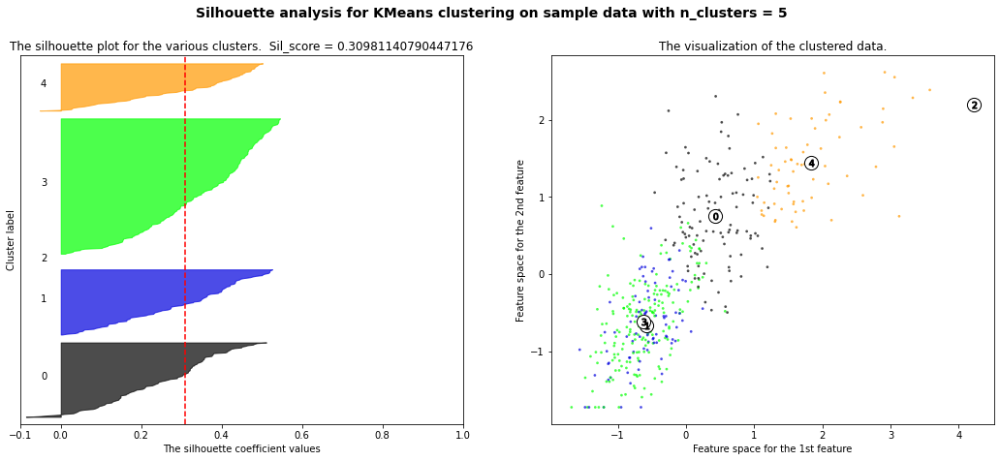

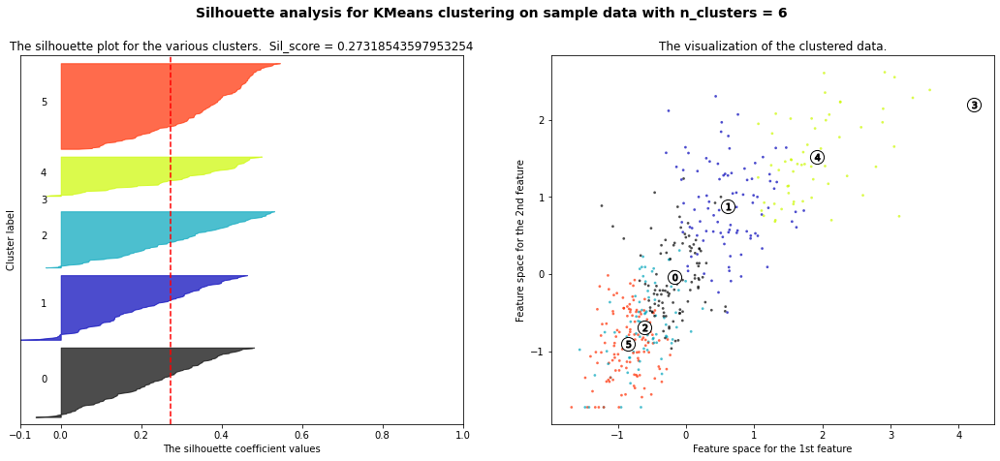

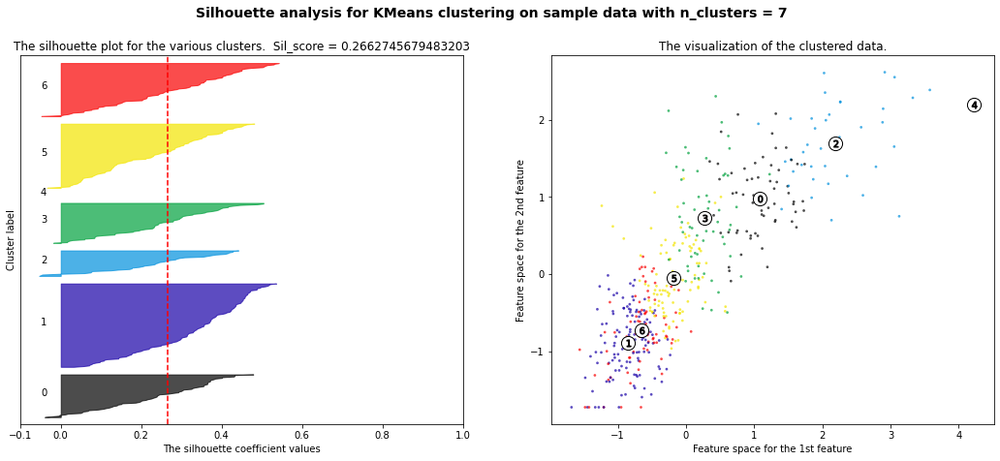

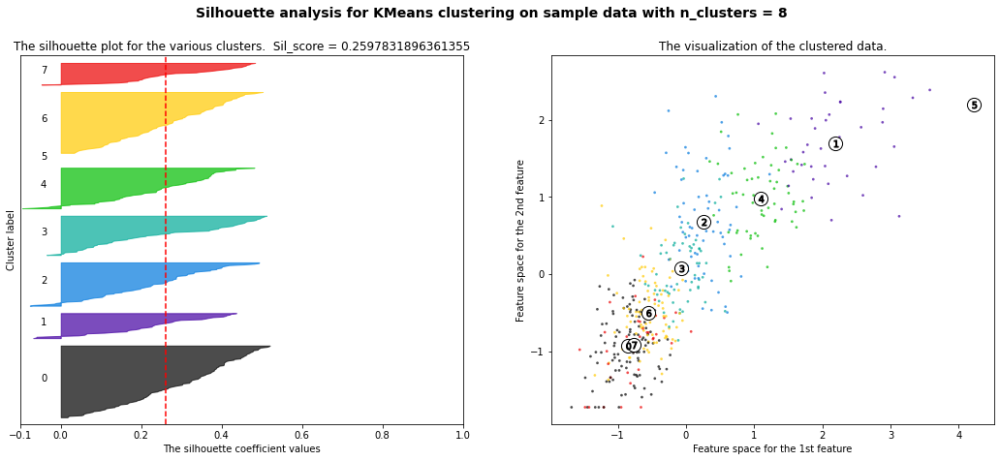

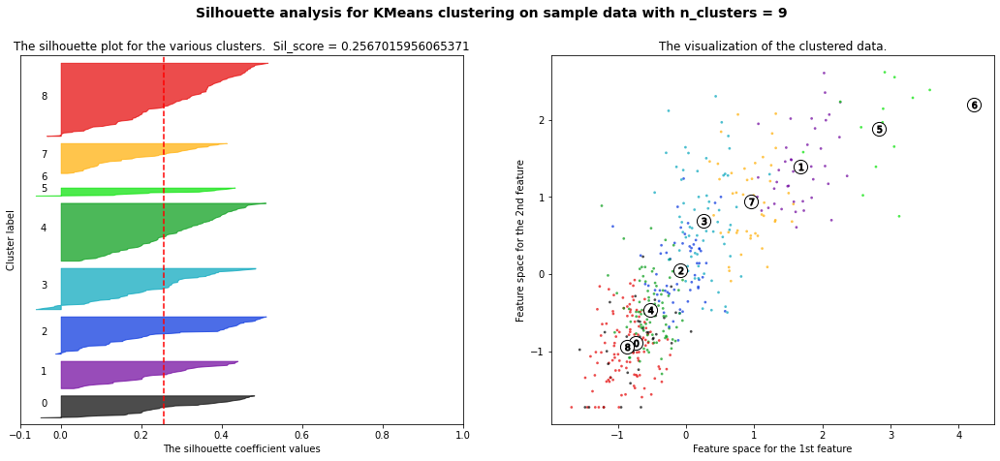

In [154]:
elbow(X_b_FI, K=25, title ="3.1g: FI-KM Elbow Plot BC")
sil_score_plot(X_b_FI)
sil_score_kmeans_2(X_b_FI, k_values=[2,3,4,5,6,7,8, 9])

Accuracy of clustering: 0.8087912087912088


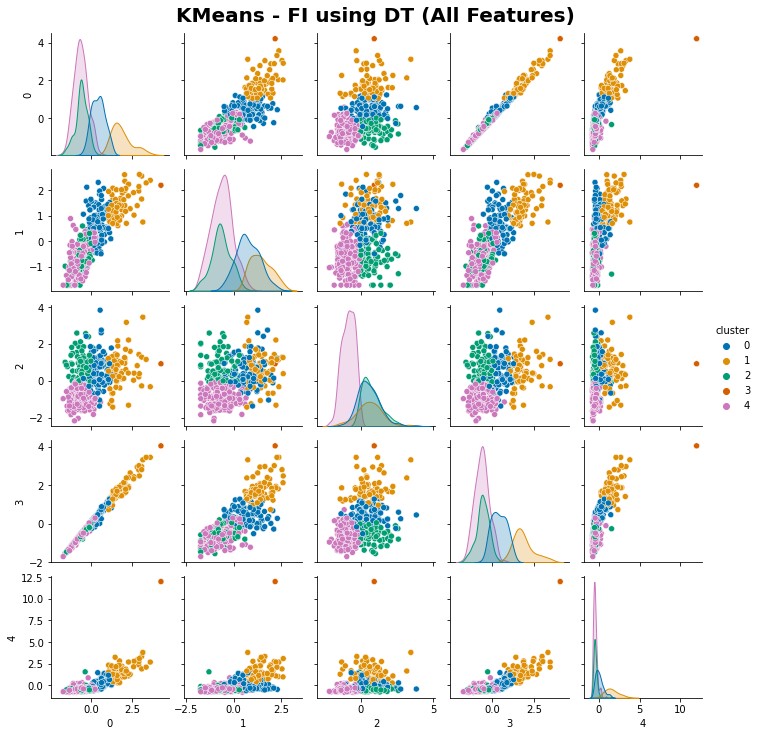

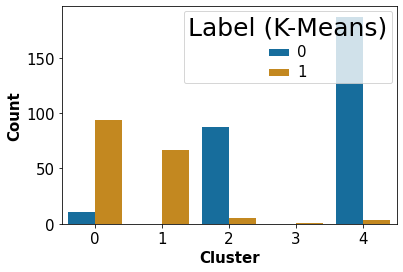

<Figure size 144x144 with 0 Axes>

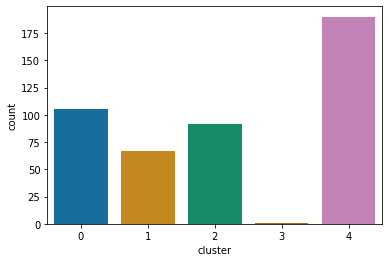

In [136]:
n_clusters = 5
X_val = X_b_FI
km_b = KMeans(n_clusters=n_clusters, random_state = 1)
km_b = km_b.fit(X_val)
cluster = km_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
cluster_label_accuracy(cluster, y_b)

g =sns.pairplot(df_b, hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("KMeans - FI using DT (All Features)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, km_b)

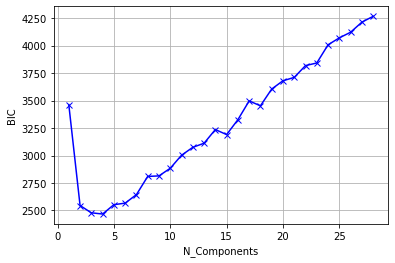

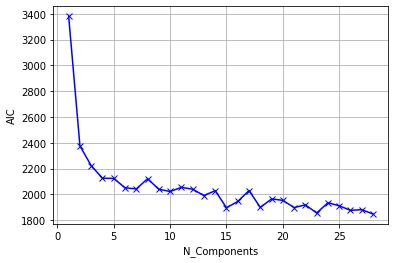

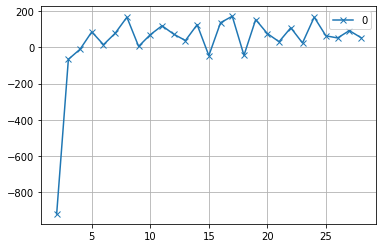

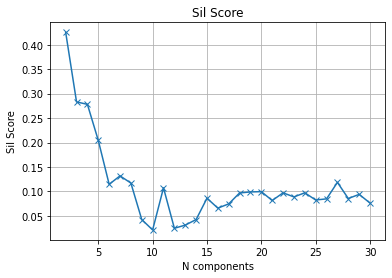

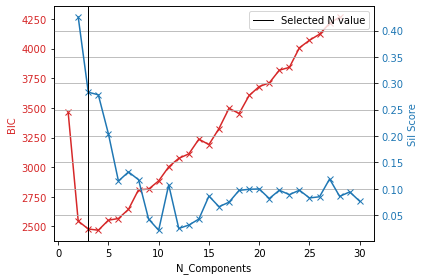

In [148]:
elbow_EM(X_b_FI, return_result = False)
sil_score_plot_EM(X_b_FI)
twinx_EM(X_b_FI,axline=3)

Accuracy of clustering: 0.9098901098901099


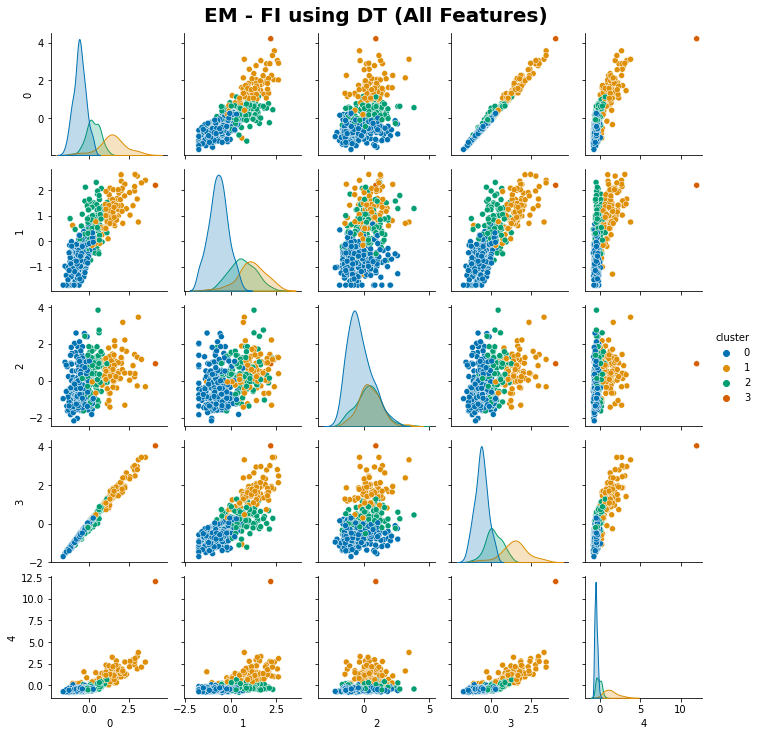

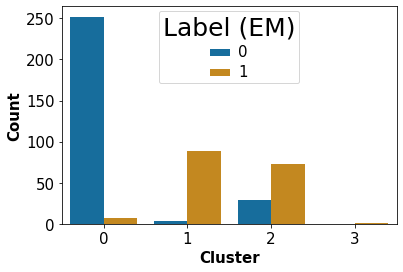

<Figure size 144x144 with 0 Axes>

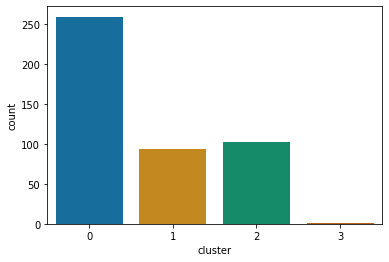

In [134]:
#Breast Cancer
n_clusters = 4
X_val = X_b_FI
gmm_b = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_b.fit(X_val)
cluster = gmm_b.predict(X_val)
df_b = pd.DataFrame(X_val)
df_b["cluster"] = cluster
g =sns.pairplot(df_b, hue="cluster", height = 2, palette = 'colorblind')

df_b["label"] = y_b.values
cluster_label_accuracy(cluster, y_b)
g.fig.suptitle("EM - FI using DT (All Features)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.grid(True)
plt.show()
get_dist(X_val,y_b, gmm_b, em=True)

# Without Dim Reduction WQ

## Default KM

Using Kneed
4


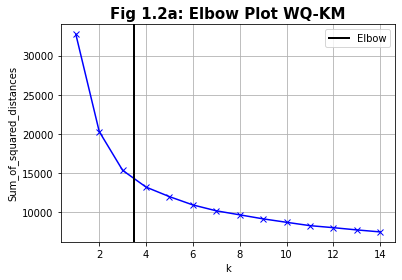

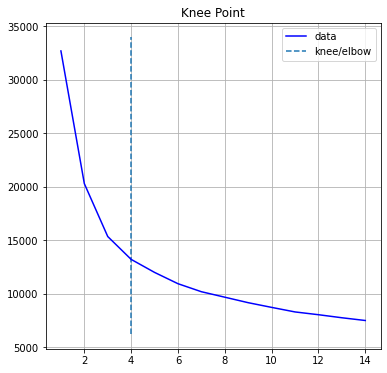

For n_clusters = 2 The average silhouette_score is : 0.42261485996726694
For n_clusters = 3 The average silhouette_score is : 0.3330510758840872
For n_clusters = 4 The average silhouette_score is : 0.32352223522124884
For n_clusters = 5 The average silhouette_score is : 0.2528200979000141
For n_clusters = 6 The average silhouette_score is : 0.2569252391128676


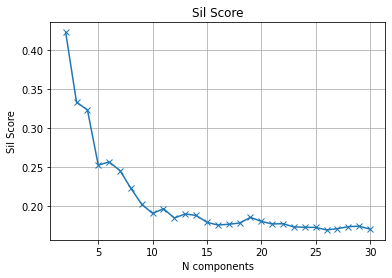

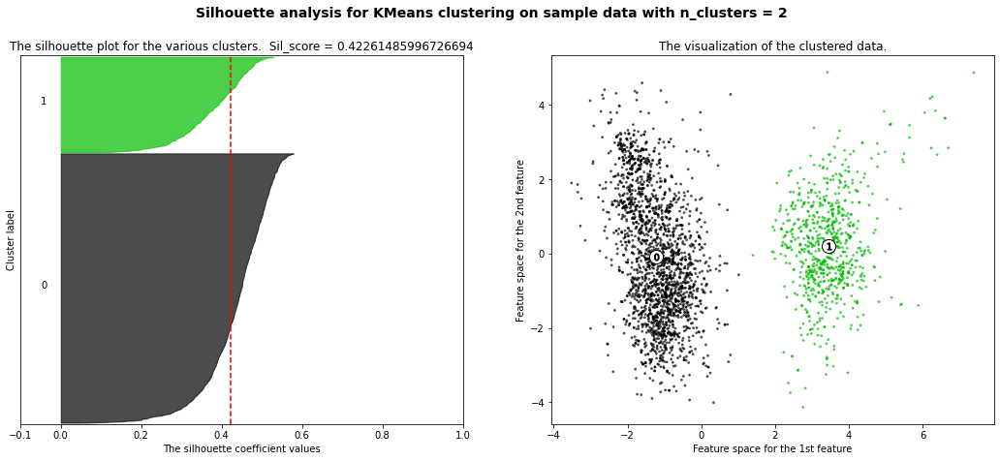

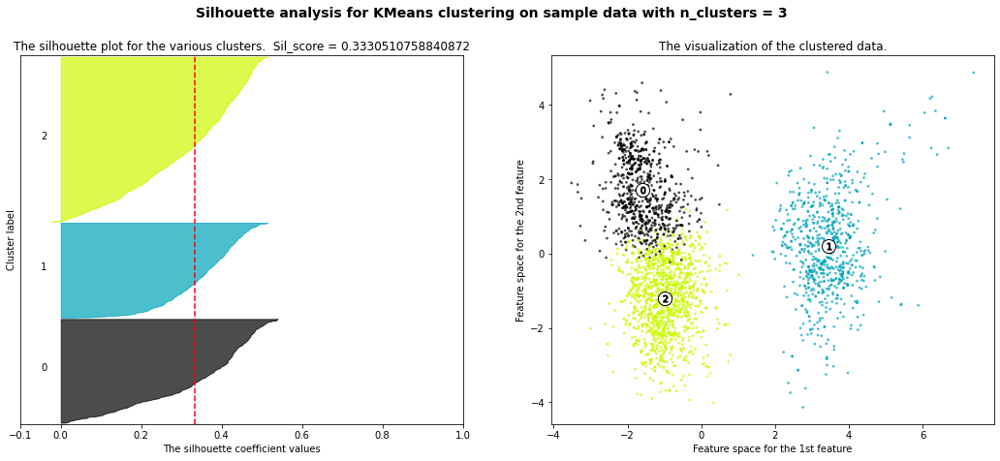

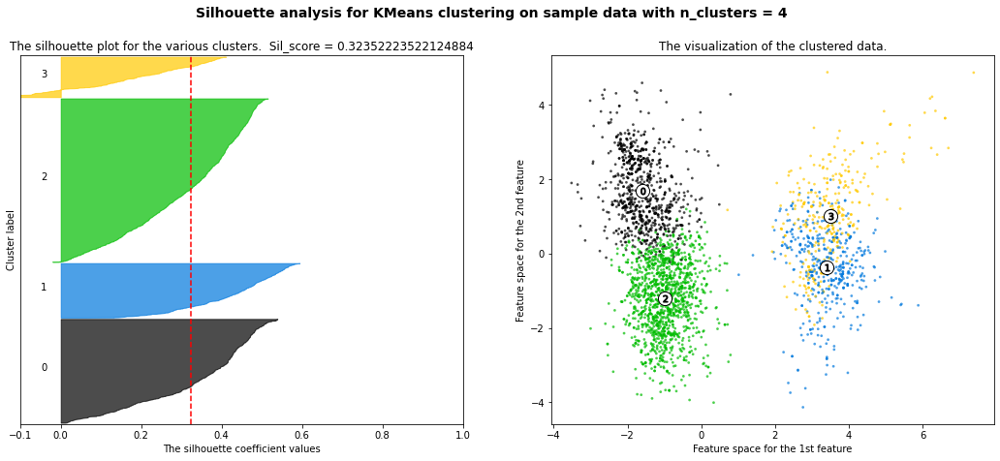

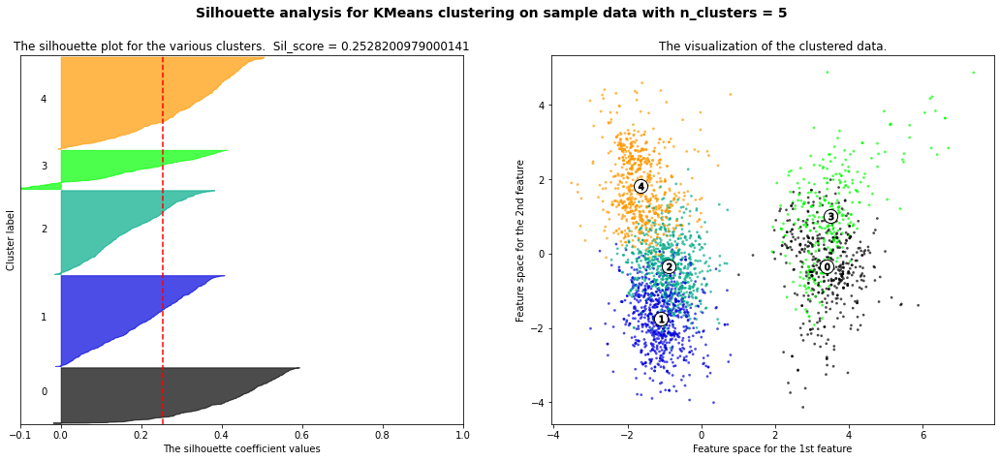

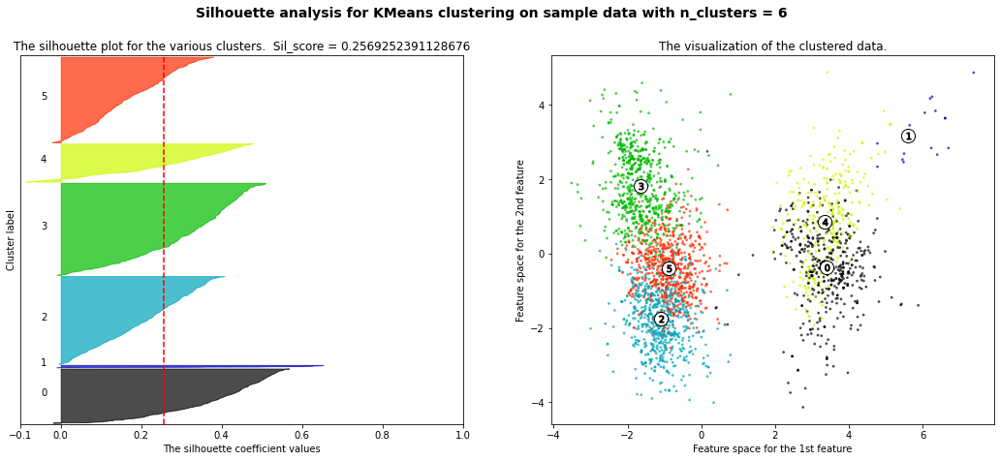

In [59]:
elbow(X_w_pca, title ="Fig 1.2a: Elbow Plot WQ-KM")
sil_score_plot(X_w_pca)
sil_score_kmeans_2(X_w_pca)

In [154]:
data_w

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,isRed,isWhite,label
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,1,0,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,1,0,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,1,0,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,1,0,0
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4887,6.2,0.41,0.22,1.9,0.023,5.0,56.0,0.98928,3.04,0.79,13.0,0,1,1
4888,6.8,0.22,0.36,1.2,0.052,38.0,127.0,0.99330,3.04,0.54,9.2,0,1,0
4892,6.5,0.23,0.38,1.3,0.032,29.0,112.0,0.99298,3.29,0.54,9.7,0,1,0
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0,1,0


In [153]:
X_w.shape

(2928, 13)

elbow(X_w, title ="Elbow Breast Cancer")
sil_score_plot(X_w)

For n_clusters = 2 The average silhouette_score is : 0.3736524894864105
For n_clusters = 3 The average silhouette_score is : 0.2783634898013624
For n_clusters = 4 The average silhouette_score is : 0.26764371254242414
For n_clusters = 5 The average silhouette_score is : 0.20169056764762375
For n_clusters = 6 The average silhouette_score is : 0.2054506761202489


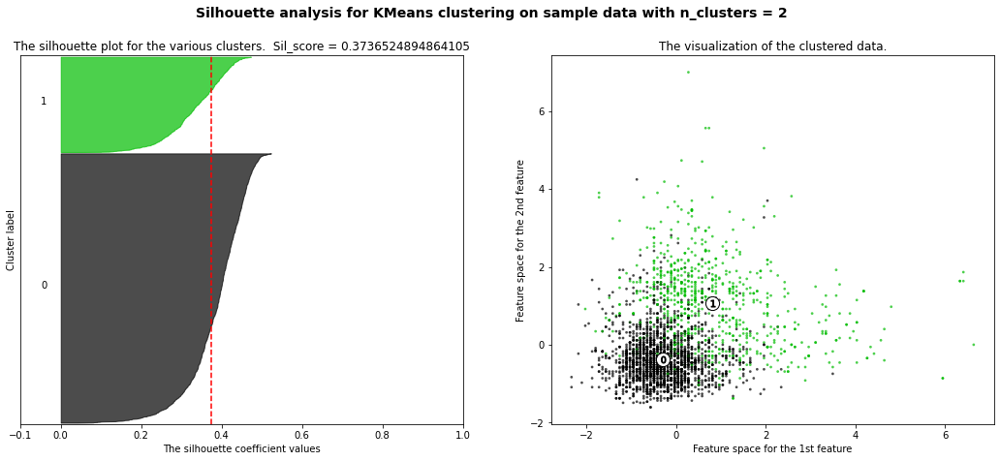

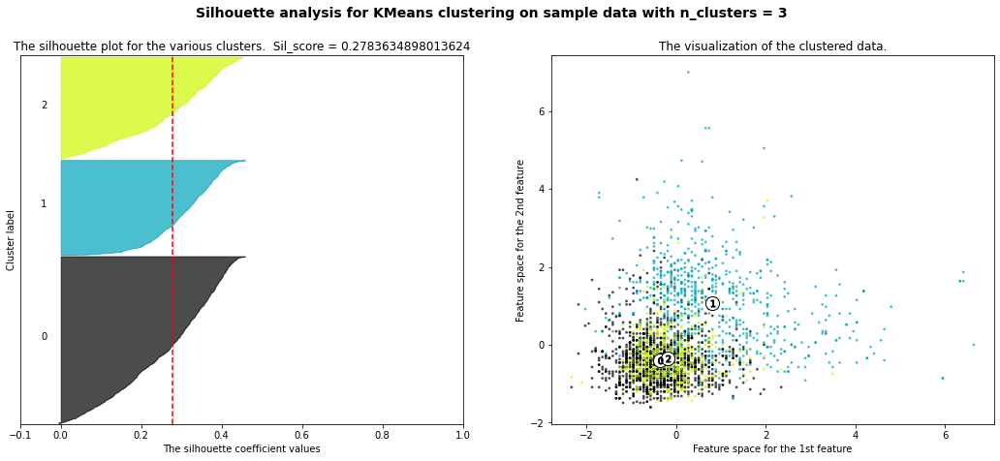

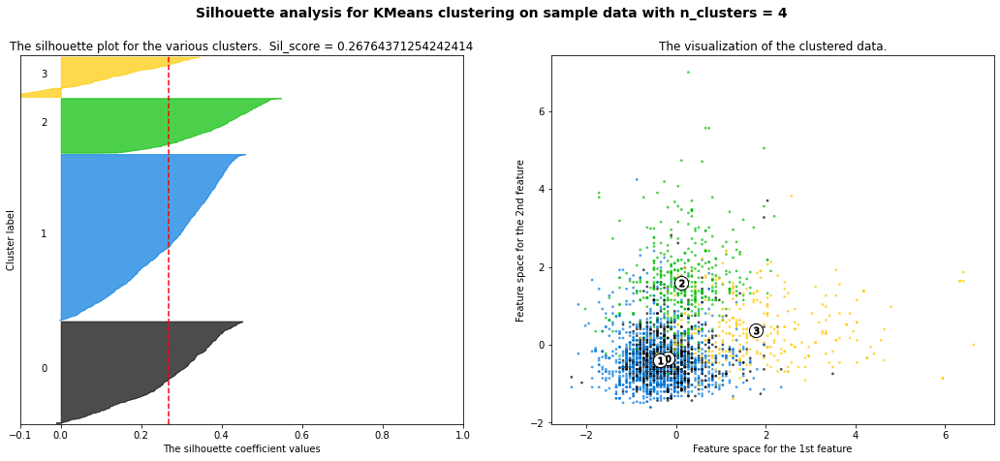

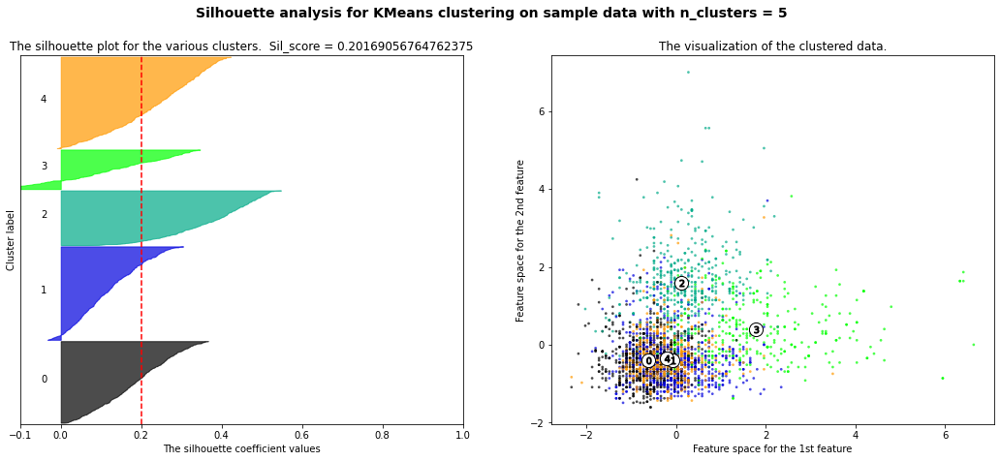

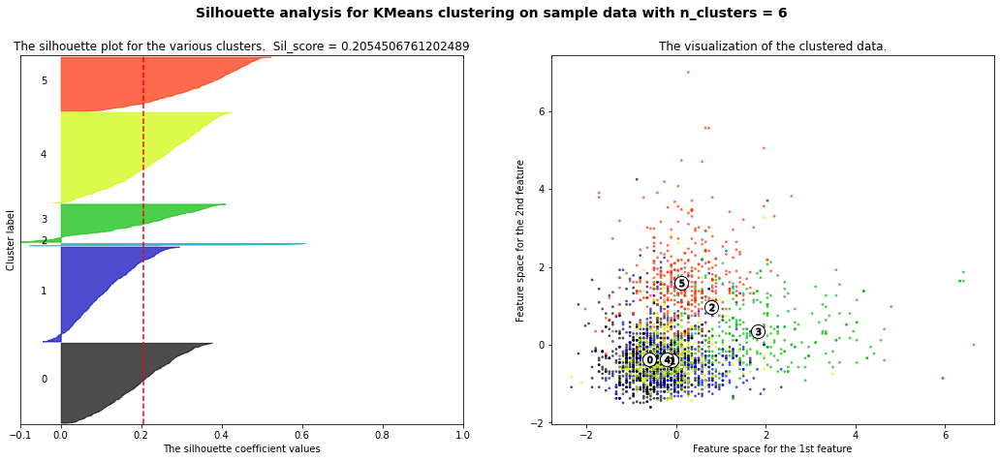

In [178]:
sil_score_kmeans_2(X_w)

Balanced Accuracy of clustering: 0.6872563939134495


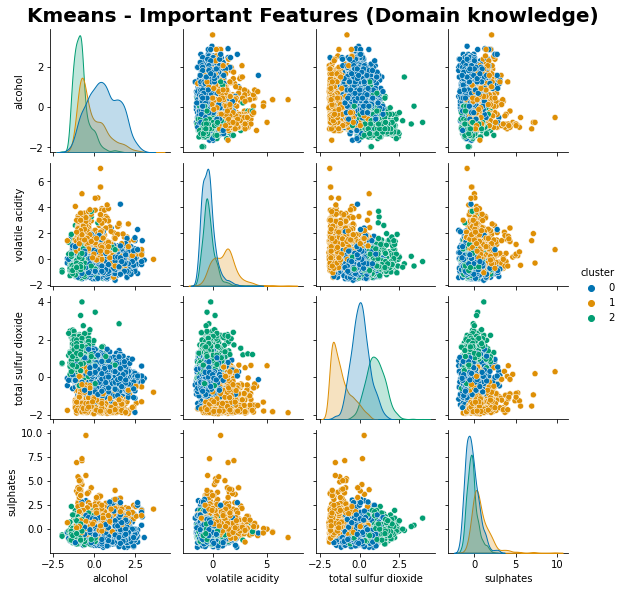

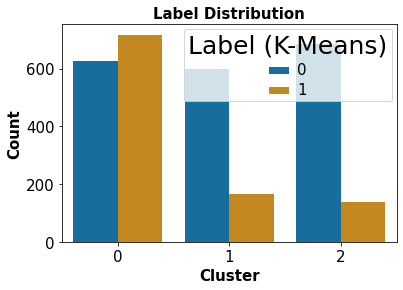

<Figure size 144x144 with 0 Axes>

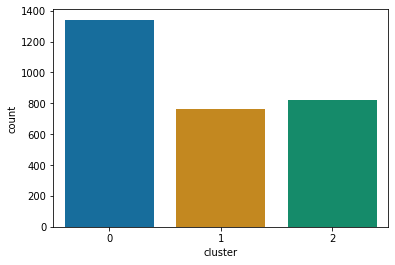

In [65]:
#Wine
n_clusters = 3
km_w = KMeans(n_clusters=n_clusters, random_state = random_seed)
km_w = km_w.fit(X_w)
cluster = km_w.predict(X_w)
df_w = pd.DataFrame(X_w, columns = data_w.iloc[:,:-1].columns)
df_w["cluster"] = cluster
df_w["label"] = y_w.values
cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)

g =sns.pairplot(df_w[["alcohol", "volatile acidity", "total sulfur dioxide", "sulphates","cluster"]], hue="cluster", height = 2, palette = 'colorblind')


g.fig.suptitle("Kmeans - Important Features (Domain knowledge)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.show()
get_dist(X_w,y_w, km_w)

In [ ]:
#Wine
n_clusters = 3
km_w = KMeans(n_clusters=n_clusters, random_state = random_seed)
km_w = km_w.fit(X_w)
cluster = km_w.predict(X_w)
df_w = pd.DataFrame(X_w, columns = data_w.iloc[:,:-1].columns)
df_w["cluster"] = cluster
df_w["label"] = y_w.values
cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)

g =sns.pairplot(df_w[["alcohol", "volatile acidity","cluster"]], hue="cluster", height = 2, palette = 'colorblind')


g.fig.suptitle("Kmeans - Important Features (Domain knowledge)", y = 1.02, fontsize=20, fontweight ='heavy')
plt.show()
get_dist(X_w,y_w, km_w)

## Default EM

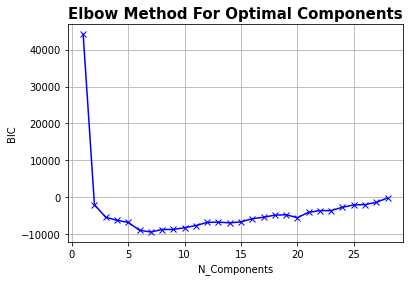

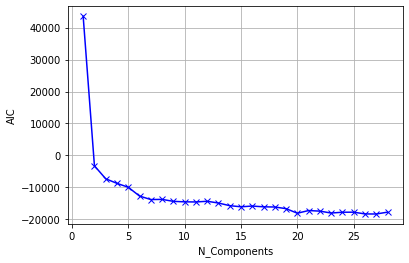

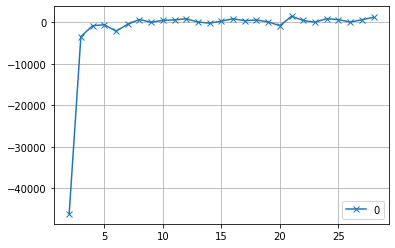

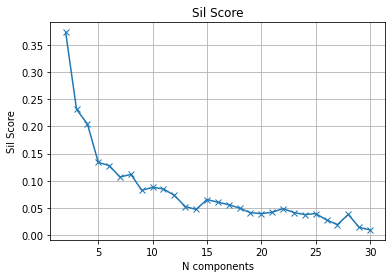

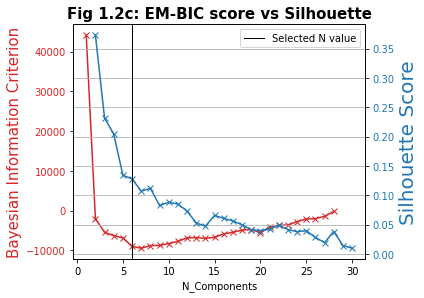

In [164]:
elbow_EM(X_w, return_result = False)
sil_score_plot_EM(X_w)
twinx_EM(X_w, axline=6, title = "Fig 1.2c: EM-BIC score vs Silhouette")

Balanced Accuracy of clustering: 0.7214016918954704


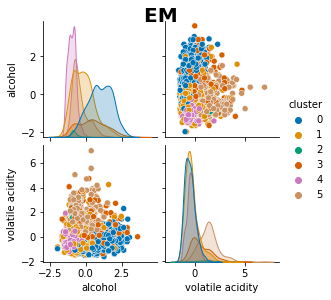

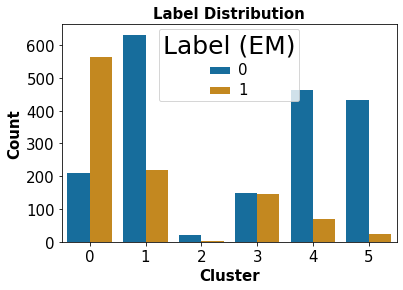

<Figure size 144x144 with 0 Axes>

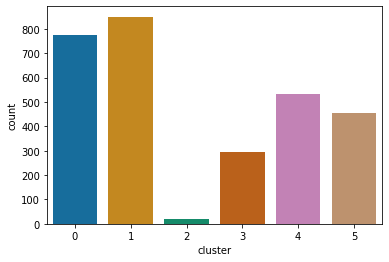

In [69]:
#Wine
n_clusters = 6
X_val = X_w
gmm_w = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_w.fit(X_val)
cluster = gmm_w.predict(X_val)
df_w = pd.DataFrame(X_val, columns = data_w.iloc[:,:-1].columns)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[["alcohol", "volatile acidity","cluster"]], hue="cluster", height = 2, palette = 'colorblind')
g.fig.suptitle("EM ", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()
get_dist(X_val,y_w, gmm_w, True)

## PCA WQ

### PCA KM

Using Kneed
4


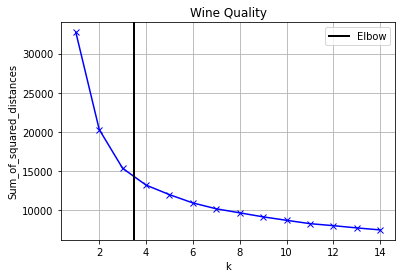

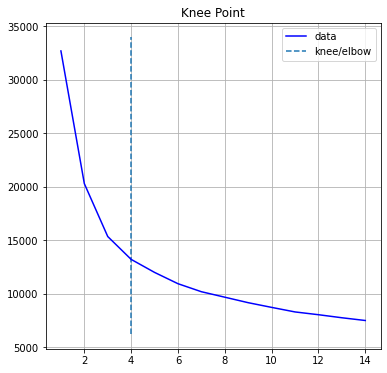

For n_clusters = 2 The average silhouette_score is : 0.42261485996740816
For n_clusters = 3 The average silhouette_score is : 0.3330510758848467
For n_clusters = 4 The average silhouette_score is : 0.32352223522184476
For n_clusters = 5 The average silhouette_score is : 0.2528200979009382
For n_clusters = 6 The average silhouette_score is : 0.25692523911375803


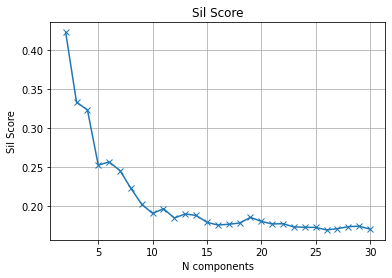

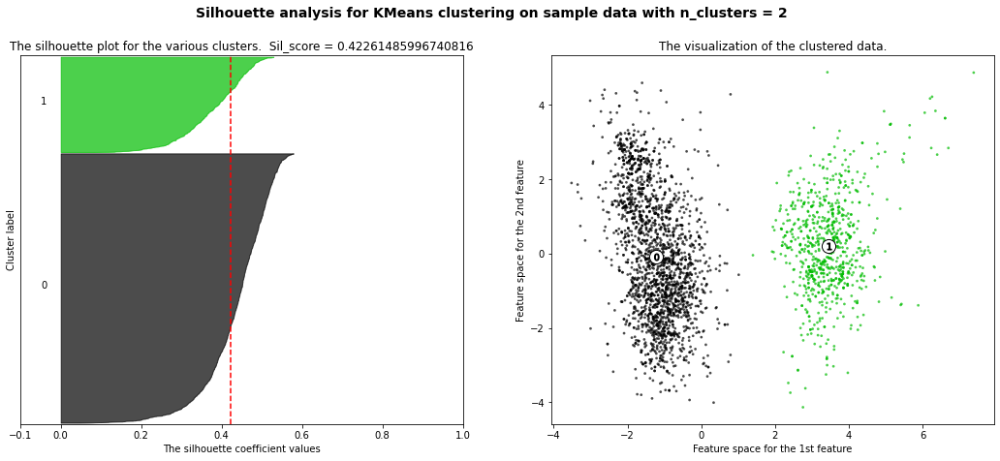

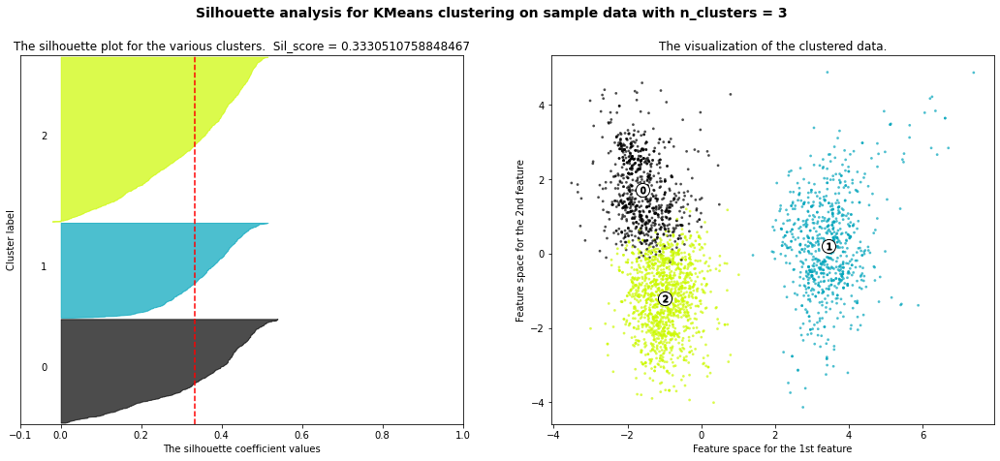

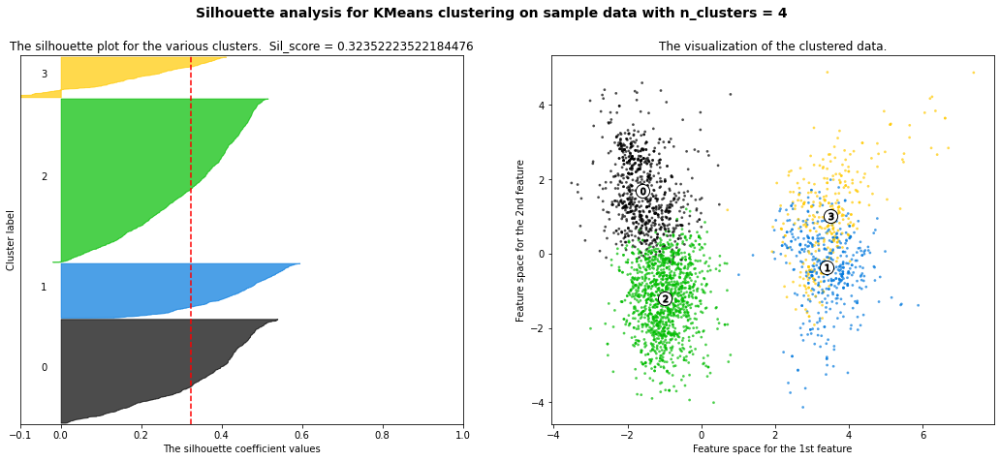

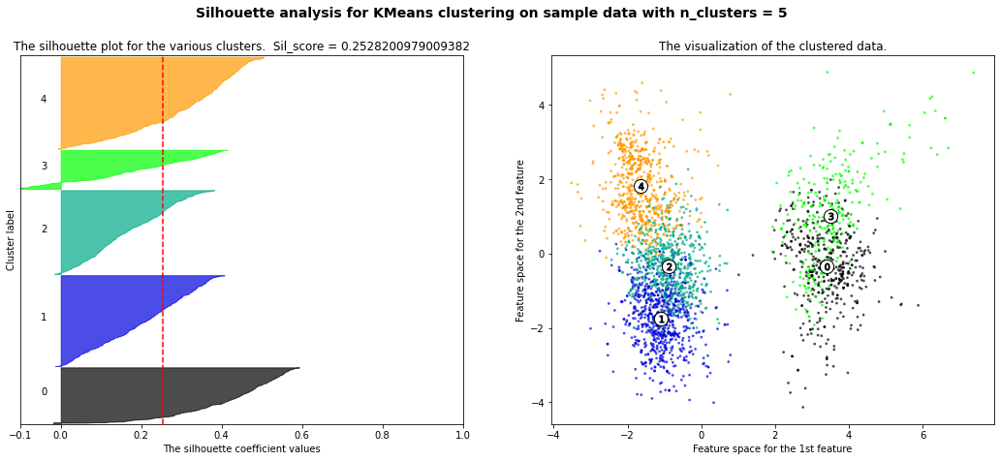

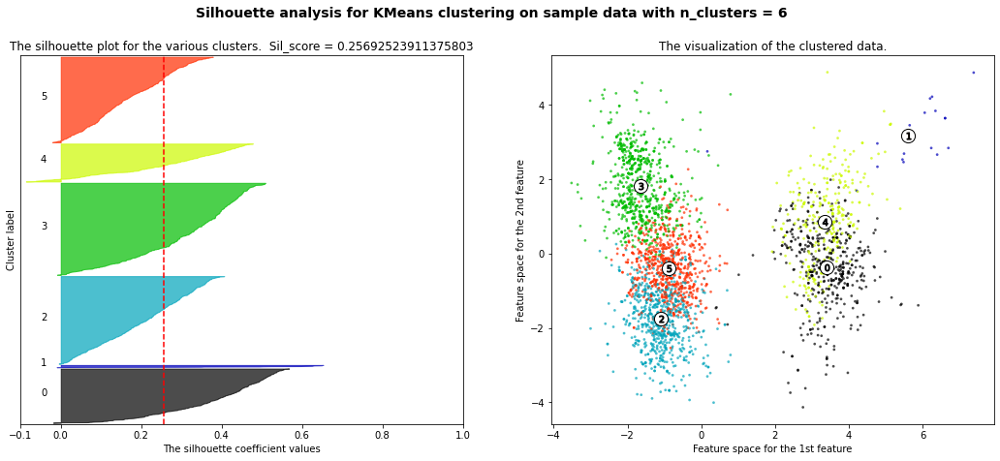

In [179]:
elbow(X_w_pca, title ="Wine Quality")
sil_score_plot(X_w_pca)
sil_score_kmeans_2(X_w_pca)

Balanced Accuracy of clustering: 0.6891957410375815


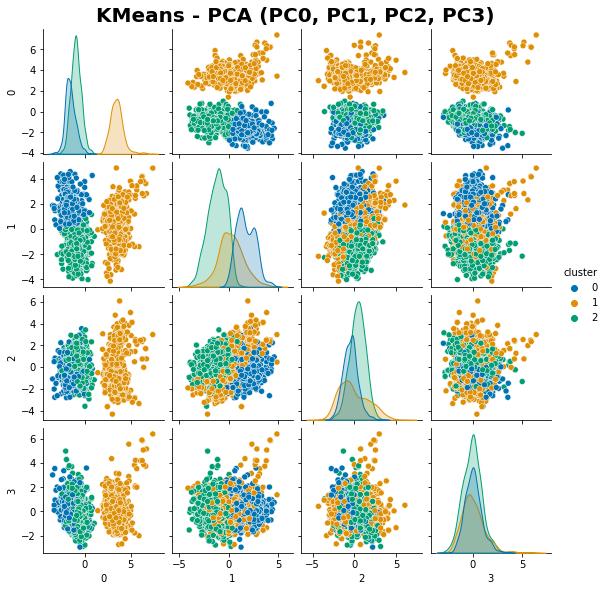

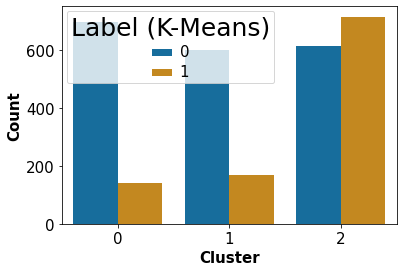

<Figure size 144x144 with 0 Axes>

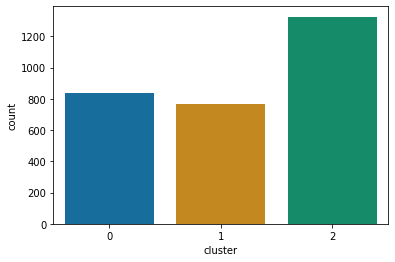

In [197]:
n_clusters = 3
X_val = X_w_pca
km_w = KMeans(n_clusters=n_clusters, random_state = 2)

km_w.fit(X_val)
cluster = km_w.predict(X_val)
df_w = pd.DataFrame(X_val)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[[0,1,2,3, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("KMeans - PCA (PC0, PC1, PC2, PC3)", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()

get_dist(X_val, y_w, km_w)

### PCA EM

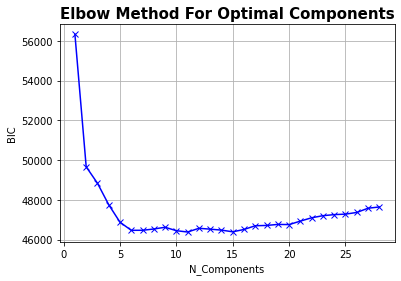

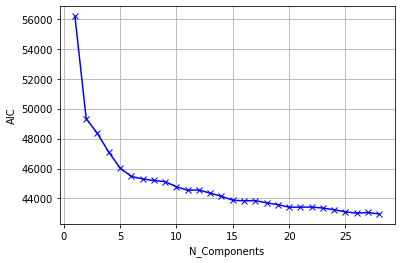

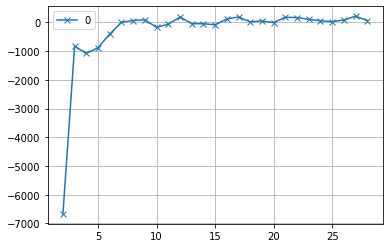

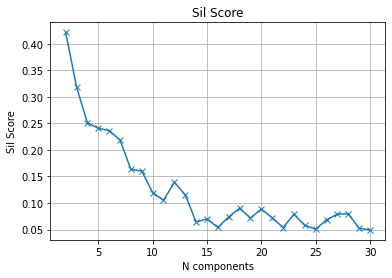

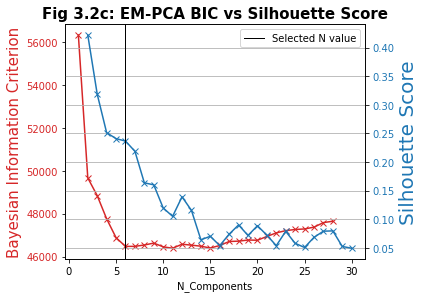

In [157]:
elbow_EM(X_w_pca, return_result = False)
sil_score_plot_EM(X_w_pca)
twinx_EM(X_w_pca, axline=6, title = "Fig 3.2c: EM-PCA BIC vs Silhouette Score")

Balanced Accuracy of clustering: 0.7720897338379609


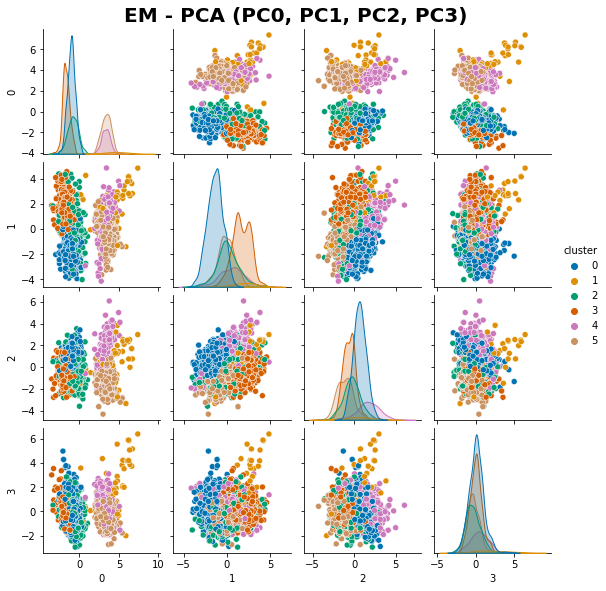

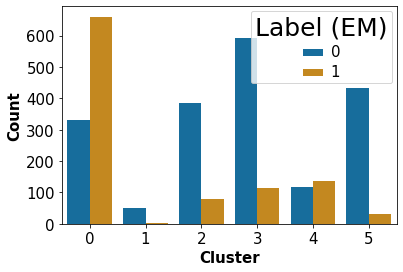

<Figure size 144x144 with 0 Axes>

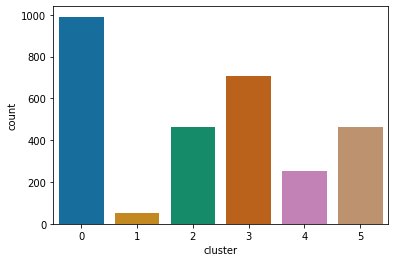

In [202]:
#Wine
n_clusters = 6
X_val = X_w_pca
gmm_w = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_w.fit(X_val)
cluster = gmm_w.predict(X_val)
df_w = pd.DataFrame(X_val)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[[0,1,2,3, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')
g.fig.suptitle("EM - PCA (PC0, PC1, PC2, PC3)", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()
get_dist(X_val,y_w, gmm_w, em = True)

## ICA WQ

### ICA KM

Using Kneed
5


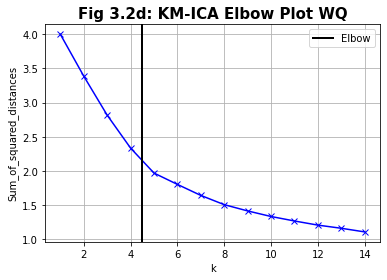

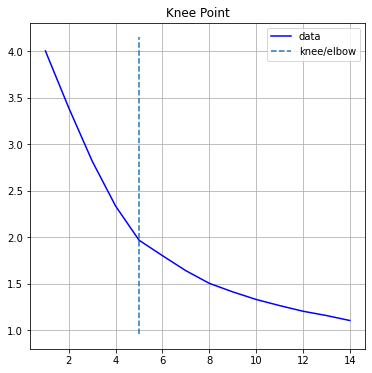

For n_clusters = 2 The average silhouette_score is : 0.19035129351323293
For n_clusters = 3 The average silhouette_score is : 0.22421537871174524
For n_clusters = 4 The average silhouette_score is : 0.21486774287033578
For n_clusters = 5 The average silhouette_score is : 0.23264884553276674
For n_clusters = 6 The average silhouette_score is : 0.23796109808595936


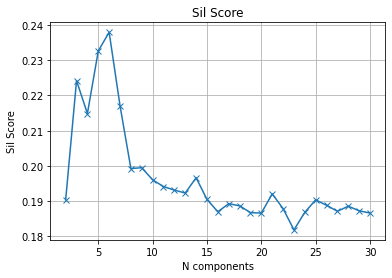

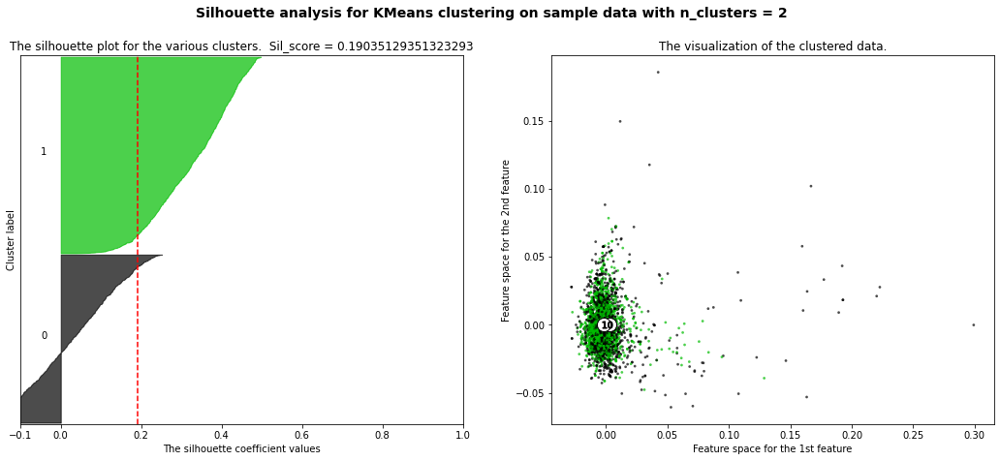

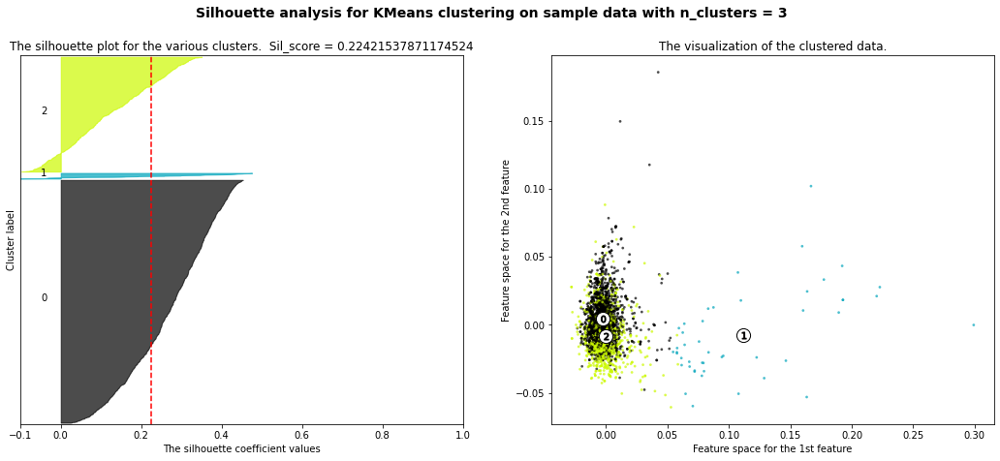

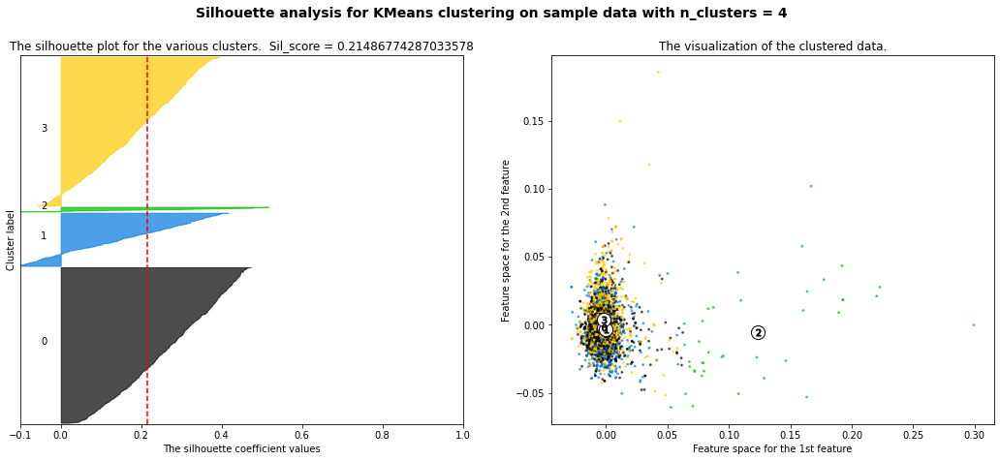

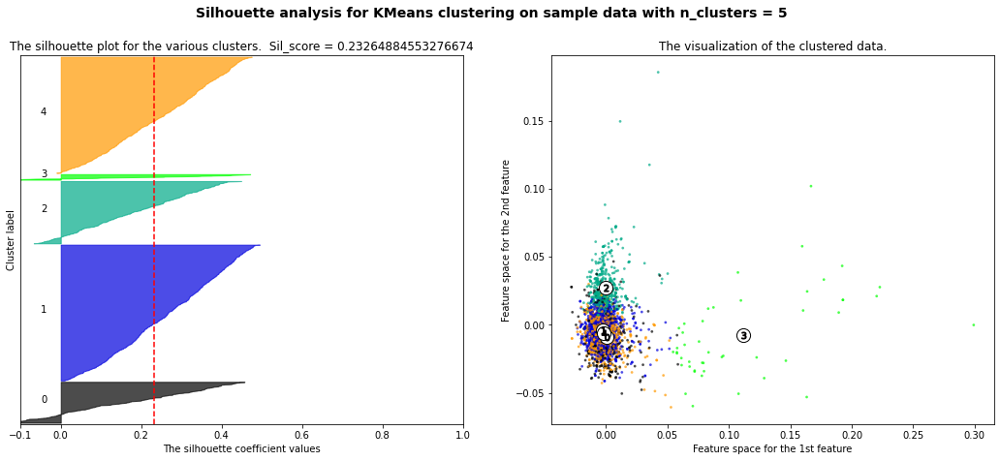

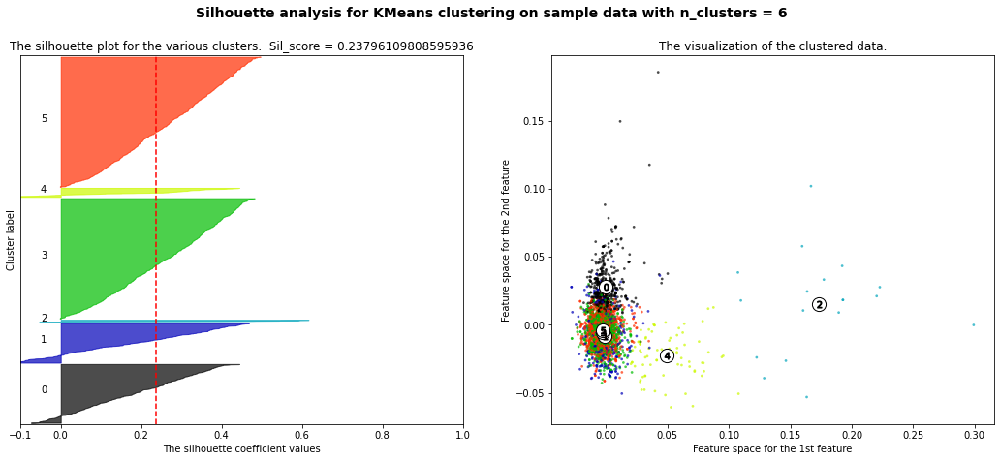

In [158]:
elbow(X_w_ICA, title ="Fig 3.2d: KM-ICA Elbow Plot WQ")
sil_score_plot(X_w_ICA)
sil_score_kmeans_2(X_w_ICA)

Balanced Accuracy of clustering: 0.5718498320790407


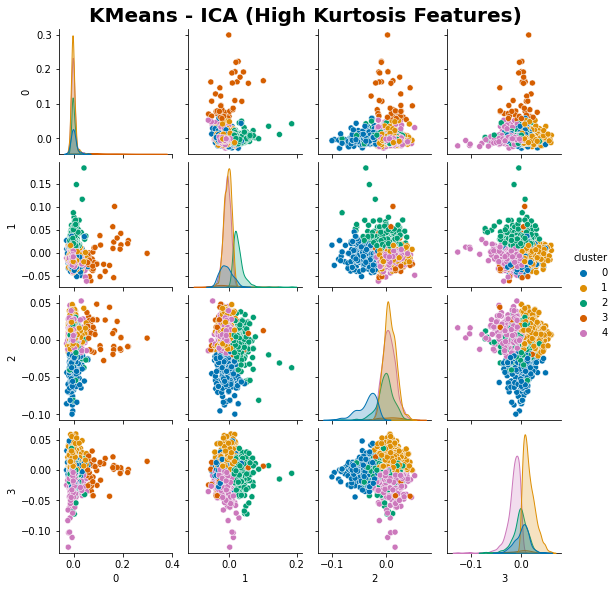

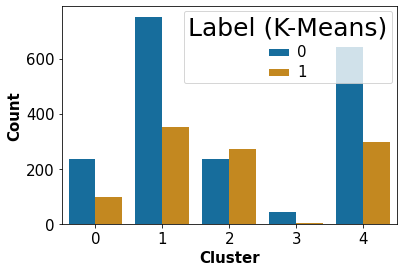

<Figure size 144x144 with 0 Axes>

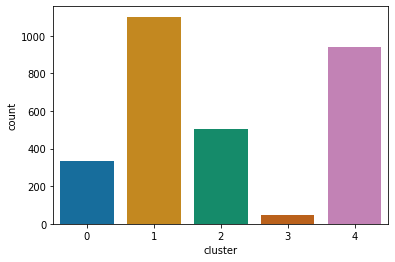

In [205]:
n_clusters = 5
X_val = X_w_ICA
km_w = KMeans(n_clusters=n_clusters, random_state = 2)

km_w.fit(X_val)
cluster = km_w.predict(X_val)
df_w = pd.DataFrame(X_val)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[[0,1,2,3, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("KMeans - ICA (High Kurtosis Features)", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()

get_dist(X_val, y_w, km_w)

### ICA EM

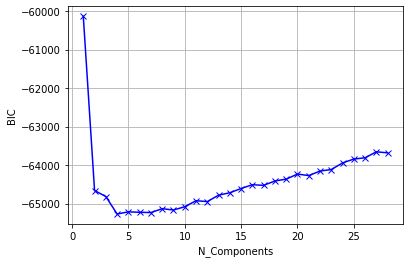

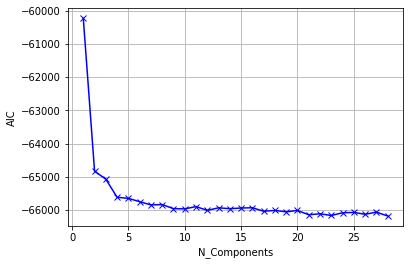

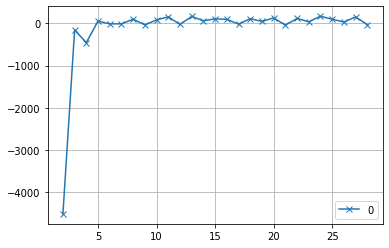

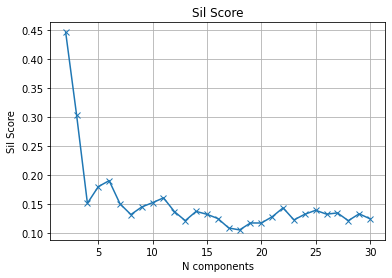

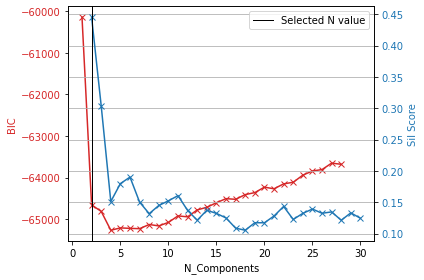

In [206]:
elbow_EM(X_w_ICA, return_result = False)
sil_score_plot_EM(X_w_ICA)
twinx_EM(X_w_ICA)

Balanced Accuracy of clustering: 0.5421070985959764


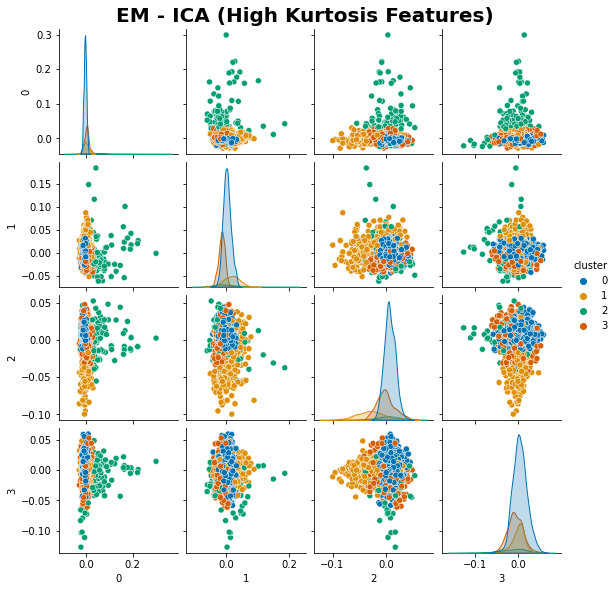

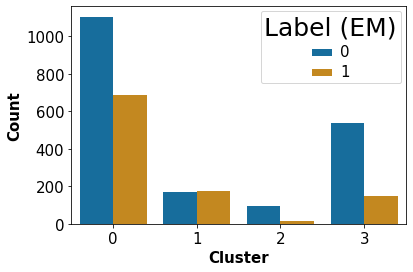

<Figure size 144x144 with 0 Axes>

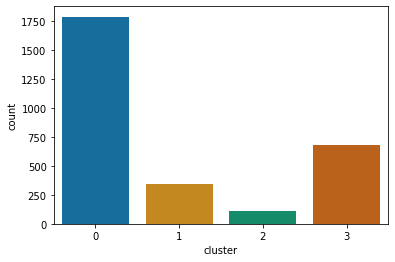

In [207]:
#Wine
n_clusters = 4
X_val = X_w_ICA
gmm_w = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_w.fit(X_val)
cluster = gmm_w.predict(X_val)
df_w = pd.DataFrame(X_val)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[[0,1,2,3, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')
g.fig.suptitle("EM - ICA (High Kurtosis Features)", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()
get_dist(X_val,y_w, gmm_w, em = True)

# RP WQ

Using Kneed
4


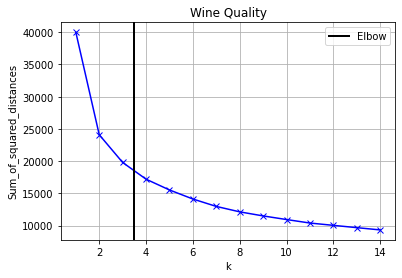

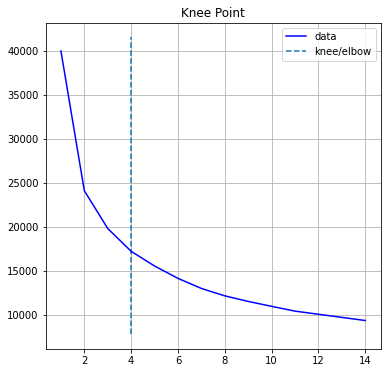

For n_clusters = 2 The average silhouette_score is : 0.45003871033992654
For n_clusters = 3 The average silhouette_score is : 0.4323559052629839
For n_clusters = 4 The average silhouette_score is : 0.23162436997260516
For n_clusters = 5 The average silhouette_score is : 0.22388362283556507
For n_clusters = 6 The average silhouette_score is : 0.2208127271151868


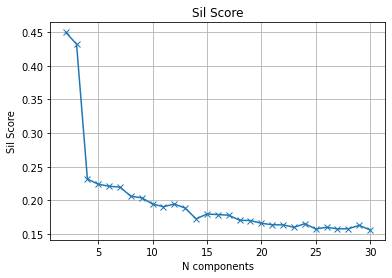

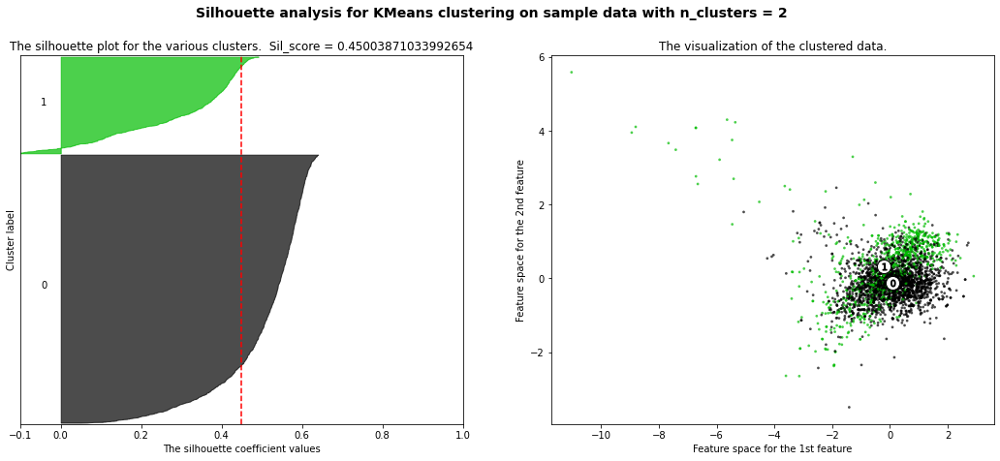

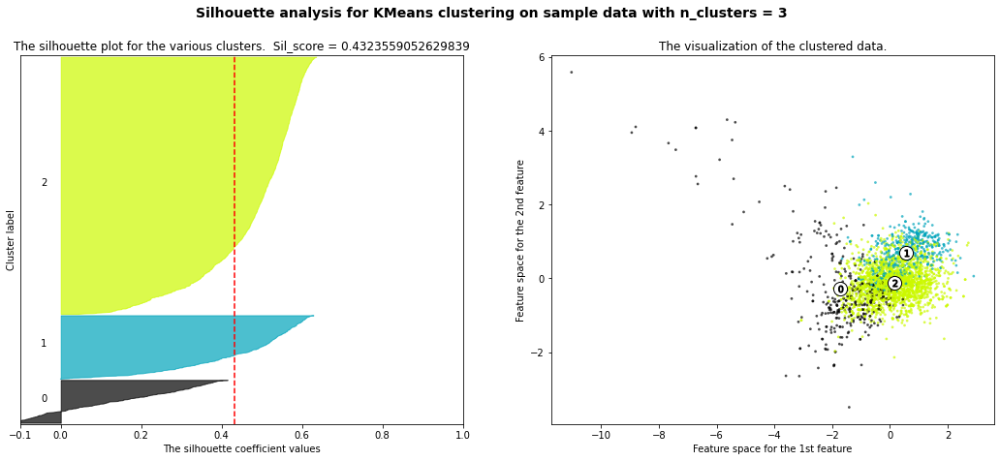

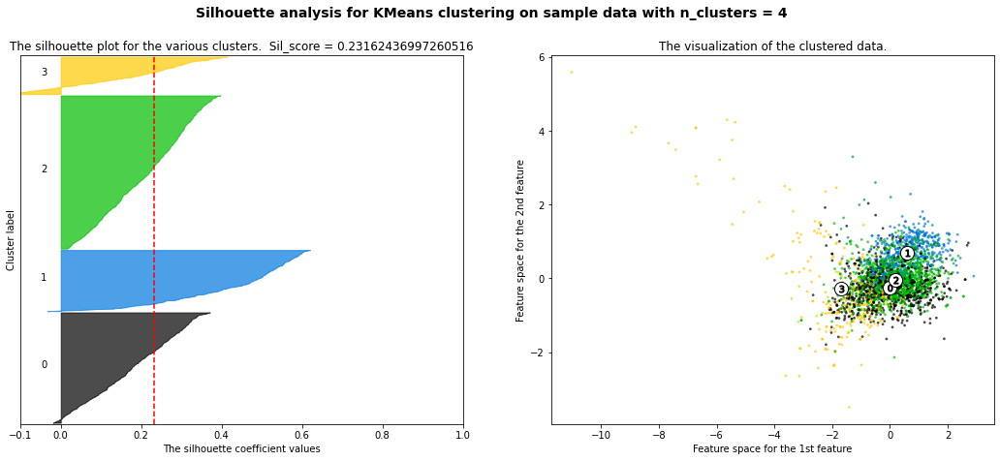

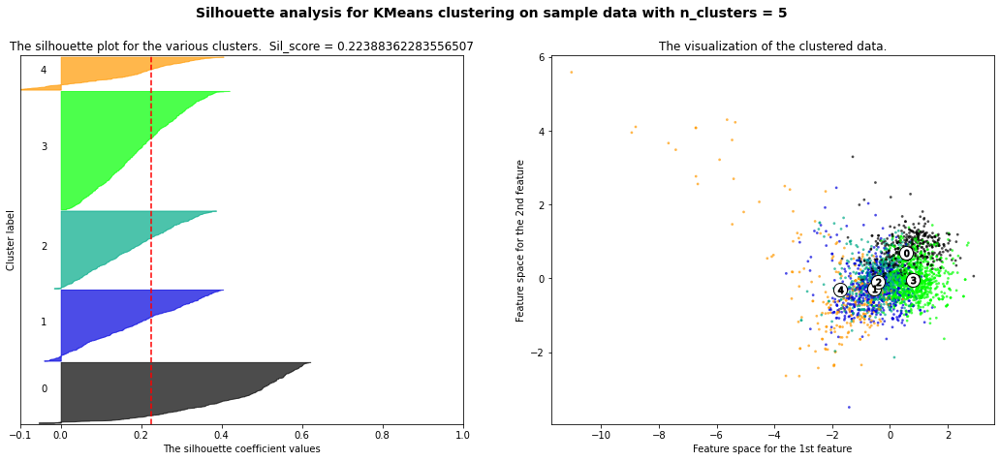

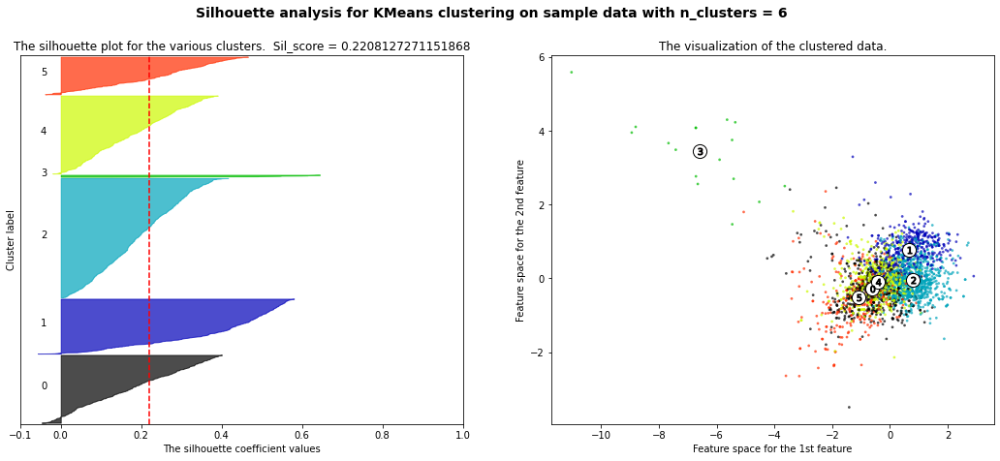

In [208]:
elbow(X_w_rp, title ="Wine Quality")
sil_score_plot(X_w_rp)
sil_score_kmeans_2(X_w_rp)

Balanced Accuracy of clustering: 0.6114672629885154


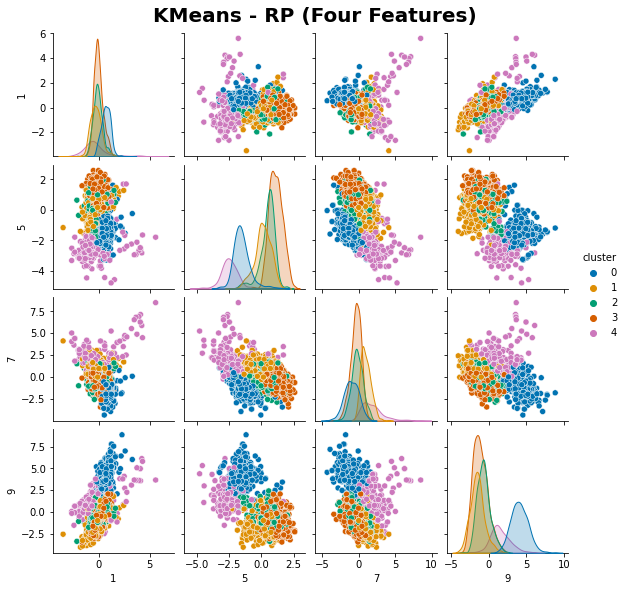

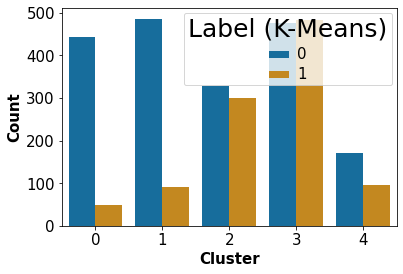

<Figure size 144x144 with 0 Axes>

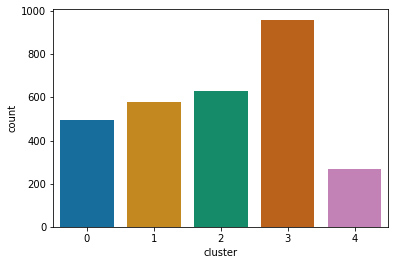

In [14]:
n_clusters = 5
X_val = X_w_rp
km_w = KMeans(n_clusters=n_clusters, random_state = 2)

km_w.fit(X_val)
cluster = km_w.predict(X_val)
df_w = pd.DataFrame(X_val)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[[1,5,7,9, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("KMeans - RP (Four Features)", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()

get_dist(X_val, y_w, km_w)

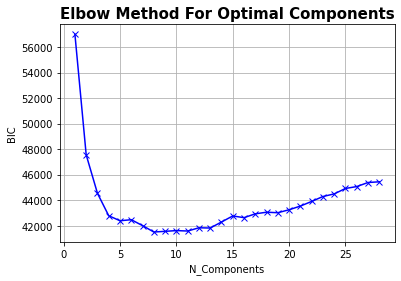

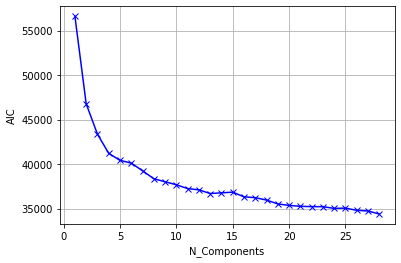

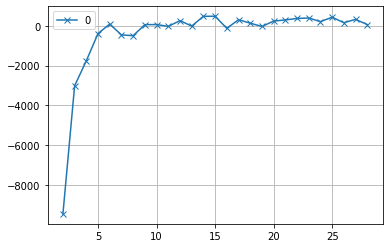

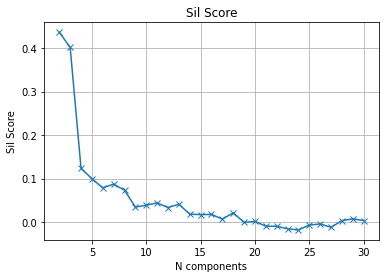

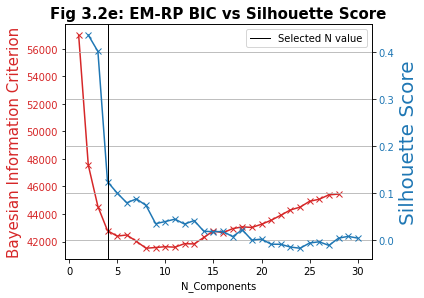

In [160]:
elbow_EM(X_w_rp, return_result = False)
sil_score_plot_EM(X_w_rp)
twinx_EM(X_w_rp, axline=4, title = "Fig 3.2e: EM-RP BIC vs Silhouette Score")

Balanced Accuracy of clustering: 0.7425876211514154


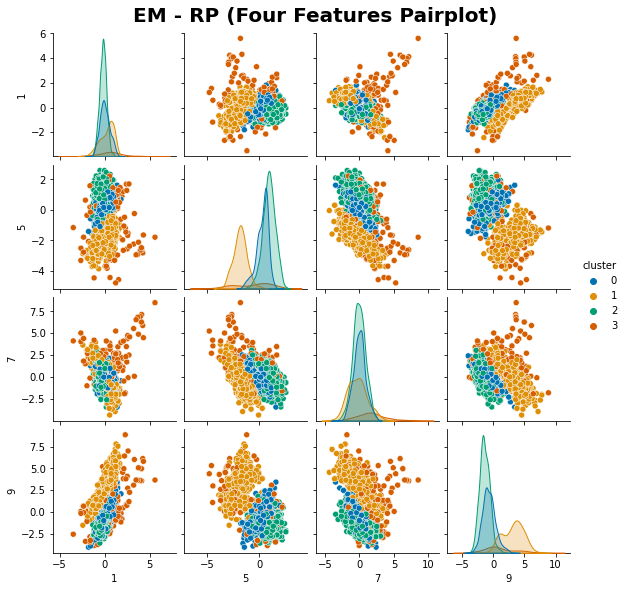

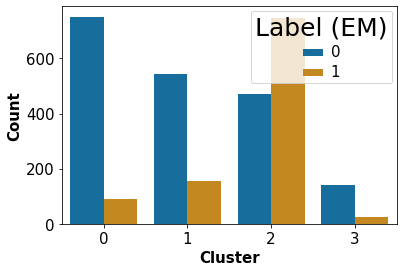

<Figure size 144x144 with 0 Axes>

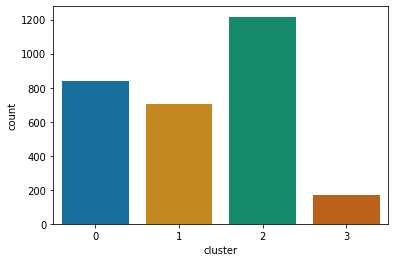

In [21]:
#Wine
n_clusters = 4
X_val = X_w_rp
gmm_w = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_w.fit(X_val)
cluster = gmm_w.predict(X_val)
df_w = pd.DataFrame(X_val)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[[1,5,7,9, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')
g.fig.suptitle("EM - RP (Four Features Pairplot)", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()
get_dist(X_val,y_w, gmm_w, em = True)

Using Kneed
4


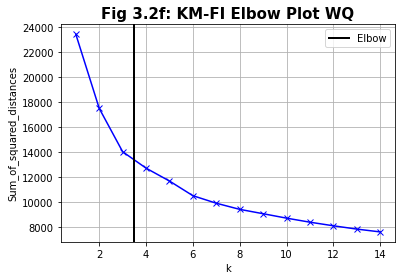

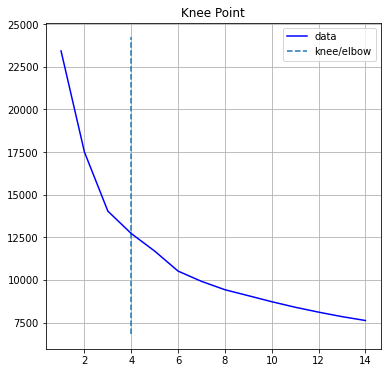

For n_clusters = 2 The average silhouette_score is : 0.2929844088055531
For n_clusters = 3 The average silhouette_score is : 0.2504816950531363
For n_clusters = 4 The average silhouette_score is : 0.25838204437614587
For n_clusters = 5 The average silhouette_score is : 0.20356884035794148
For n_clusters = 6 The average silhouette_score is : 0.21211664815930883


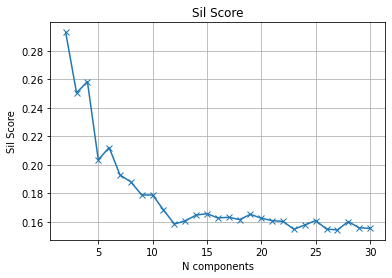

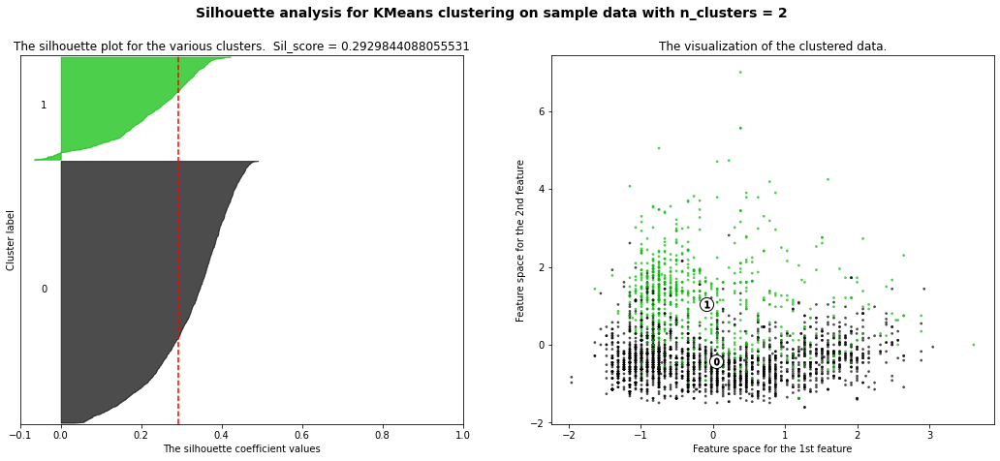

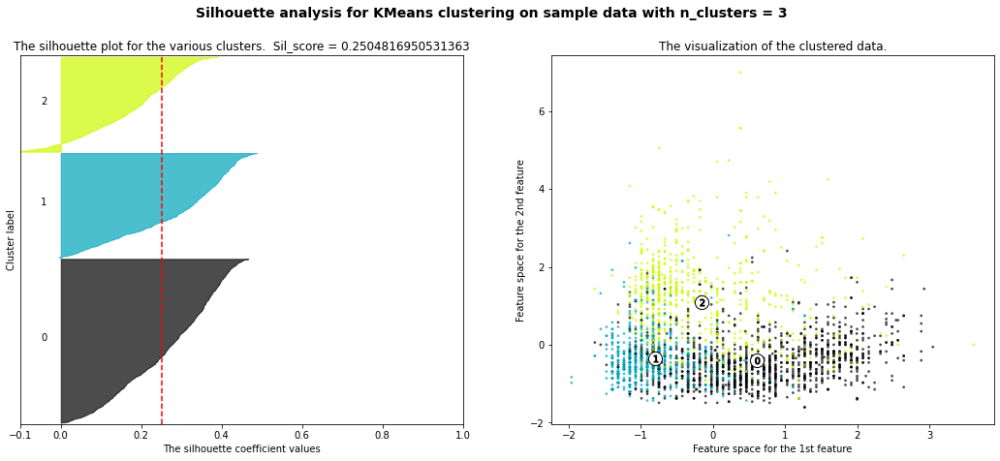

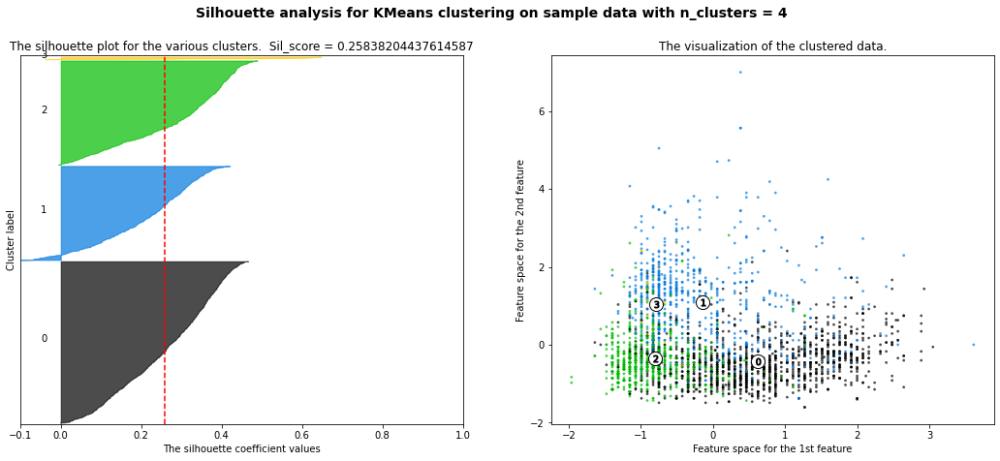

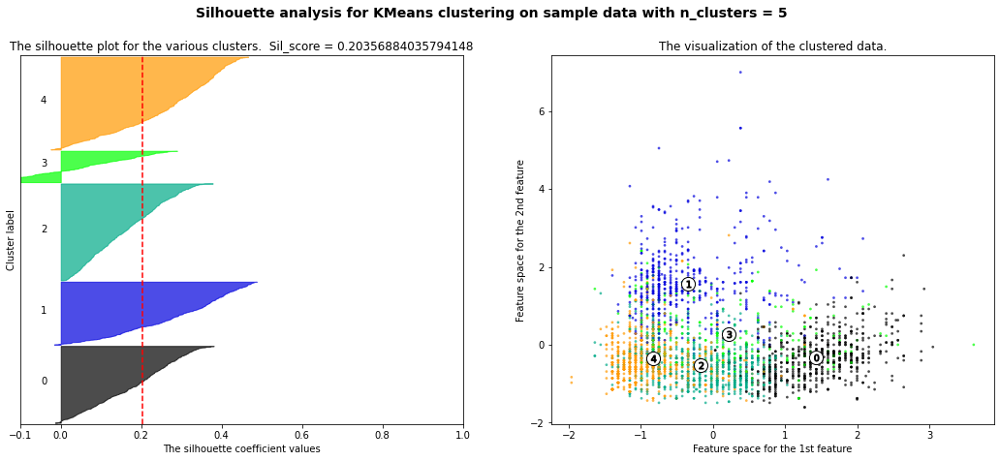

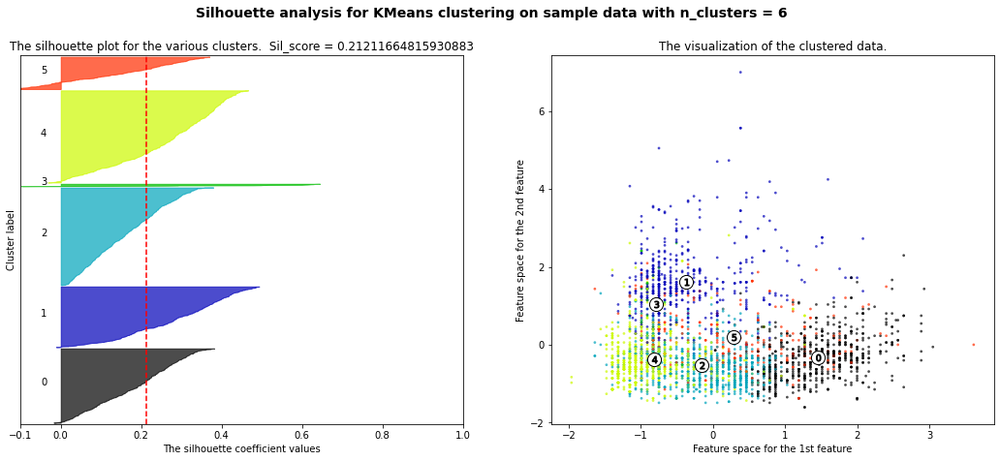

In [163]:
elbow(X_w_FI, title ="Fig 3.2f: KM-FI Elbow Plot WQ")
sil_score_plot(X_w_FI)
sil_score_kmeans_2(X_w_FI)

Balanced Accuracy of clustering: 0.7012067505304187


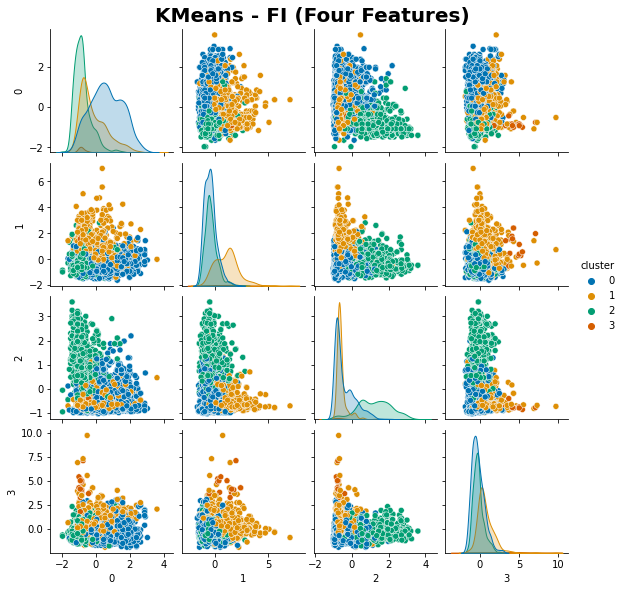

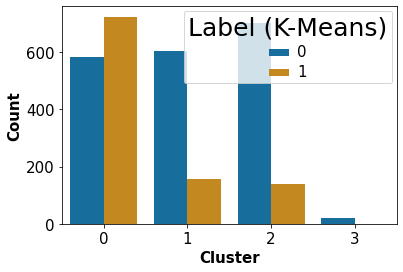

<Figure size 144x144 with 0 Axes>

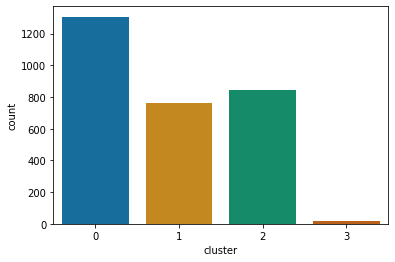

In [28]:
n_clusters = 4
X_val = X_w_FI
km_w = KMeans(n_clusters=n_clusters, random_state = 2)

km_w.fit(X_val)
cluster = km_w.predict(X_val)
df_w = pd.DataFrame(X_val)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[[0,1,2,3, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')

g.fig.suptitle("KMeans - FI (Four Features)", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()

get_dist(X_val, y_w, km_w)

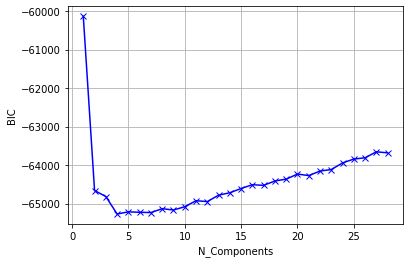

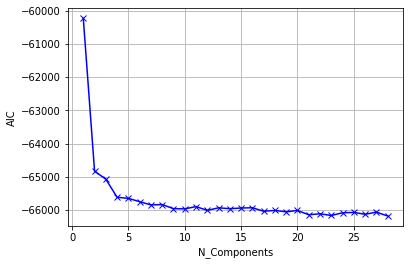

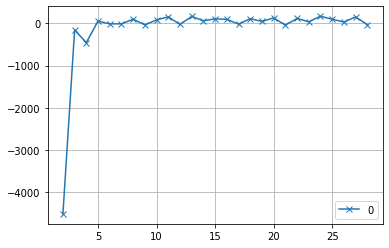

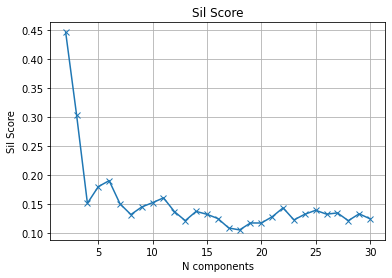

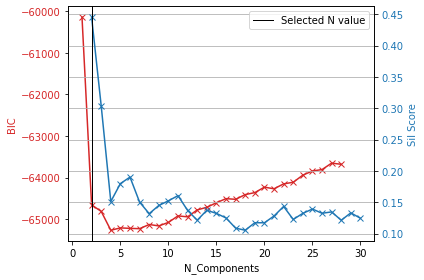

In [27]:
elbow_EM(X_w_ICA, return_result = False)
sil_score_plot_EM(X_w_ICA)
twinx_EM(X_w_ICA)

Balanced Accuracy of clustering: 0.7137873405213125


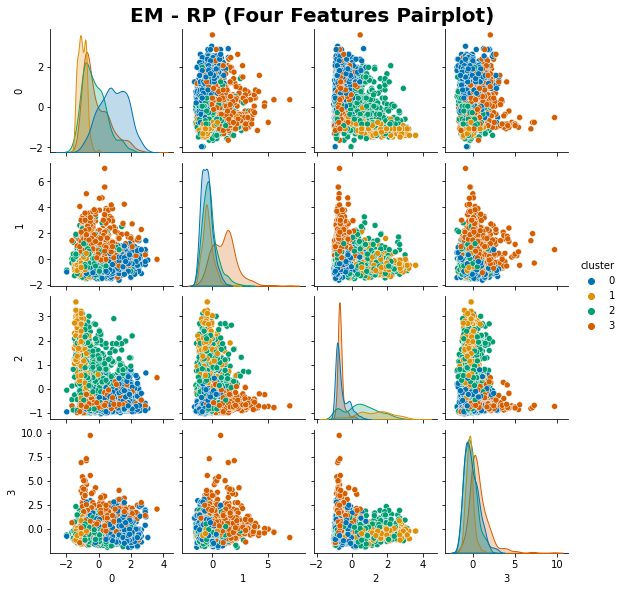

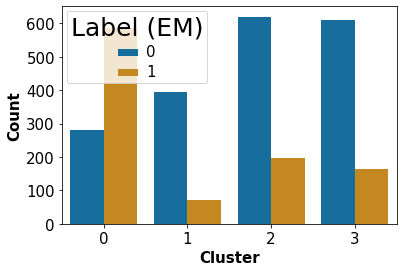

<Figure size 144x144 with 0 Axes>

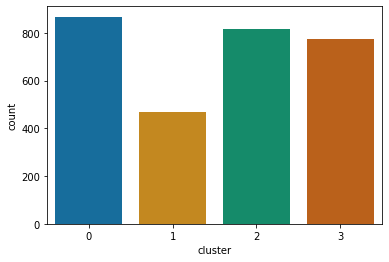

In [29]:
#Wine
n_clusters = 4
X_val = X_w_FI
gmm_w = GaussianMixture(n_components = n_clusters, random_state = random_seed)
gmm_w.fit(X_val)
cluster = gmm_w.predict(X_val)
df_w = pd.DataFrame(X_val)
df_w["cluster"] = cluster

g =sns.pairplot(df_w[[0,1,2,3, "cluster"]], hue="cluster", height = 2, palette = 'colorblind')
g.fig.suptitle("EM - RP (Four Features Pairplot)", y = 1.02, fontsize=20, fontweight ='heavy')

cluster_label_accuracy(cluster, y_w, balanced_accuracy = True)
plt.show()
get_dist(X_val,y_w, gmm_w, em = True)